# Phase 2









# State/UT wise analysis.





**2.1	Analysis of Literacy Rate vs Total Crimes.**







**2.2	 Analysis of the type of crime vs each state vs Literacy rate.**






**2.3	Analysis of year-on-year total crime rate.**







**2.4	 Analysis of area vs overall crime**







**2.5	 Analysis of Population vs overall Crime**







**2.6	Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.**



In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px

**Importing the IPC datasets**

In [4]:

IPC_crimes_data = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\01_District_wise_crimes_committed_IPC_2001_2012.csv')

### Analysis of District-wise crimes committed between 2001 and 2012 classified by IPC

In [5]:
IPC_crimes_data

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


Dataset has 9017 rows and 33 columns.

In [6]:
# Display the names of the columns
IPC_crimes_data.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES'],
      dtype='object')

In [8]:
# Display the datatypes of all the columns
IPC_crimes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9017 entries, 0 to 9016
Data columns (total 33 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   STATE/UT                                             9017 non-null   object
 1   DISTRICT                                             9017 non-null   object
 2   YEAR                                                 9017 non-null   int64 
 3   MURDER                                               9017 non-null   int64 
 4   ATTEMPT TO MURDER                                    9017 non-null   int64 
 5   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER            9017 non-null   int64 
 6   RAPE                                                 9017 non-null   int64 
 7   CUSTODIAL RAPE                                       9017 non-null   int64 
 8   OTHER RAPE                                           9017 non-null   int64 
 9

**STATE/UT and District columns are object and other columns are int datatype.**

In [9]:
# Checking for if any ' ','NA','-', or '-' exist in dataset
IPC_crimes_data.isin([' ','NA','-','?']).any()

STATE/UT                                               False
DISTRICT                                               False
YEAR                                                   False
MURDER                                                 False
ATTEMPT TO MURDER                                      False
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              False
RAPE                                                   False
CUSTODIAL RAPE                                         False
OTHER RAPE                                             False
KIDNAPPING & ABDUCTION                                 False
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            False
KIDNAPPING AND ABDUCTION OF OTHERS                     False
DACOITY                                                False
PREPARATION AND ASSEMBLY FOR DACOITY                   False
ROBBERY                                                False
BURGLARY                                               False
THEFT                   

**There is no white spaces ' ', 'NA', '-', or '-' are present in the dataset.**

In [11]:
# Checking for the null values in the dataset
IPC_crimes_data.isnull().sum().any()

False

**No null values present in the dataset.**

In [12]:
# Checking for the duplicated rows in the dataset
IPC_crimes_data.duplicated().sum()

0

**No duplicated rows present in the dataset.**

In [13]:
# Checking for the unique values in the STATE/UT column
IPC_crimes_data['STATE/UT'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'LAKSHADWEEP', 'PUDUCHERRY'],
      dtype=object)

In [14]:
# Renaming DELHI UT value in STATE/UT column to DELHI
IPC_crimes_data['STATE/UT'] = IPC_crimes_data['STATE/UT'].replace('DELHI UT', 'DELHI')

In [15]:
# Dropping rows which have TOTAL as value in DISTRICT column
IPC_crimes_data = IPC_crimes_data[IPC_crimes_data['DISTRICT'] != 'TOTAL'].reset_index(drop = True)

In [16]:
# Checking the shape of dataframe after updation
IPC_crimes_data.shape

(8609, 33)

In [17]:
# Adding up all the rows, group by 'STATE/UT' and 'YEAR'
IPC_crimes_data = IPC_crimes_data.groupby(['STATE/UT', 'YEAR'], sort = False).sum().reset_index()

In [18]:
IPC_crimes_data

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,2001,2602,1555,136,871,0,871,1182,765,...,872,34947,420,3544,2271,5791,7,7400,34344,130089
1,ARUNACHAL PRADESH,2001,83,53,3,33,0,33,83,55,...,13,466,0,78,3,11,0,0,618,2342
2,ASSAM,2001,1356,481,40,817,0,817,1480,1070,...,441,5805,59,850,4,1248,0,2010,9315,36877
3,BIHAR,2001,3643,3419,250,888,0,888,2159,518,...,502,7544,859,562,21,1558,83,2406,36667,88432
4,CHHATTISGARH,2001,880,529,45,959,0,959,207,171,...,215,5477,70,1763,161,840,0,689,15790,38460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,D & N HAVELI,2012,7,2,0,3,0,3,13,9,...,12,25,0,2,0,0,0,23,112,318
416,DAMAN & DIU,2012,3,5,0,5,0,5,3,0,...,11,17,0,0,0,3,0,38,46,239
417,DELHI,2012,1042,878,164,1412,0,1412,7940,4320,...,158,3494,268,1454,416,3970,0,1826,30816,108574
418,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60


TOTAL IPC CRIMES column do not contain accuarte values for total crimes.

In [19]:
# Dropping 'TOTAL IPC CRIMES' column
IPC_crimes_data.drop('TOTAL IPC CRIMES', axis = 1, inplace = True)

In [20]:
# Adding up all the crimes and storing it into new 'TOTAL IPC CRIMES' column
IPC_crimes_data['TOTAL IPC CRIMES'] = IPC_crimes_data.iloc[:, 2:-1].sum(axis = 1)

In [21]:
IPC_crimes_data

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,2001,2602,1555,136,871,0,871,1182,765,...,872,34947,420,3544,2271,5791,7,7400,34344,114549
1,ARUNACHAL PRADESH,2001,83,53,3,33,0,33,83,55,...,13,466,0,78,3,11,0,0,618,2283
2,ASSAM,2001,1356,481,40,817,0,817,1480,1070,...,441,5805,59,850,4,1248,0,2010,9315,35226
3,BIHAR,2001,3643,3419,250,888,0,888,2159,518,...,502,7544,859,562,21,1558,83,2406,36667,64513
4,CHHATTISGARH,2001,880,529,45,959,0,959,207,171,...,215,5477,70,1763,161,840,0,689,15790,28648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,D & N HAVELI,2012,7,2,0,3,0,3,13,9,...,12,25,0,2,0,0,0,23,112,290
416,DAMAN & DIU,2012,3,5,0,5,0,5,3,0,...,11,17,0,0,0,3,0,38,46,256
417,DELHI,2012,1042,878,164,1412,0,1412,7940,4320,...,158,3494,268,1454,416,3970,0,1826,30816,131174
418,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,35


In [23]:
# Importing the dataset containing the collected data in first phase
df = pd.read_csv("STATE_UT_POPULATION.csv")

In [20]:
df

,STATE/UT,AREA (sq. km.),POPULATION (2001),POPULATION (2011),LITERACY RATE (%) - 2001,LITERACY RATE (%) - 2011,POPULATION (2002),POPULATION (2003),POPULATION (2004),POPULATION (2005),...,LITERACY RATE (%) - 2005,LITERACY RATE (%) - 2006,LITERACY RATE (%) - 2007,LITERACY RATE (%) - 2008,LITERACY RATE (%) - 2009,LITERACY RATE (%) - 2010,LITERACY RATE (%) - 2012,AVERAGE POPULATION (2001-2012),AVERAGE LITERACY RATE (2001-2012),POPULATION GROWTH RATE (2001-2012)
0,ANDHRA PRADESH,275045,75728400,84664012.0,60.47,67.02,76621961.0,77515522.0,78409084.0,79302645.0,...,63.09,63.74,64.40,65.05,65.71,66.36,67.68,80642987.0,64.07,12.98
1,ARUNACHAL PRADESH,83743,1098328,1383727.0,54.34,65.38,1126868.0,1155408.0,1183948.0,1212488.0,...,58.76,59.86,60.96,62.07,63.17,64.28,66.48,1255298.0,60.41,28.58
2,ASSAM,78438,26638600,31169272.0,63.25,72.19,27091667.0,27544734.0,27997802.0,28450869.0,...,66.83,67.72,68.61,69.51,70.40,71.30,73.08,29130470.0,68.17,18.71
3,BIHAR,94163,82879910,103804630.0,47.00,61.80,84972382.0,87064854.0,89157326.0,91249798.0,...,52.92,54.40,55.88,57.36,58.84,60.32,63.28,94388506.0,55.14,27.77
4,CHHATTISGARH,135192,20834530,25540196.0,64.66,70.28,21305097.0,21775663.0,22246230.0,22716796.0,...,66.91,67.47,68.03,68.59,69.16,69.72,70.84,23422646.0,67.75,24.84
5,GOA,3702,1348900,1457723.0,82.01,88.70,1359782.0,1370665.0,1381547.0,1392429.0,...,84.69,85.36,86.02,86.69,87.36,88.03,89.37,1408753.0,85.69,8.87
6,GUJARAT,196244,50597200,60383628.0,69.14,78.03,51575843.0,52554486.0,53533128.0,54511771.0,...,72.70,73.59,74.47,75.36,76.25,77.14,78.92,55979735.0,74.03,21.28
7,HARYANA,44212,21083900,25753081.0,67.91,75.55,21550818.0,22017736.0,22484654.0,22951572.0,...,70.97,71.73,72.49,73.26,74.02,74.79,76.31,23651950.0,72.11,24.36
8,HIMACHAL PRADESH,55673,6077453,6856509.0,76.48,82.80,6155359.0,6233264.0,6311170.0,6389075.0,...,79.01,79.64,80.27,80.90,81.54,82.17,83.43,6505934.0,79.96,14.10
9,JAMMU & KASHMIR,222236,10070300,12548926.0,55.52,67.16,10318163.0,10566025.0,10813888.0,11061750.0,...,60.18,61.34,62.50,63.67,64.83,66.00,68.32,11433544.0,61.92,27.07


In [24]:
# Display the names of the columns
df.columns

Index(['STATE/UT', 'AREA (sq. km.)', 'POPULATION (2001)', 'POPULATION (2011)',
       'LITERACY RATE (%) - 2001', 'LITERACY RATE (%) - 2011',
       'POPULATION (2002)', 'POPULATION (2003)', 'POPULATION (2004)',
       'POPULATION (2005)', 'POPULATION (2006)', 'POPULATION (2007)',
       'POPULATION (2008)', 'POPULATION (2009)', 'POPULATION (2010)',
       'POPULATION (2012)', 'LITERACY RATE (%) - 2002',
       'LITERACY RATE (%) - 2003', 'LITERACY RATE (%) - 2004',
       'LITERACY RATE (%) - 2005', 'LITERACY RATE (%) - 2006',
       'LITERACY RATE (%) - 2007', 'LITERACY RATE (%) - 2008',
       'LITERACY RATE (%) - 2009', 'LITERACY RATE (%) - 2010',
       'LITERACY RATE (%) - 2012', 'AVERAGE POPULATION (2001-2012)',
       'AVERAGE LITERACY RATE (2001-2012)',
       'POPULATION GROWTH RATE (2001-2012)'],
      dtype='object')

In [25]:
# Extracting murder data for all the years from IPC_crimes_data
df['MURDER (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['MURDER'].sum().to_list()

In [26]:
# Extracting attempt to murder data for all the years from IPC_crimes_data
df['ATTEMPT TO MURDER (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['ATTEMPT TO MURDER'].sum().to_list()

In [27]:
# Extracting culpable homicide not amounting to murder data for all the years from IPC_crimes_data
df['CULPABLE HOMICIDE NOT AMOUNTING TO MURDER (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['CULPABLE HOMICIDE NOT AMOUNTING TO MURDER'].sum().to_list()

In [28]:
# Extracting rape data for each year from IPC_crimes_data
df['RAPE (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['RAPE'].sum().to_list()

In [29]:
# Extracting custodial rape data for all the years from IPC_crimes_data
df['CUSTODIAL RAPE (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['CUSTODIAL RAPE'].sum().to_list()

In [30]:
# Extracting other rape data for all the years from IPC_crimes_data
df['OTHER RAPE (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['OTHER RAPE'].sum().to_list()

In [31]:
# Extracting kidnapping and abduction data for all the years from IPC_crimes_data
df['KIDNAPPING & ABDUCTION (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['KIDNAPPING & ABDUCTION'].sum().to_list()

In [32]:
# Extracting kidnapping and abduction of women and girls data for all the years from IPC_crimes_data
df['KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS'].sum().to_list()

In [33]:
# Extracting kidnapping and abduction of others data for all the years from IPC_crimes_data
df['KIDNAPPING AND ABDUCTION OF OTHERS (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['KIDNAPPING AND ABDUCTION OF OTHERS'].sum().to_list()

In [34]:
# Extracting dacoity data for all the years from IPC_crimes_data
df['DACOITY (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['DACOITY'].sum().to_list()

In [35]:
# Extracting preparation and assembly for dacoity data for all the years from IPC_crimes_data
df['PREPARATION AND ASSEMBLY FOR DACOITY (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['PREPARATION AND ASSEMBLY FOR DACOITY'].sum().to_list()

In [36]:
# Extracting robbery data for all the years from IPC_crimes_data
df['ROBBERY (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['ROBBERY'].sum().to_list()

In [37]:
# Extracting burglary data for all the years from IPC_crimes_data
df['BURGLARY (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['BURGLARY'].sum().to_list()

In [38]:
# Extracting theft data for all the years from IPC_crimes_data
df['THEFT (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['THEFT'].sum().to_list()

In [39]:
# Extracting auto theft data for all the years from IPC_crimes_data
df['AUTO THEFT (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['AUTO THEFT'].sum().to_list()

In [40]:
# Extracting murder data for all the years from IPC_crimes_data
df['OTHER THEFT (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['OTHER THEFT'].sum().to_list()

In [41]:
# Extracting riots data for all the years from IPC_crimes_data
df['RIOTS (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['RIOTS'].sum().to_list()

In [42]:
# Extracting criminal breach of trust data for all the years from IPC_crimes_data
df['CRIMINAL BREACH OF TRUST (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['CRIMINAL BREACH OF TRUST'].sum().to_list()

In [43]:
# Extracting cheating data for all the years from IPC_crimes_data
df['CHEATING (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['CHEATING'].sum().to_list()

In [44]:
# Extracting counterfieting data for all the years from IPC_crimes_data
df['COUNTERFIETING (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['COUNTERFIETING'].sum().to_list()

In [45]:
# Extracting arson data for all the years from IPC_crimes_data
df['ARSON (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['ARSON'].sum().to_list()

In [46]:
# Extracting hurt/grevious data for all the years from IPC_crimes_data
df['HURT/GREVIOUS HURT (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['HURT/GREVIOUS HURT'].sum().to_list()

In [47]:
# Extracting dowry deaths data for all the years from IPC_crimes_data
df['DOWRY DEATHS (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['DOWRY DEATHS'].sum().to_list()

In [48]:
# Extracting assault on women with intent to outrage her modesty deaths data for all the years from IPC_crimes_data
df['ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY'].sum().to_list()

In [49]:
# Extracting insult to modesty of women deaths data for all the years from IPC_crimes_data
df['INSULT TO MODESTY OF WOMEN (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['INSULT TO MODESTY OF WOMEN'].sum().to_list()

In [50]:
# Extracting cruelty by husband or his relatives data for all the years from IPC_crimes_data
df['CRUELTY BY HUSBAND OR HIS RELATIVES (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['CRUELTY BY HUSBAND OR HIS RELATIVES'].sum().to_list()

In [51]:
# Extracting importation of girls from foreign countries data for all the years from IPC_crimes_data
df['IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES'].sum().to_list()

In [52]:
# Extracting causing death by negligence data for all the years from IPC_crimes_data
df['CAUSING DEATH BY NEGLIGENCE (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['CAUSING DEATH BY NEGLIGENCE'].sum().to_list()

In [53]:
# Extracting other IPC crimes data for all the years from IPC_crimes_data
df['OTHER IPC CRIMES (2001-2012)'] = IPC_crimes_data.groupby('STATE/UT', sort = False)['OTHER IPC CRIMES'].sum().to_list()

In [54]:
# Extracting total crimes data for each year from IPC_crimes_data
for year in range(2001, 2013):
    df[f'TOTAL IPC CRIMES ({year})'] = IPC_crimes_data[IPC_crimes_data['YEAR'] == year].groupby('STATE/UT', sort = False)['TOTAL IPC CRIMES'].sum().reset_index()['TOTAL IPC CRIMES']

In [55]:
# Adding up total crimes for all the years
start_column = 'TOTAL IPC CRIMES (2001)'
end_column = 'TOTAL IPC CRIMES (2012)'
df['TOTAL IPC CRIMES (2001-2012)'] = df.loc[:, start_column:end_column].sum(axis = 1)

In [56]:
# Calculating the crime rates for all the years
for year in range(2001, 2013):
    df[f"CRIME RATE ({year})"] = ((df[f"TOTAL IPC CRIMES ({year})"] / df[f"POPULATION ({year})"]) * 100000).round(2)

In [54]:
df

,STATE/UT,AREA (sq. km.),POPULATION (2001),POPULATION (2011),LITERACY RATE (%) - 2001,LITERACY RATE (%) - 2011,POPULATION (2002),POPULATION (2003),POPULATION (2004),POPULATION (2005),...,CRIME RATE (2003),CRIME RATE (2004),CRIME RATE (2005),CRIME RATE (2006),CRIME RATE (2007),CRIME RATE (2008),CRIME RATE (2009),CRIME RATE (2010),CRIME RATE (2011),CRIME RATE (2012)
0,ANDHRA PRADESH,275045,75728400,84664012.0,60.47,67.02,76621961.0,77515522.0,78409084.0,79302645.0,...,185.19,189.28,183.78,195.49,196.15,199.96,193.29,203.22,216.44,215.27
1,ARUNACHAL PRADESH,83743,1098328,1383727.0,54.34,65.38,1126868.0,1155408.0,1183948.0,1212488.0,...,168.34,171.80,195.14,184.69,185.89,181.03,169.22,175.33,159.93,162.36
2,ASSAM,78438,26638600,31169272.0,63.25,72.19,27091667.0,27544734.0,27997802.0,28450869.0,...,135.11,141.36,140.82,152.64,150.77,159.09,163.01,170.56,176.37,207.22
3,BIHAR,94163,82879910,103804630.0,47.00,61.80,84972382.0,87064854.0,89157326.0,91249798.0,...,78.44,89.50,79.39,81.77,84.21,88.03,88.47,89.43,97.96,127.10
4,CHHATTISGARH,135192,20834530,25540196.0,64.66,70.28,21305097.0,21775663.0,22246230.0,22716796.0,...,111.96,125.78,129.90,139.85,139.26,156.24,153.98,155.74,152.05,146.23
5,GOA,3702,1348900,1457723.0,82.01,88.70,1359782.0,1370665.0,1381547.0,1392429.0,...,146.94,147.23,144.35,145.16,146.44,177.04,213.03,239.21,248.33,237.44
6,GUJARAT,196244,50597200,60383628.0,69.14,78.03,51575843.0,52554486.0,53533128.0,54511771.0,...,147.30,141.21,132.05,133.59,132.21,140.47,129.86,120.02,118.71,118.26
7,HARYANA,44212,21083900,25753081.0,67.91,75.55,21550818.0,22017736.0,22484654.0,22951572.0,...,128.49,135.00,158.73,184.71,187.45,197.43,196.87,225.46,230.30,231.47
8,HIMACHAL PRADESH,55673,6077453,6856509.0,76.48,82.80,6155359.0,6233264.0,6311170.0,6389075.0,...,95.30,98.71,96.02,98.78,117.76,114.74,103.21,106.53,111.31,98.12
9,JAMMU & KASHMIR,222236,10070300,12548926.0,55.52,67.16,10318163.0,10566025.0,10813888.0,11061750.0,...,129.48,123.97,116.84,113.86,112.83,110.04,121.60,121.98,121.57,109.57


### 2.1	Analysis of Literacy Rate vs Total Crimes.

In [57]:
sns.set(style = 'whitegrid')

In [58]:
# Analysis of Literacy Rate vs Total Crimes
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'TOTAL IPC CRIMES (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),TOTAL IPC CRIMES (2001-2012)
3,BIHAR,55.14,1011418
1,ARUNACHAL PRADESH,60.41,26791
10,JHARKHAND,60.63,357069
9,JAMMU & KASHMIR,61.92,164476
25,UTTAR PRADESH,62.55,1621496
21,RAJASTHAN,63.54,1350424
0,ANDHRA PRADESH,64.07,1858637
13,MADHYA PRADESH,66.81,1529093
4,CHHATTISGARH,67.75,393228
30,D & N HAVELI,67.87,3762


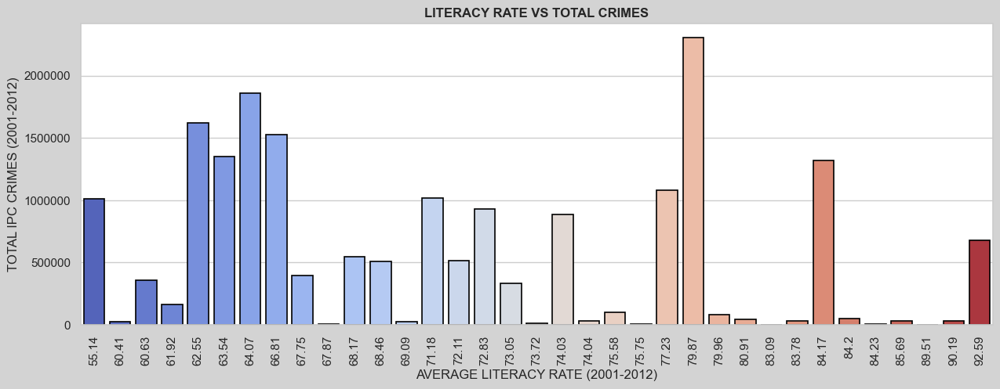

In [59]:
# Bar graph: LITERACY RATE VS TOTAL CRIMES
plt.figure(figsize=(15, 5), facecolor='lightgrey')  # Set facecolor to light grey
colors = sns.color_palette("coolwarm", len(df))  # Use the "coolwarm" palette with the number of colors equal to the number of data points
sns.barplot(x=df['AVERAGE LITERACY RATE (2001-2012)'], y=df['TOTAL IPC CRIMES (2001-2012)'], palette=colors, edgecolor='black', linewidth=1.2)  # Use the specified color palette, add black edges with linewidth 1.2
plt.title('LITERACY RATE VS TOTAL CRIMES', fontweight='bold')  # Set fontweight to bold for the title
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=90)
plt.show()


**Observations:**

**High Literacy, Low Crime: IPC crime rates overall are typically lower in states with higher literacy rates. Lakshadweep, Goa, Mizoram, Puducherry, Kerala, and other regions, for instance, have comparatively high literacy and low crime rates. Delhi has a high percentage of literacy, but it also has a high proportion of IPC crimes. Urbanization, population density, and socioeconomic inequality are some possible causes of this. Maharashtra has a high percentage of literacy, but it also has a high crime rate. This could be impacted by things like the dense population of cities like Mumbai.**


**Low Literacy, High Crime: On the other hand, states like Uttar Pradesh, Bihar, and Jharkhand that have lower literacy rates also typically have higher crime rates.**

**Southern States: Southern Indian states, such as Kerala and Karnataka,Tamil Nadu, and Andhra Pradesh generally have higher literacy rates compared to the national average.**

**Northern States: States in northern India like Bihar, Jharkhand, and Uttar Pradesh tend to have lower literacy rates.**

### 2.2	 Analysis of the type of crime vs each state vs Literacy rate.

#### CRIME TYPE - MURDER

In [61]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'MURDER (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),MURDER (2001-2012)
3,BIHAR,55.14,41245
1,ARUNACHAL PRADESH,60.41,841
10,JHARKHAND,60.63,19060
9,JAMMU & KASHMIR,61.92,6304
25,UTTAR PRADESH,62.55,65443
21,RAJASTHAN,63.54,15844
0,ANDHRA PRADESH,64.07,31756
13,MADHYA PRADESH,66.81,28399
4,CHHATTISGARH,67.75,12060
30,D & N HAVELI,67.87,108


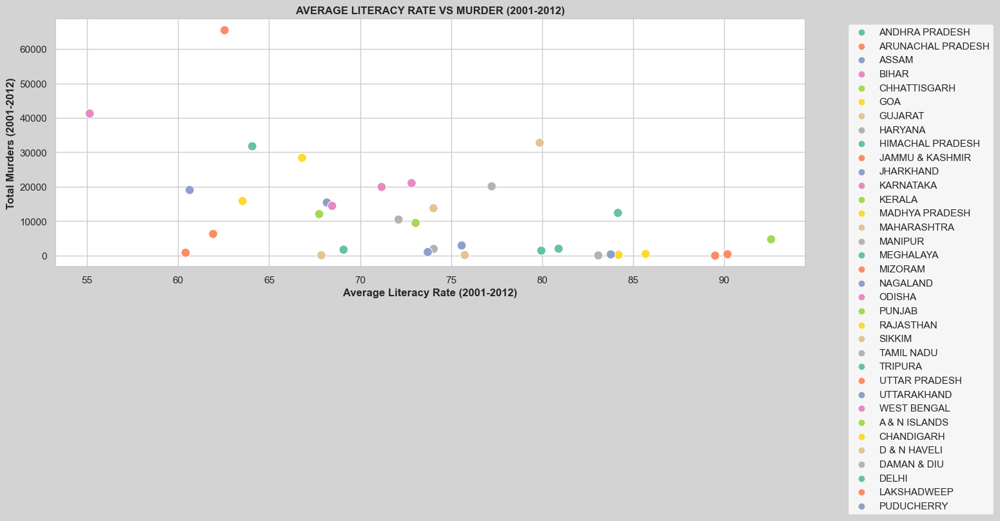

In [147]:
# Scatterplot: AVERAGE LITERACY RATE VS MURDER (2001-2012) with hue='STATE/UT'
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='MURDER (2001-2012)',
                hue='STATE/UT', data=df, palette='Set2', s=100)

# Set plot title and labels with boldweight
plt.title('AVERAGE LITERACY RATE VS MURDER (2001-2012)', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Murders (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**With the highest murder rate of 41,245 and a literacy rate of 55.14, the bar graph illustrates the challenges that Bihar faces. Goa has lower crime rates with 487 recorded murders while having a high literacy rate of 85.69%. Maharashtra has a 79.87% literacy rate, however 32,767 murders are reported there. Kerala stands out for having the lowest crime rates (4,733 murders) and the highest literacy rate (92.59%). Union Territories having the highest rates of literacy—89.51%—and the lowest rates of crime—only three recorded murders—are Lakshadweep. Delhi has a higher crime rate—12,410 murders—despite having an 84.17% literacy rate.**

#### CRIME TYPE - ATTEMPT TO MURDER

In [66]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'ATTEMPT TO MURDER (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),ATTEMPT TO MURDER (2001-2012)
3,BIHAR,55.14,40919
1,ARUNACHAL PRADESH,60.41,417
10,JHARKHAND,60.63,12270
9,JAMMU & KASHMIR,61.92,10303
25,UTTAR PRADESH,62.55,60520
21,RAJASTHAN,63.54,21342
0,ANDHRA PRADESH,64.07,22420
13,MADHYA PRADESH,66.81,29458
4,CHHATTISGARH,67.75,7910
30,D & N HAVELI,67.87,31


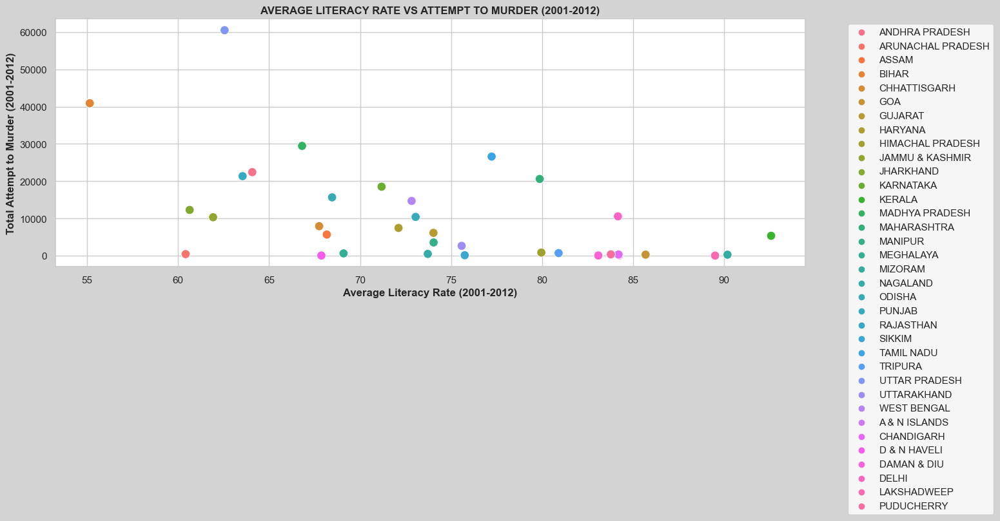

In [148]:
# Scatterplot: AVERAGE LITERACY RATE VS ATTEMPT TO MURDER (2001-2012) with hue='STATE/UT'
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='ATTEMPT TO MURDER (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('AVERAGE LITERACY RATE VS ATTEMPT TO MURDER (2001-2012)', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Attempt to Murder (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations**

**Bihar had the largest number of attempted murders (41,245) and the lowest literacy rate (55.14%). On the other hand, Goa has a low crime rate—only 269 attempted murders—and a high literacy rate of 85.69%. Maharashtra has a problem: in spite of a 79.87% literacy rate, there have been 32,767 reported attempted murders. Kerala stands out due to its 92.59% literacy rate and 5,327 attempted murders, which is a lower crime rate. Union Territories, especially Lakshadweep, stand out for having a low crime rate—just 6 attempted murders have been reported—and a high literacy rate of 89.51%. Delhi, which has a literacy rate of 84.17% and a higher crime rate—10,554 attempted murders—highlights the intricate relationship between problems in law enforcement and education.**

#### CRIME TYPE - CULPABLE HOMICIDE NOT AMOUNTING TO MURDER

In [77]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),CULPABLE HOMICIDE NOT AMOUNTING TO MURDER (2001-2012)
3,BIHAR,55.14,3672
1,ARUNACHAL PRADESH,60.41,36
10,JHARKHAND,60.63,1231
9,JAMMU & KASHMIR,61.92,347
25,UTTAR PRADESH,62.55,17266
21,RAJASTHAN,63.54,889
0,ANDHRA PRADESH,64.07,1763
13,MADHYA PRADESH,66.81,1834
4,CHHATTISGARH,67.75,348
30,D & N HAVELI,67.87,3


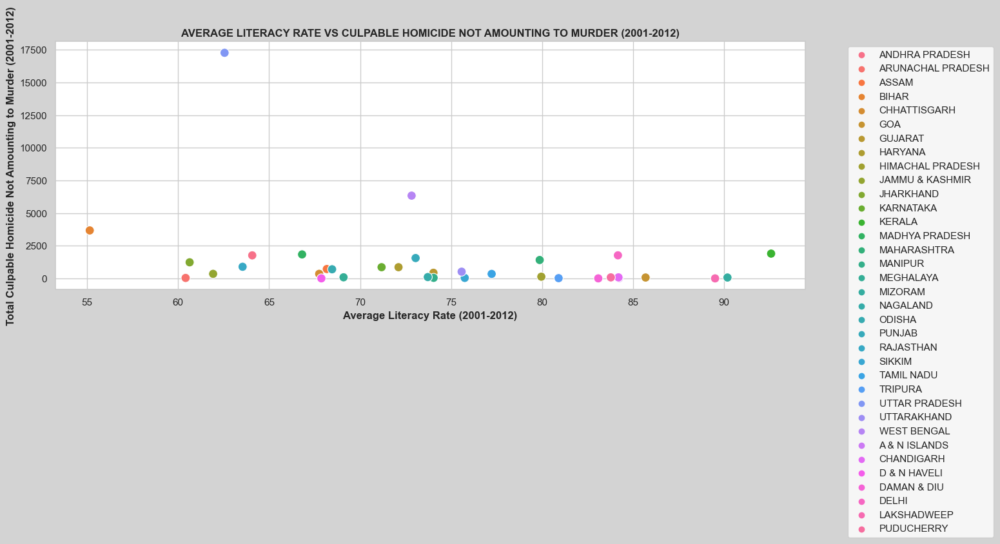

In [149]:
# Scatterplot: AVERAGE LITERACY RATE VS CULPABLE HOMICIDE NOT AMOUNTING TO MURDER (2001-2012) with hue='STATE/UT'
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='CULPABLE HOMICIDE NOT AMOUNTING TO MURDER (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('AVERAGE LITERACY RATE VS CULPABLE HOMICIDE NOT AMOUNTING TO MURDER (2001-2012)', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Culpable Homicide Not Amounting to Murder (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()



**Observations:**

**With a 55.14% literacy rate, Bihar has the lowest rate of any state. It also has 3,672 incidents of culpable homicide that do not constitute murder. Goa, on the other hand, has a comparatively lower crime rate—only 67 incidents of culpable homicide that do not amount to murder—and a higher literacy rate (85.69%). Maharashtra has a problem: even with a 79.87% literacy rate, the state has reported 1,409 instances. Kerala stands out due to its 92.59% literacy rate and 1,897 cases of culpable homicide that do not constitute murder, which is a lower crime rate. Union Territories, with the exception of Lakshadweep, are notable for having a low crime rate of 89.51% and no recorded instances of culpable homicide that falls short of murder. Delhi has a higher crime rate than other cities, with an 84.17% literacy rate and 1,766 incidents of culpable homicide not amounting to murder, underscoring the complex link between education and law enforcement challenges**

#### CRIME TYPE - RAPE

In [79]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'RAPE (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),RAPE (2001-2012)
3,BIHAR,55.14,13124
1,ARUNACHAL PRADESH,60.41,500
10,JHARKHAND,60.63,9159
9,JAMMU & KASHMIR,61.92,2810
25,UTTAR PRADESH,62.55,19058
21,RAJASTHAN,63.54,15798
0,ANDHRA PRADESH,64.07,13479
13,MADHYA PRADESH,66.81,36087
4,CHHATTISGARH,67.75,11838
30,D & N HAVELI,67.87,56


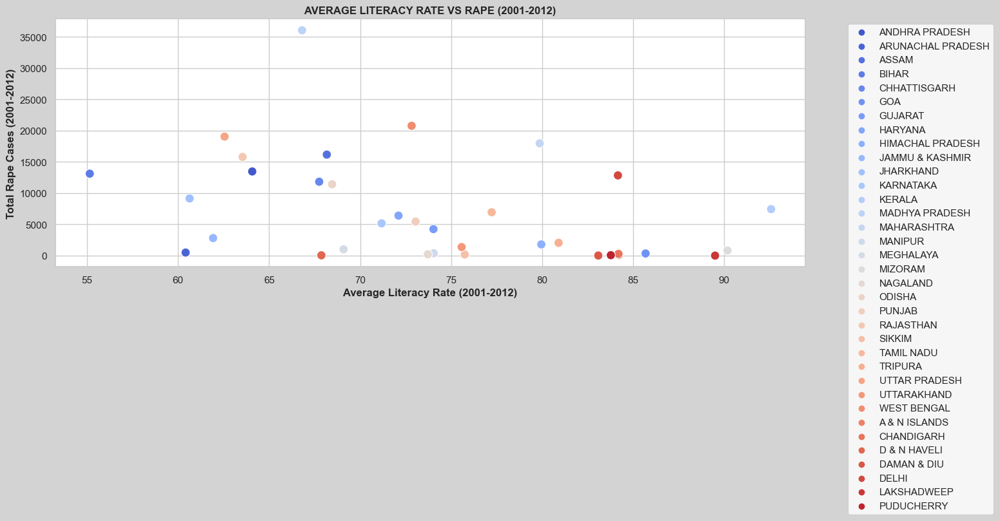

In [150]:
# Scatterplot: AVERAGE LITERACY RATE VS RAPE (2001-2012) with hue='STATE/UT'
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='RAPE (2001-2012)',
                hue='STATE/UT', data=df, palette='coolwarm', s=100)

# Set plot title and labels with boldweight
plt.title('AVERAGE LITERACY RATE VS RAPE (2001-2012)', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Rape Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()



**Observations:**

**The Scatterplot shows that Bihar faces a significant challenge with a 55.14% literacy rate and 13,124 reported rape cases. Despite moderate literacy rates in Uttar Pradesh and Rajasthan, both states report alarming figures of 19,058 and 15,798 rape cases, respectively. Madhya Pradesh, with a 66.81% literacy rate, records the highest number of rape cases at 36,087. In contrast, states like Goa and Kerala, with literacy rates of 85.69% and 92.59%, report lower numbers of rape cases at 350 and 7,447, respectively. Delhi, with an 84.17% literacy rate, stands out with the highest reported cases at 12,848, emphasizing the complex link between education and the prevalence of serious crimes.**

**Higher Literacy Rates: States with higher literacy rates, including Kerala, Himachal Pradesh, and Maharashtra, report lower cases of rape. Higher education levels may contribute to better awareness of consent and personal boundaries.**

**Lower Literacy Rates: Bihar, Madhya Pradesh, and Rajasthan, with lower literacy rates, show higher instances of rape. Limited education may contribute to a lack of understanding of consent and an increased likelihood of sexual violence.**

#### CRIME TYPE - CUSTODIAL RAPE

In [88]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'CUSTODIAL RAPE (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),CUSTODIAL RAPE (2001-2012)
3,BIHAR,55.14,2
1,ARUNACHAL PRADESH,60.41,0
10,JHARKHAND,60.63,5
9,JAMMU & KASHMIR,61.92,0
25,UTTAR PRADESH,62.55,2
21,RAJASTHAN,63.54,0
0,ANDHRA PRADESH,64.07,2
13,MADHYA PRADESH,66.81,1
4,CHHATTISGARH,67.75,0
30,D & N HAVELI,67.87,0


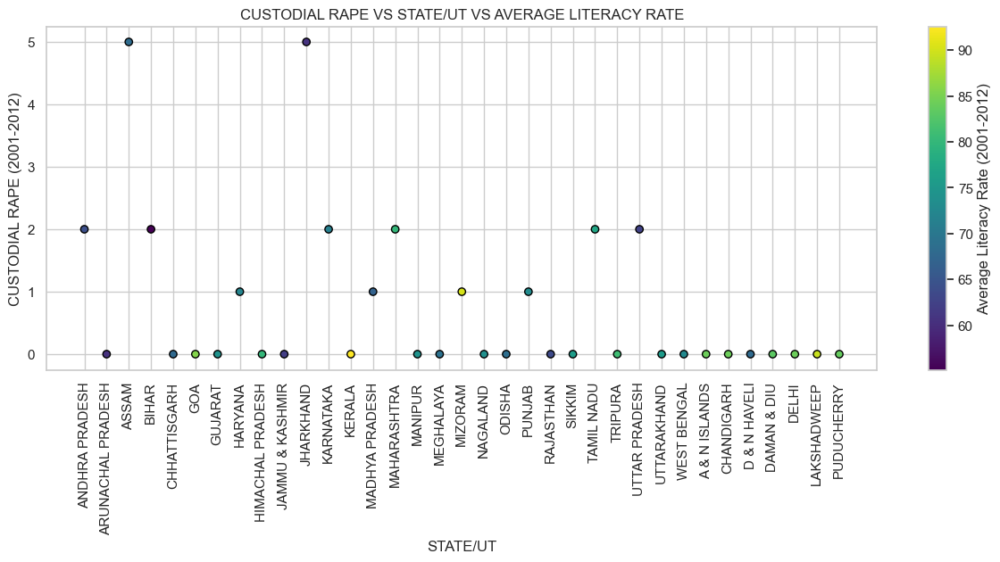

In [89]:
# colorbar: CUSTODIAL RAPE VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5))
plt.scatter(x=df['STATE/UT'], y=df['CUSTODIAL RAPE (2001-2012)'], c=df['AVERAGE LITERACY RATE (2001-2012)'], cmap='viridis', edgecolors='black', linewidth=1)
plt.colorbar(label='Average Literacy Rate (2001-2012)')
plt.title('CUSTODIAL RAPE VS STATE/UT VS AVERAGE LITERACY RATE')
plt.xlabel('STATE/UT')
plt.ylabel('CUSTODIAL RAPE (2001-2012)')
plt.xticks(rotation=90)
plt.show()


**Observations:**

**Higher Literacy Rates: States with higher literacy rates generally report lower instances of custodial rape. Higher education levels may lead to better awareness of legal rights and protections.**

**Lower Literacy Rates: Bihar, Madhya Pradesh, and Rajasthan, with lower literacy rates, exhibit higher rates of custodial rape. Limited awareness of legal rights may make individuals more vulnerable to abuse.**

#### CRIME TYPE - OTHER RAPE

In [90]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'OTHER RAPE (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),OTHER RAPE (2001-2012)
3,BIHAR,55.14,13122
1,ARUNACHAL PRADESH,60.41,500
10,JHARKHAND,60.63,9154
9,JAMMU & KASHMIR,61.92,2810
25,UTTAR PRADESH,62.55,19056
21,RAJASTHAN,63.54,15798
0,ANDHRA PRADESH,64.07,13477
13,MADHYA PRADESH,66.81,36086
4,CHHATTISGARH,67.75,11838
30,D & N HAVELI,67.87,56


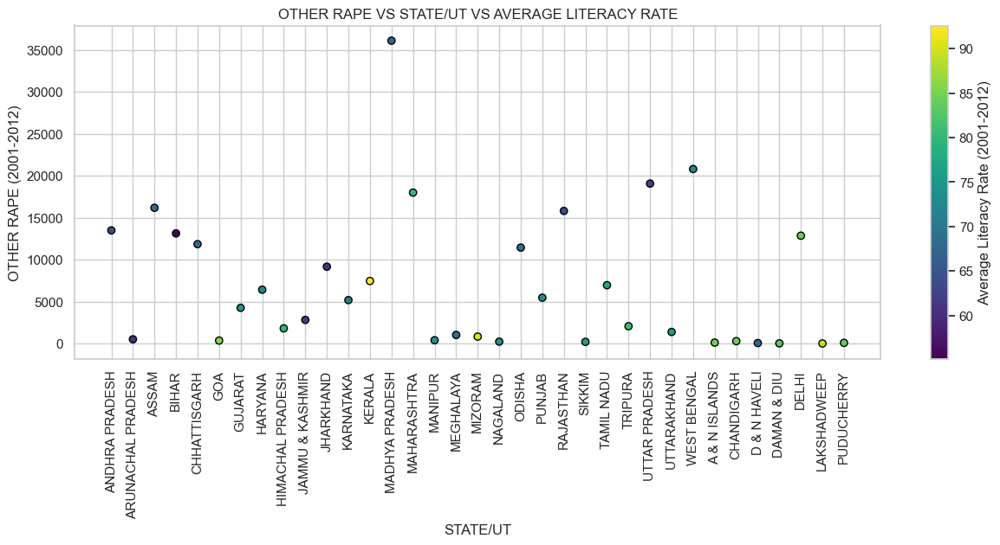

In [91]:
# colorbar: OTHER RAPE (2001-2012) VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5))
plt.scatter(x=df['STATE/UT'], y=df['OTHER RAPE (2001-2012)'], c=df['AVERAGE LITERACY RATE (2001-2012)'], cmap='viridis', edgecolors='black', linewidth=1)
plt.colorbar(label='Average Literacy Rate (2001-2012)')
plt.title('OTHER RAPE VS STATE/UT VS AVERAGE LITERACY RATE')
plt.xlabel('STATE/UT')
plt.ylabel('OTHER RAPE (2001-2012)')
plt.xticks(rotation=90)
plt.show()


#### Observations:
**Higher Literacy Rates: States with higher literacy rates generally report lower instances of other rape. Higher education levels may lead to better awareness of legal rights and protections.**

**Lower Literacy Rates: Bihar, Madhya Pradesh, and Rajasthan, with lower literacy rates, exhibit higher rates of other rape. Limited awareness of legal rights may make individuals more vulnerable to abuse.**

#### CRIME TYPE - KIDNAPPING & ABDUCTION

In [93]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'KIDNAPPING & ABDUCTION (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),KIDNAPPING & ABDUCTION (2001-2012)
3,BIHAR,55.14,37220
1,ARUNACHAL PRADESH,60.41,857
10,JHARKHAND,60.63,8476
9,JAMMU & KASHMIR,61.92,9665
25,UTTAR PRADESH,62.55,59266
21,RAJASTHAN,63.54,30727
0,ANDHRA PRADESH,64.07,21239
13,MADHYA PRADESH,66.81,11958
4,CHHATTISGARH,67.75,3345
30,D & N HAVELI,67.87,141


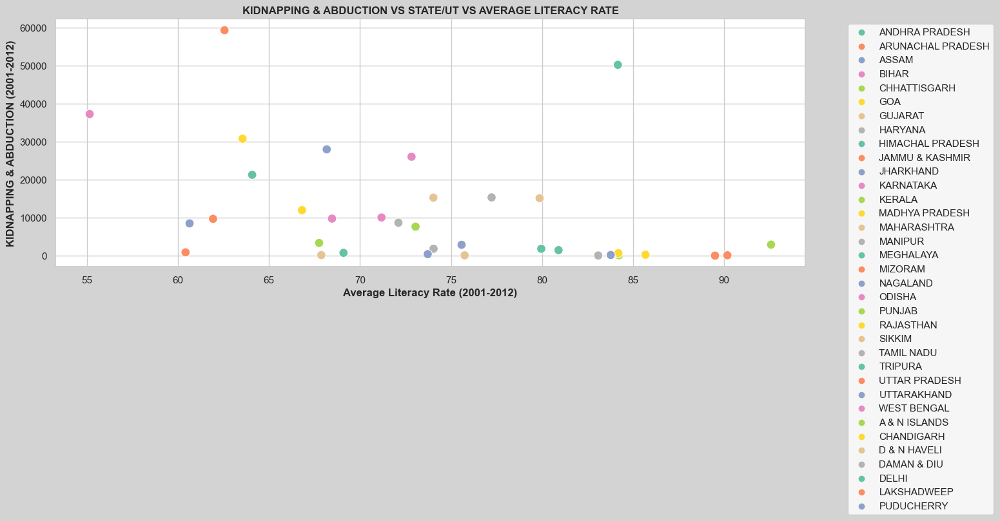

In [96]:

# Set the facecolor for the entire plot
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='KIDNAPPING & ABDUCTION (2001-2012)', hue='STATE/UT', data=df, palette='Set2', s=100)

# Set plot title and labels with boldweight
plt.title('KIDNAPPING & ABDUCTION VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('KIDNAPPING & ABDUCTION (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**Higher Literacy Rates: States with higher literacy rates, such as Kerala, Himachal Pradesh, and Maharashtra, show lower instances of kidnapping and abduction. Higher education levels may contribute to increased awareness and protection against such crimes.**

**Lower Literacy Rates: Bihar, Uttar Pradesh, and Jharkhand, with lower literacy rates, experience higher rates of kidnapping and abduction. Limited education may make individuals more susceptible to criminal activities.**

#### CRIME TYPE - KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS

In [97]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS (2001-2012)
3,BIHAR,55.14,19389
1,ARUNACHAL PRADESH,60.41,558
10,JHARKHAND,60.63,5282
9,JAMMU & KASHMIR,61.92,8820
25,UTTAR PRADESH,62.55,47590
21,RAJASTHAN,63.54,24671
0,ANDHRA PRADESH,64.07,14936
13,MADHYA PRADESH,66.81,9243
4,CHHATTISGARH,67.75,2630
30,D & N HAVELI,67.87,94


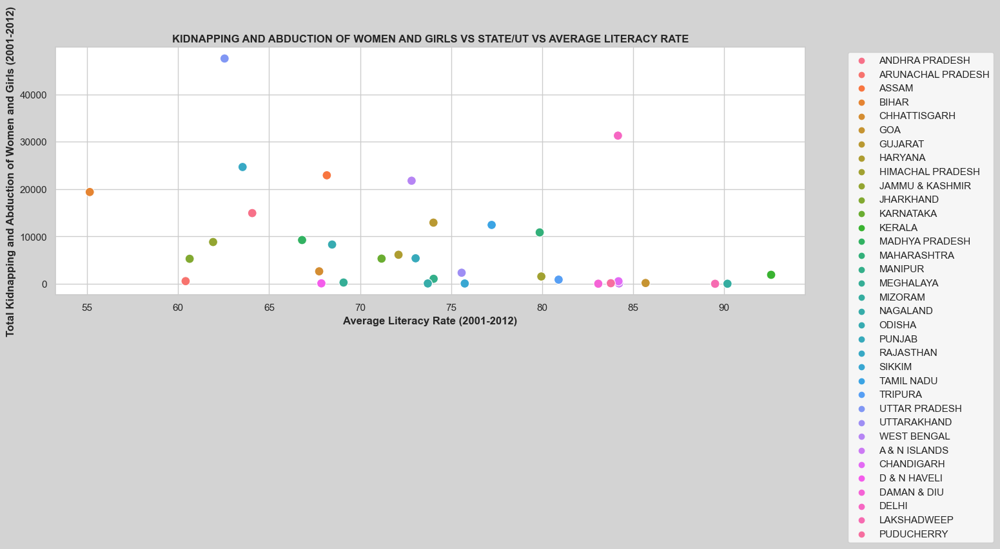

In [99]:
# Set the facecolor for the entire plot
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Kidnapping and Abduction of Women and Girls (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

**Observations:**

**Higher Literacy Rates: States with higher literacy rates generally report lower instances of kidnapping and abduction of women and girls. Education may empower women and girls, making them less vulnerable to such crimes.**

**Lower Literacy Rates: Bihar, Uttar Pradesh, and Jharkhand, with lower literacy rates, exhibit higher rates of kidnapping and abduction of women and girls. Limited education may contribute to the vulnerability of this demographic.**

#### CRIME TYPE - KIDNAPPING AND ABDUCTION OF OTHERS

In [102]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'KIDNAPPING AND ABDUCTION OF OTHERS (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),KIDNAPPING AND ABDUCTION OF OTHERS (2001-2012)
3,BIHAR,55.14,17831
1,ARUNACHAL PRADESH,60.41,299
10,JHARKHAND,60.63,3194
9,JAMMU & KASHMIR,61.92,845
25,UTTAR PRADESH,62.55,11676
21,RAJASTHAN,63.54,6056
0,ANDHRA PRADESH,64.07,6303
13,MADHYA PRADESH,66.81,2715
4,CHHATTISGARH,67.75,715
30,D & N HAVELI,67.87,47


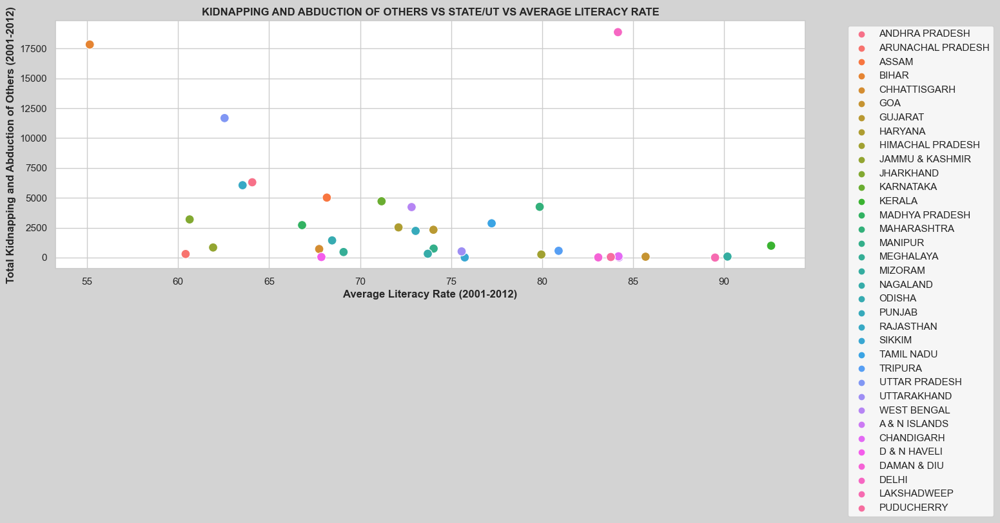

In [103]:
# scatterplot: KIDNAPPING AND ABDUCTION OF OTHERS VS STATE/UT VS AVERAGE LITERACY RATE
# Set the facecolor for the entire plot
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='KIDNAPPING AND ABDUCTION OF OTHERS (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('KIDNAPPING AND ABDUCTION OF OTHERS VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Kidnapping and Abduction of Others (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

**Observations:**

**Higher Literacy Rates: States with higher literacy rates generally show lower instances of kidnapping and abduction of others. Education may contribute to increased awareness and protection against such crimes.**

**Lower Literacy Rates: Bihar, Uttar Pradesh, and Jharkhand, with lower literacy rates, experience higher rates of kidnapping and abduction of others. Limited education may make individuals more susceptible to criminal activities.**

#### CRIME TYPE - DACOITY

In [104]:
# Bar graph: 
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'DACOITY (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),DACOITY (2001-2012)
3,BIHAR,55.14,11099
1,ARUNACHAL PRADESH,60.41,260
10,JHARKHAND,60.63,5906
9,JAMMU & KASHMIR,61.92,188
25,UTTAR PRADESH,62.55,4809
21,RAJASTHAN,63.54,563
0,ANDHRA PRADESH,64.07,1987
13,MADHYA PRADESH,66.81,1655
4,CHHATTISGARH,67.75,1468
30,D & N HAVELI,67.87,40


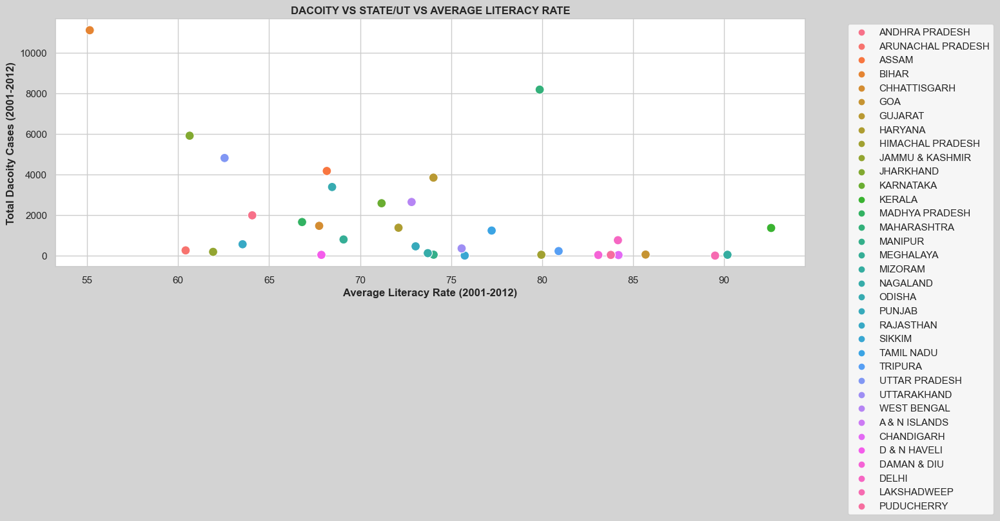

In [106]:
# Scatterplot: DACOITY VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='DACOITY (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('DACOITY VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Dacoity Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

#### Observations:
**Higher Literacy Rates: States with higher literacy rates, like Goa, Kerala, and Himachal Pradesh, exhibit lower instances of dacoity. Higher education levels may contribute to reduced involvement in organized criminal activities.**

**Lower Literacy Rates: Bihar, Madhya Pradesh, and Uttar Pradesh, with lower literacy rates, experience higher rates of dacoity. Limited education may contribute to economic disparities and a higher likelihood of involvement in such crimes.**

#### CRIME TYPE - PREPARATION AND ASSEMBLY FOR DACOITY

In [107]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'PREPARATION AND ASSEMBLY FOR DACOITY (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),PREPARATION AND ASSEMBLY FOR DACOITY (2001-2012)
3,BIHAR,55.14,1265
1,ARUNACHAL PRADESH,60.41,4
10,JHARKHAND,60.63,524
9,JAMMU & KASHMIR,61.92,0
25,UTTAR PRADESH,62.55,938
21,RAJASTHAN,63.54,781
0,ANDHRA PRADESH,64.07,80
13,MADHYA PRADESH,66.81,1541
4,CHHATTISGARH,67.75,168
30,D & N HAVELI,67.87,0


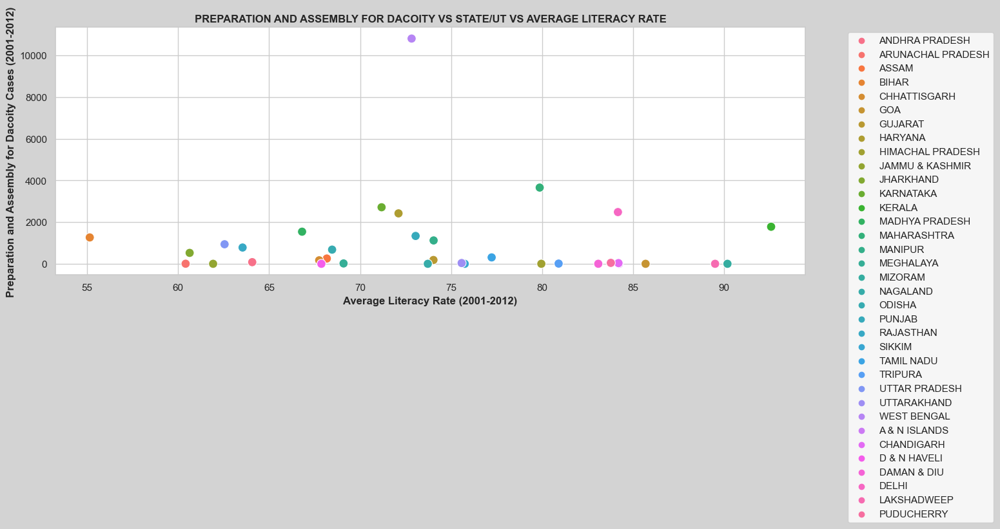

In [110]:
# scatterplot: PREPARATION AND ASSEMBLY FOR DACOITY VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='PREPARATION AND ASSEMBLY FOR DACOITY (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('PREPARATION AND ASSEMBLY FOR DACOITY VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Preparation and Assembly for Dacoity Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

**Observations:
Higher Literacy Rates: States with higher literacy rates, like Goa, Kerala, and Himachal Pradesh, exhibit lower instances preparation for dacoity. Higher education levels may contribute to reduced involvement in organized criminal activities.**

**Lower Literacy Rates: Bihar, Madhya Pradesh, and Uttar Pradesh, with lower literacy rates, experience higher rates of preparation for dacoity. Limited education may contribute to economic disparities and a higher likelihood of involvement in such crimes.**

#### CRIME TYPE - ROBBERY

In [111]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'ROBBERY (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),ROBBERY (2001-2012)
3,BIHAR,55.14,23666
1,ARUNACHAL PRADESH,60.41,843
10,JHARKHAND,60.63,8711
9,JAMMU & KASHMIR,61.92,1312
25,UTTAR PRADESH,62.55,30767
21,RAJASTHAN,63.54,9071
0,ANDHRA PRADESH,64.07,7605
13,MADHYA PRADESH,66.81,22314
4,CHHATTISGARH,67.75,5113
30,D & N HAVELI,67.87,30


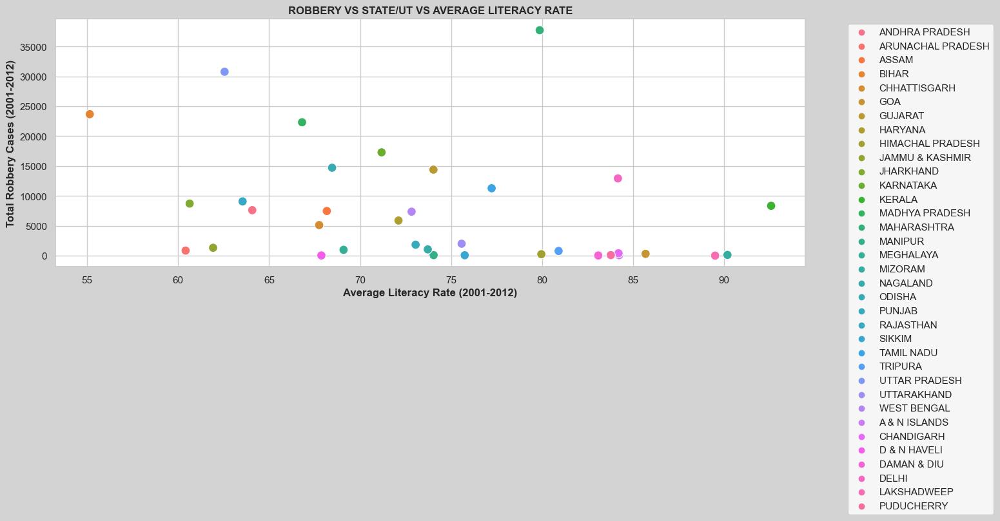

In [112]:
# Scatterplot: ROBBERY VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='ROBBERY (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('ROBBERY VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Robbery Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**Higher Literacy Rates: States with higher literacy rates, like Goa, Kerala, and Himachal Pradesh, generally report lower rates of robbery. Higher education levels may contribute to a better understanding of legal and ethical standards, reducing involvement in violent crimes.**

**Lower Literacy Rates: Bihar, Uttar Pradesh, and Madhya Pradesh, with lower literacy rates, exhibit higher rates of robbery. Limited education may contribute to a lack of awareness and an increased likelihood of resorting to violent means for economic gains.**

#### CRIME TYPE - BURGLARY

In [113]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'BURGLARY (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),BURGLARY (2001-2012)
3,BIHAR,55.14,40293
1,ARUNACHAL PRADESH,60.41,2780
10,JHARKHAND,60.63,16680
9,JAMMU & KASHMIR,61.92,17050
25,UTTAR PRADESH,62.55,65587
21,RAJASTHAN,63.54,65268
0,ANDHRA PRADESH,64.07,97336
13,MADHYA PRADESH,66.81,137346
4,CHHATTISGARH,67.75,44656
30,D & N HAVELI,67.87,388


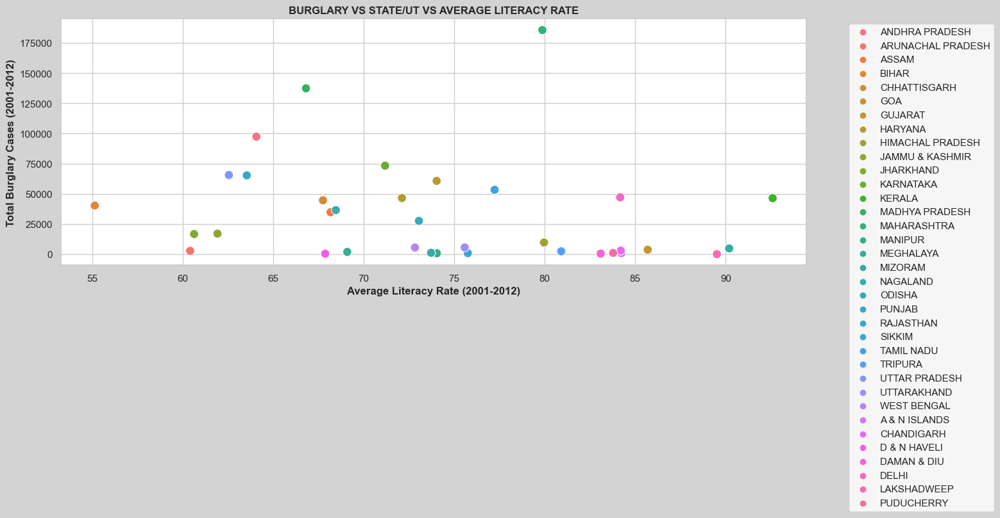

In [114]:
# Scatterplot: BURGLARY VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='BURGLARY (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('BURGLARY VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Burglary Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**Higher Literacy Rates: States with higher literacy rates, such as Goa, Kerala, and Himachal Pradesh, tend to have lower instances of burglary. Higher education levels may contribute to increased awareness and respect for legal boundaries.**

**Lower Literacy Rates: Bihar, Uttar Pradesh, and Madhya Pradesh, with lower literacy rates, experience higher rates of burglary. Limited education may contribute to a lack of awareness and increased engagement in property crimes.**

#### CRIME TYPE - THEFT

In [115]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'THEFT (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),THEFT (2001-2012)
3,BIHAR,55.14,153372
1,ARUNACHAL PRADESH,60.41,5178
10,JHARKHAND,60.63,71322
9,JAMMU & KASHMIR,61.92,25767
25,UTTAR PRADESH,62.55,312047
21,RAJASTHAN,63.54,232974
0,ANDHRA PRADESH,64.07,287190
13,MADHYA PRADESH,66.81,263860
4,CHHATTISGARH,67.75,62873
30,D & N HAVELI,67.87,773


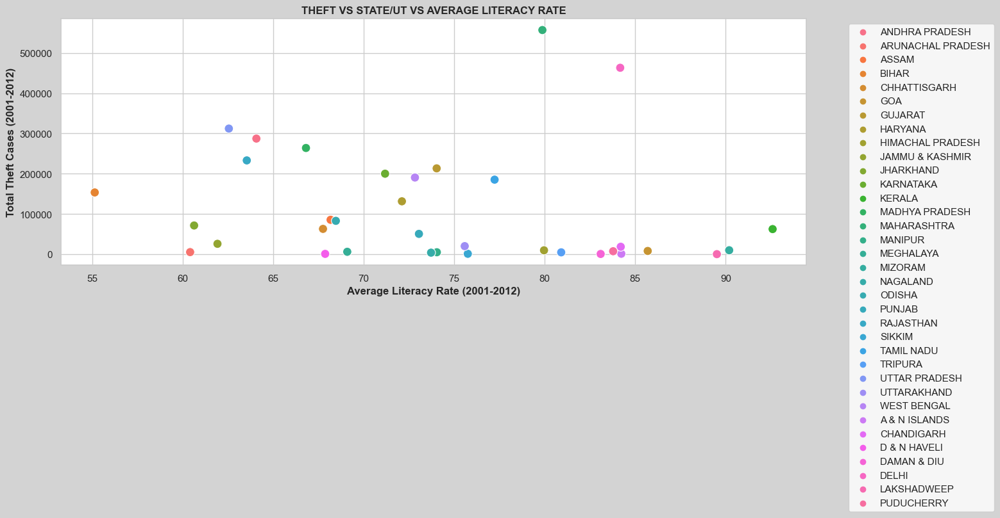

In [116]:
# Scatterplot: THEFT VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='THEFT (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('THEFT VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Theft Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**Higher Literacy Rates: States with higher literacy rates, like Goa, Kerala, and Himachal Pradesh, generally report lower rates of theft. Higher education levels may contribute to increased awareness of legal and ethical standards, reducing engagement in property crimes.**

**Lower Literacy Rates: Bihar, Uttar Pradesh, and Madhya Pradesh, with lower literacy rates, exhibit higher rates of theft. Limited education may contribute to a lack of awareness and an increased likelihood of engaging in property crimes.**

#### CRIME TYPE - AUTO THEFT

In [117]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'AUTO THEFT (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),AUTO THEFT (2001-2012)
3,BIHAR,55.14,34221
1,ARUNACHAL PRADESH,60.41,1076
10,JHARKHAND,60.63,18500
9,JAMMU & KASHMIR,61.92,8037
25,UTTAR PRADESH,62.55,146251
21,RAJASTHAN,63.54,105357
0,ANDHRA PRADESH,64.07,72644
13,MADHYA PRADESH,66.81,100112
4,CHHATTISGARH,67.75,20195
30,D & N HAVELI,67.87,289


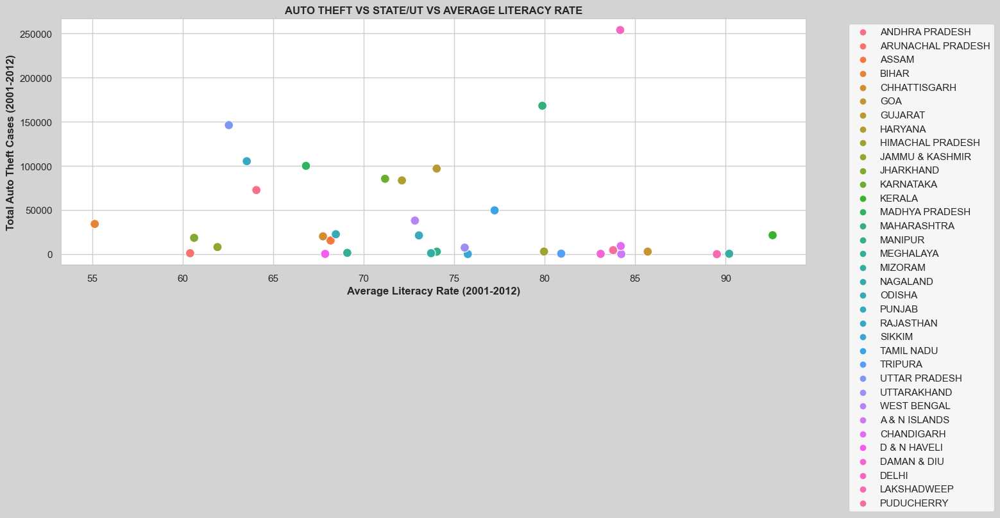

In [118]:
# Scatterplot: AUTO THEFT VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='AUTO THEFT (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('AUTO THEFT VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Auto Theft Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**The scatterplot indicates disparities in average literacy rates and auto theft cases across Indian states and Union Territories (2001-2012). Bihar, with a 55.14% literacy rate, faces a significant auto theft challenge (34,221 cases). Delhi, despite an 84.17% literacy rate, reports a high number of auto thefts (254,034 cases). Goa, with an 85.69% literacy rate, experiences comparatively lower auto theft incidents (2,877 cases). The data suggests a complex interplay between education levels and auto theft rates, emphasizing the need for nuanced crime prevention strategies.**

#### CRIME TYPE - OTHER THEFT

In [119]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'OTHER THEFT (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),OTHER THEFT (2001-2012)
3,BIHAR,55.14,119151
1,ARUNACHAL PRADESH,60.41,4102
10,JHARKHAND,60.63,52822
9,JAMMU & KASHMIR,61.92,17730
25,UTTAR PRADESH,62.55,165796
21,RAJASTHAN,63.54,127617
0,ANDHRA PRADESH,64.07,214546
13,MADHYA PRADESH,66.81,163748
4,CHHATTISGARH,67.75,42678
30,D & N HAVELI,67.87,484


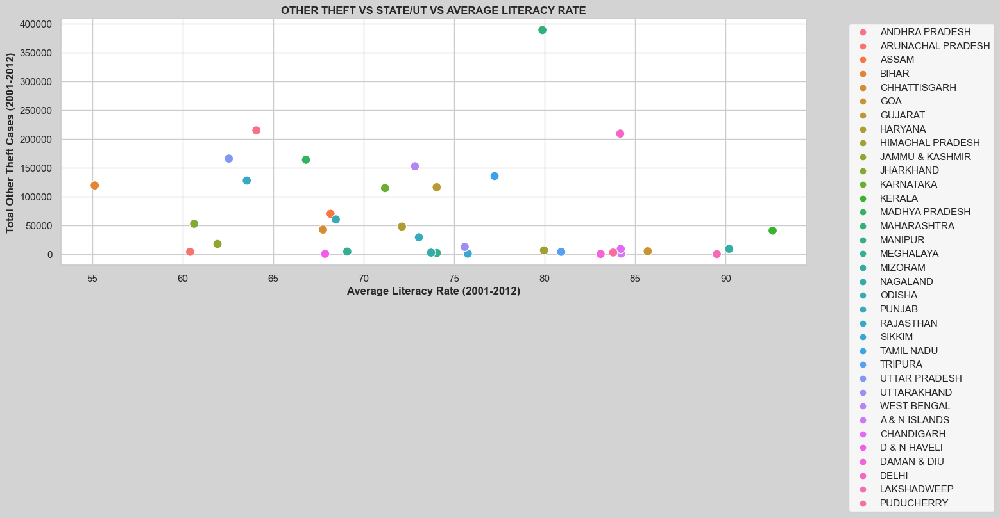

In [120]:
# Scatterplot: OTHER THEFT VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='OTHER THEFT (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('OTHER THEFT VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Other Theft Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**The scatterplot reveals disparities in average literacy rates and reported cases of other theft across Indian states and Union Territories (2001-2012). Bihar, with a 55.14% literacy rate, faces a significant challenge with 119,151 other theft cases. Delhi, despite an 84.17% literacy rate, reports a high number of other theft cases (209,058). Goa, with an 85.69% literacy rate, experiences comparatively lower incidents of other theft (5,168). The data suggests a complex relationship between education levels and other theft rates, highlighting the need for targeted crime prevention strategies.**

#### CRIME TYPE - RIOTS

In [121]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'RIOTS (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),RIOTS (2001-2012)
3,BIHAR,55.14,105096
1,ARUNACHAL PRADESH,60.41,340
10,JHARKHAND,60.63,28599
9,JAMMU & KASHMIR,61.92,16207
25,UTTAR PRADESH,62.55,54110
21,RAJASTHAN,63.54,36073
0,ANDHRA PRADESH,64.07,27459
13,MADHYA PRADESH,66.81,31124
4,CHHATTISGARH,67.75,10897
30,D & N HAVELI,67.87,260


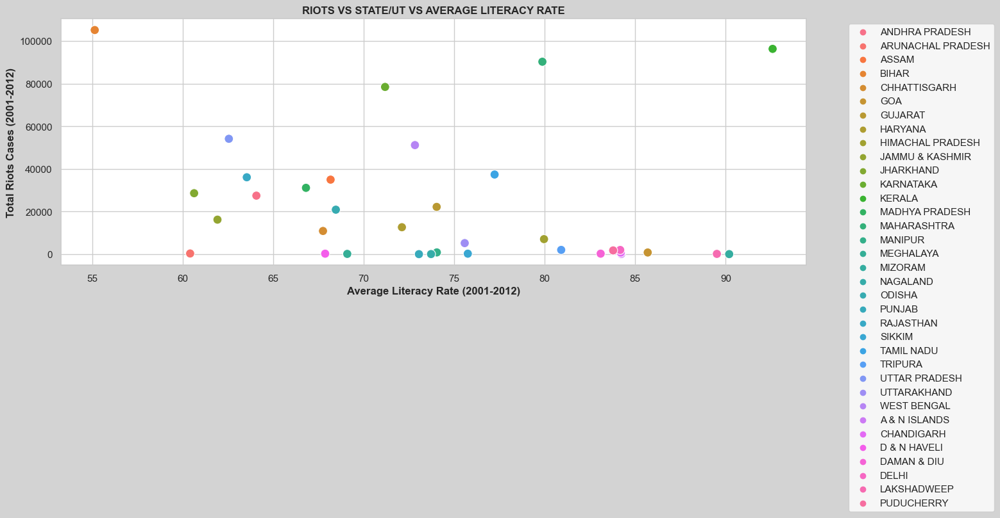

In [122]:
# Scatterplot: RIOTS VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='RIOTS (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('RIOTS VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Riots Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


**Observations:**

**The scatterplot illustrates the disparities in average literacy rates and reported incidents of riots across various Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports a significant 105,096 cases of riots. Delhi, despite an 84.17% literacy rate, experiences a comparatively lower number of riots at 1,992. Kerala, boasting the highest literacy rate at 92.59%, paradoxically records a substantial 96,274 incidents of riots. This data underscores the complex and varied relationship between education levels and social unrest, highlighting the need for region-specific strategies to address underlying factors contributing to riot incidents.**

#### CRIME TYPE - CRIMINAL BREACH OF TRUST

In [123]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'CRIMINAL BREACH OF TRUST (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),CRIMINAL BREACH OF TRUST (2001-2012)
3,BIHAR,55.14,15528
1,ARUNACHAL PRADESH,60.41,505
10,JHARKHAND,60.63,4557
9,JAMMU & KASHMIR,61.92,1490
25,UTTAR PRADESH,62.55,38352
21,RAJASTHAN,63.54,9674
0,ANDHRA PRADESH,64.07,12128
13,MADHYA PRADESH,66.81,6533
4,CHHATTISGARH,67.75,1705
30,D & N HAVELI,67.87,163


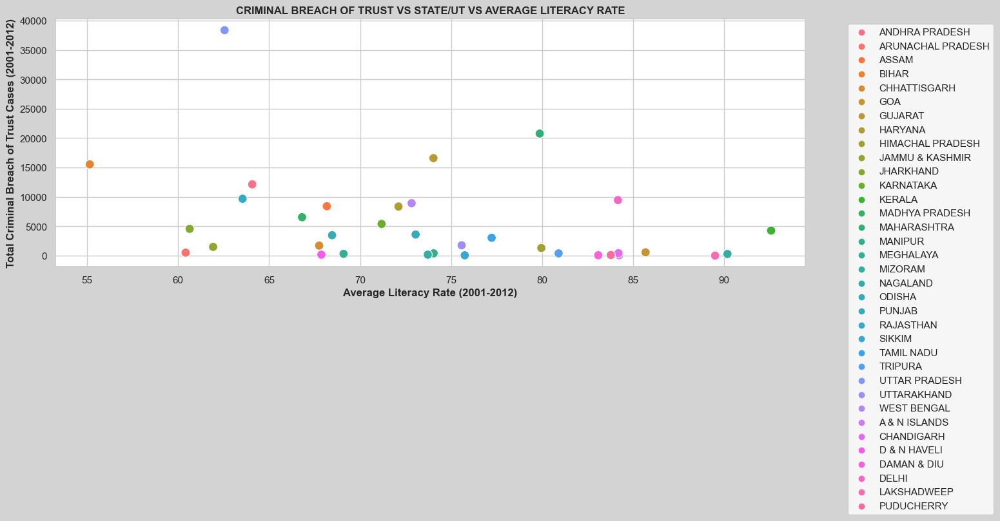

In [124]:
# Scatterplot: CRIMINAL BREACH OF TRUST VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='CRIMINAL BREACH OF TRUST (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('CRIMINAL BREACH OF TRUST VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Criminal Breach of Trust Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates variations in average literacy rates and reported cases of criminal breach of trust across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 15,528 cases of criminal breach of trust. Delhi, despite an 84.17% literacy rate, records 9,450 cases. Kerala, boasting the highest literacy rate at 92.59%, reports a comparatively lower 4,271 cases. These findings emphasize the complex relationship between literacy levels and incidents of criminal breach of trust, suggesting the need for targeted strategies to address regional factors contributing to this crime.**

#### CRIME TYPE - CHEATING

In [125]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'CHEATING (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),CHEATING (2001-2012)
3,BIHAR,55.14,30690
1,ARUNACHAL PRADESH,60.41,520
10,JHARKHAND,60.63,9476
9,JAMMU & KASHMIR,61.92,5463
25,UTTAR PRADESH,62.55,83960
21,RAJASTHAN,63.54,140800
0,ANDHRA PRADESH,64.07,98843
13,MADHYA PRADESH,66.81,18495
4,CHHATTISGARH,67.75,6998
30,D & N HAVELI,67.87,171


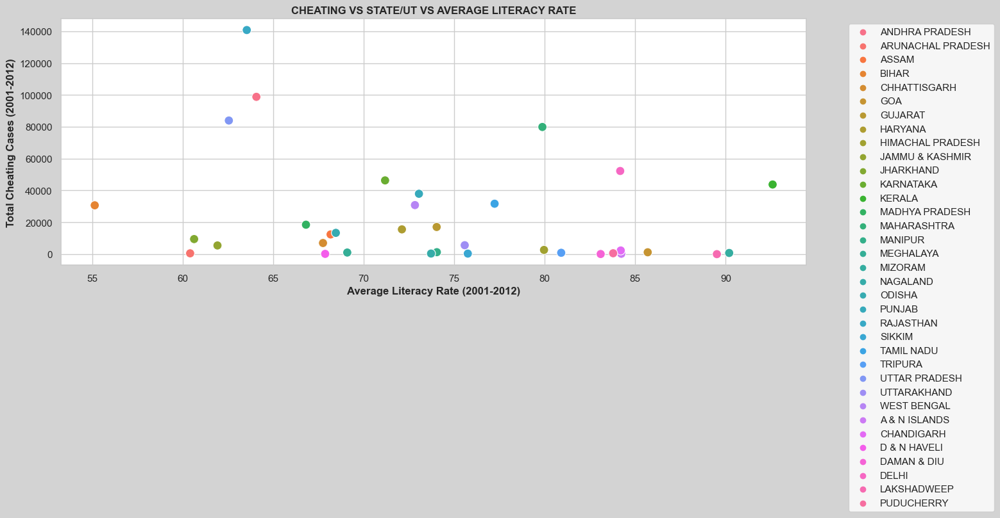

In [126]:
# Scatterplot: CHEATING VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='CHEATING (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('CHEATING VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Cheating Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates the disparities in average literacy rates and reported cases of cheating across various Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports a significant 30,690 cases of cheating. Arunachal Pradesh, with a literacy rate of 60.41%, records 520 cases. Delhi, boasting an 84.17% literacy rate, reports 52,256 cases. Kerala, with the highest literacy rate at 92.59%, reports 43,758 cases. This data underscores the varied patterns in cheating incidents across regions, emphasizing the need for targeted strategies to address the complex relationship between literacy levels and academic dishonesty.**

#### CRIME TYPE - COUNTERFIETING

In [127]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'COUNTERFIETING (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),COUNTERFIETING (2001-2012)
3,BIHAR,55.14,826
1,ARUNACHAL PRADESH,60.41,52
10,JHARKHAND,60.63,203
9,JAMMU & KASHMIR,61.92,318
25,UTTAR PRADESH,62.55,3224
21,RAJASTHAN,63.54,726
0,ANDHRA PRADESH,64.07,3107
13,MADHYA PRADESH,66.81,424
4,CHHATTISGARH,67.75,578
30,D & N HAVELI,67.87,14


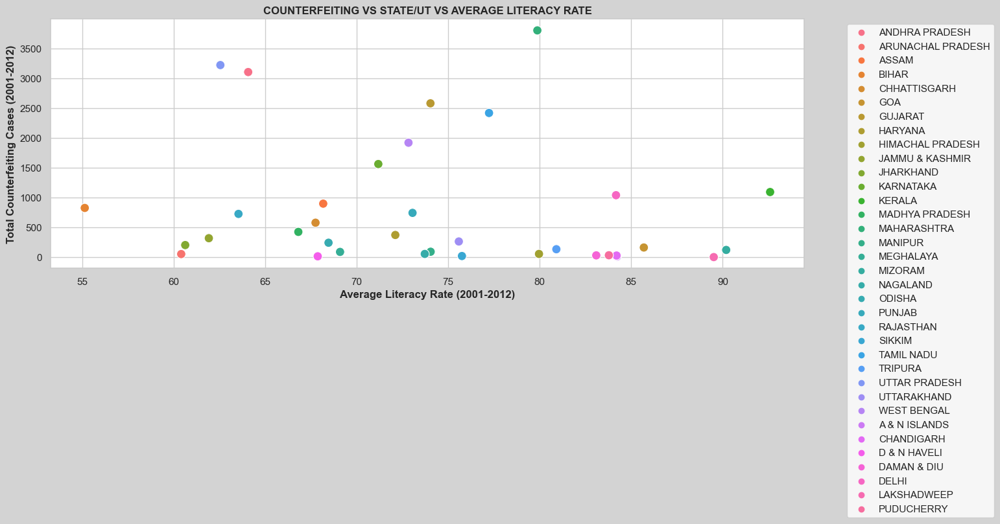

In [130]:
# Scatterplot: COUNTERFEITING VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='COUNTERFIETING (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('COUNTERFEITING VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Counterfieting Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterploth depicts variations in average literacy rates and reported cases of counterfeiting across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 826 cases of counterfeiting. Arunachal Pradesh, with a literacy rate of 60.41%, records 52 cases. Delhi, boasting an 84.17% literacy rate, reports 1,040 cases. Kerala, with the highest literacy rate at 92.59%, reports 1,093 cases. This data highlights diverse patterns in counterfeiting incidents across regions, emphasizing the need for targeted strategies to address the complex relationship between literacy levels and such fraudulent activities.**

#### CRIME TYPE - ARSON

In [131]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'ARSON (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),ARSON (2001-2012)
3,BIHAR,55.14,8509
1,ARUNACHAL PRADESH,60.41,250
10,JHARKHAND,60.63,2012
9,JAMMU & KASHMIR,61.92,3166
25,UTTAR PRADESH,62.55,4554
21,RAJASTHAN,63.54,8312
0,ANDHRA PRADESH,64.07,11968
13,MADHYA PRADESH,66.81,10354
4,CHHATTISGARH,67.75,3147
30,D & N HAVELI,67.87,55


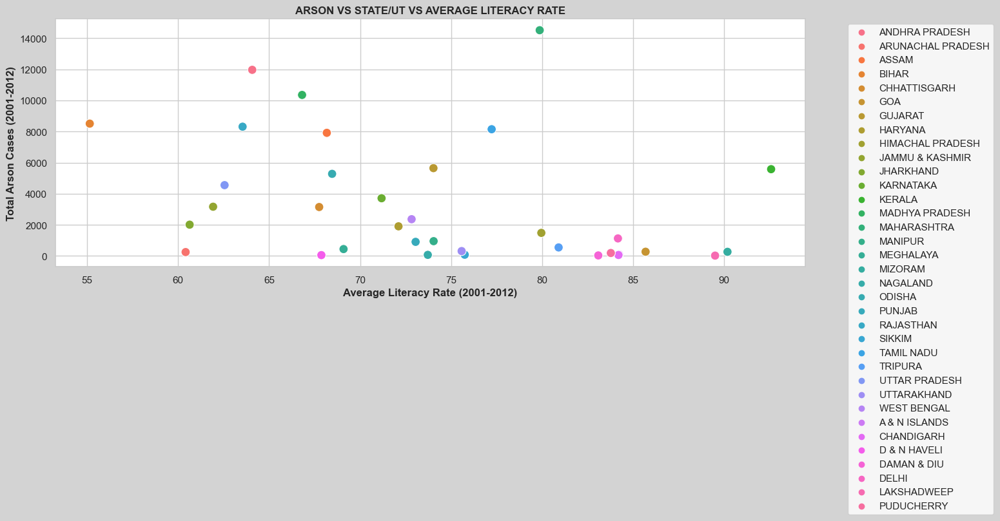

In [132]:
# Scatterplot: ARSON VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='ARSON (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('ARSON VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Arson Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates variations in average literacy rates and reported cases of arson across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 8,509 cases of arson. Arunachal Pradesh, with a literacy rate of 60.41%, records 250 cases. Delhi, boasting an 84.17% literacy rate, reports 1,128 cases. Kerala, with the highest literacy rate at 92.59%, reports 5,580 cases. This data underscores diverse patterns in arson incidents across regions, emphasizing the need for targeted strategies to address the complex relationship between literacy levels and such criminal activities.**

#### CRIME TYPE - HURT/GREVIOUS HURT

In [133]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'HURT/GREVIOUS HURT (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),HURT/GREVIOUS HURT (2001-2012)
3,BIHAR,55.14,189266
1,ARUNACHAL PRADESH,60.41,5157
10,JHARKHAND,60.63,40237
9,JAMMU & KASHMIR,61.92,3883
25,UTTAR PRADESH,62.55,139750
21,RAJASTHAN,63.54,267353
0,ANDHRA PRADESH,64.07,546565
13,MADHYA PRADESH,66.81,412577
4,CHHATTISGARH,67.75,85026
30,D & N HAVELI,67.87,318


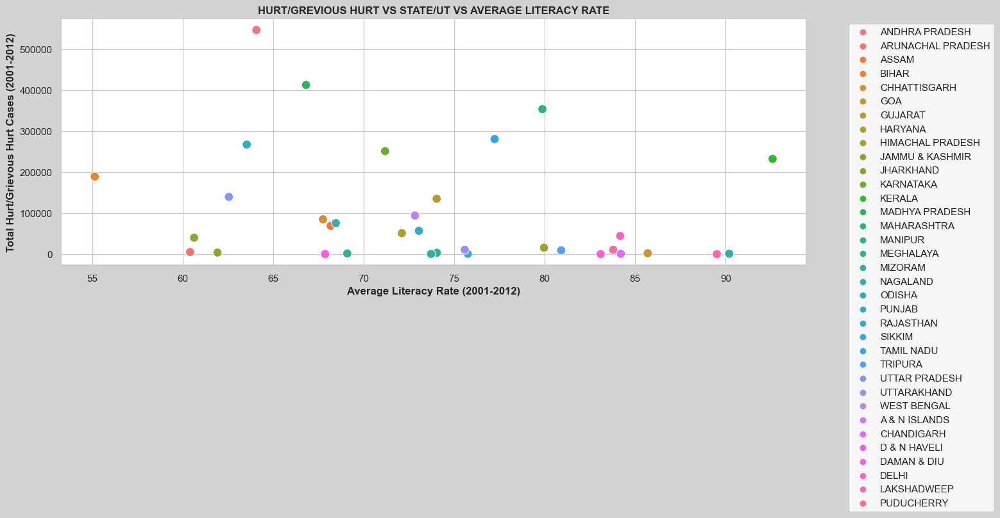

In [134]:
# Scatterplot: HURT/GREVIOUS HURT VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='HURT/GREVIOUS HURT (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('HURT/GREVIOUS HURT VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Hurt/Grievous Hurt Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot depicts variations in average literacy rates and reported cases of hurt/grievous hurt across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports a substantial 189,266 cases of hurt/grievous hurt. Arunachal Pradesh, with a literacy rate of 60.41%, notes 5,157 cases. Delhi, boasting an 84.17% literacy rate, reports 44,420 cases. Kerala, with the highest literacy rate at 92.59%, records 232,451 cases. These findings underline diverse patterns in incidents of hurt/grievous hurt across regions, emphasizing the need for tailored strategies to address the complex relationship between literacy levels and such forms of violence.**

#### CRIME TYPE - DOWRY DEATHS

In [135]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'DOWRY DEATHS (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),DOWRY DEATHS (2001-2012)
3,BIHAR,55.14,13548
1,ARUNACHAL PRADESH,60.41,2
10,JHARKHAND,60.63,3291
9,JAMMU & KASHMIR,61.92,135
25,UTTAR PRADESH,62.55,23824
21,RAJASTHAN,63.54,5066
0,ANDHRA PRADESH,64.07,6215
13,MADHYA PRADESH,66.81,9036
4,CHHATTISGARH,67.75,1142
30,D & N HAVELI,67.87,1


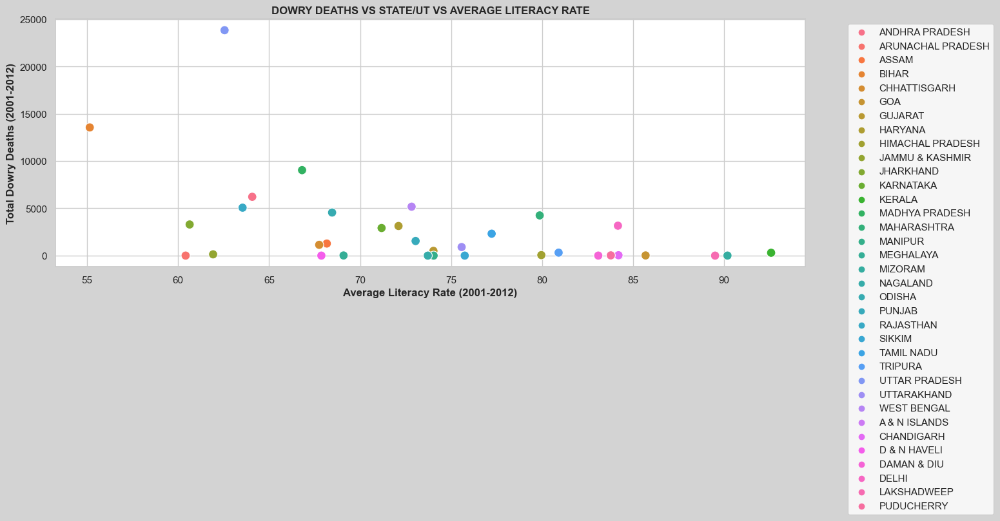

In [136]:
# Scatterplot: DOWRY DEATHS VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='DOWRY DEATHS (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('DOWRY DEATHS VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Dowry Deaths (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates variations in average literacy rates and reported cases of dowry deaths across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 13,548 cases of dowry deaths. Arunachal Pradesh, with a literacy rate of 60.41%, records only 2 cases. Delhi, boasting an 84.17% literacy rate, reports 3,164 cases. Kerala, with the highest literacy rate at 92.59%, records 301 cases. These findings highlight diverse patterns in dowry death incidents across regions, emphasizing the need for targeted strategies to address the complex relationship between literacy levels and this form of gender-based violence.**

#### CRIME TYPE - ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY

In [137]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY (2001-2012)
3,BIHAR,55.14,7576
1,ARUNACHAL PRADESH,60.41,784
10,JHARKHAND,60.63,3985
9,JAMMU & KASHMIR,61.92,11509
25,UTTAR PRADESH,62.55,29698
21,RAJASTHAN,63.54,30853
0,ANDHRA PRADESH,64.07,51999
13,MADHYA PRADESH,66.81,79878
4,CHHATTISGARH,67.75,19165
30,D & N HAVELI,67.87,50


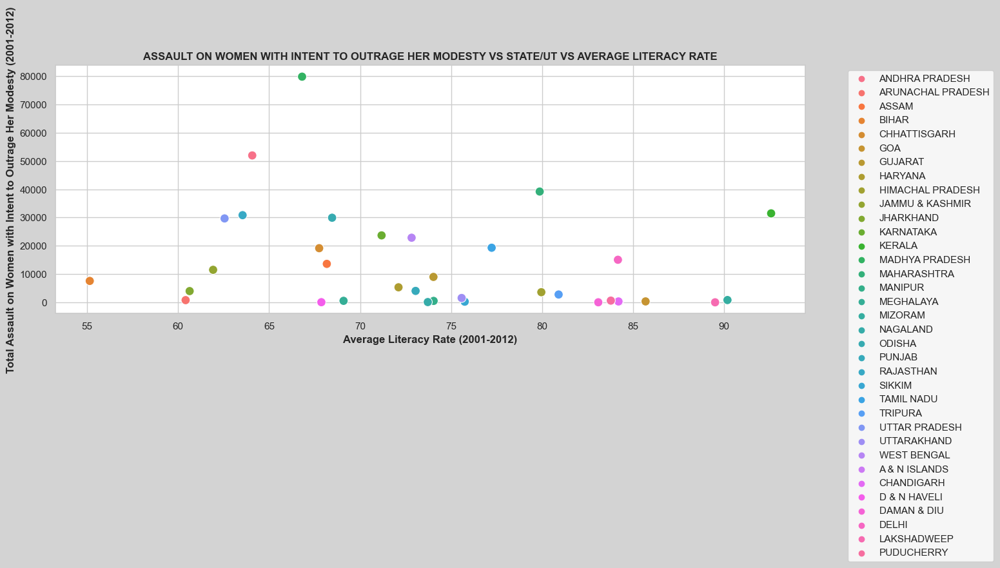

In [138]:
# Scatterplot: ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Assault on Women with Intent to Outrage Her Modesty (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates variations in average literacy rates and reported cases of assault on women with the intent to outrage her modesty across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 7,576 cases of assault on women with the intent to outrage her modesty. Arunachal Pradesh, with a literacy rate of 60.41%, records 784 cases. Delhi, boasting an 84.17% literacy rate, reports 15,068 cases. Kerala, with the highest literacy rate at 92.59%, records 31,490 cases. These findings highlight diverse patterns in incidents of assault on women with the intent to outrage her modesty across regions, emphasizing the need for targeted strategies to address the complex relationship between literacy levels and crimes against women.**

#### CRIME TYPE - INSULT TO MODESTY OF WOMEN

In [139]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'INSULT TO MODESTY OF WOMEN (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),INSULT TO MODESTY OF WOMEN (2001-2012)
3,BIHAR,55.14,226
1,ARUNACHAL PRADESH,60.41,18
10,JHARKHAND,60.63,247
9,JAMMU & KASHMIR,61.92,3993
25,UTTAR PRADESH,62.55,26511
21,RAJASTHAN,63.54,354
0,ANDHRA PRADESH,64.07,36131
13,MADHYA PRADESH,66.81,9317
4,CHHATTISGARH,67.75,1725
30,D & N HAVELI,67.87,4


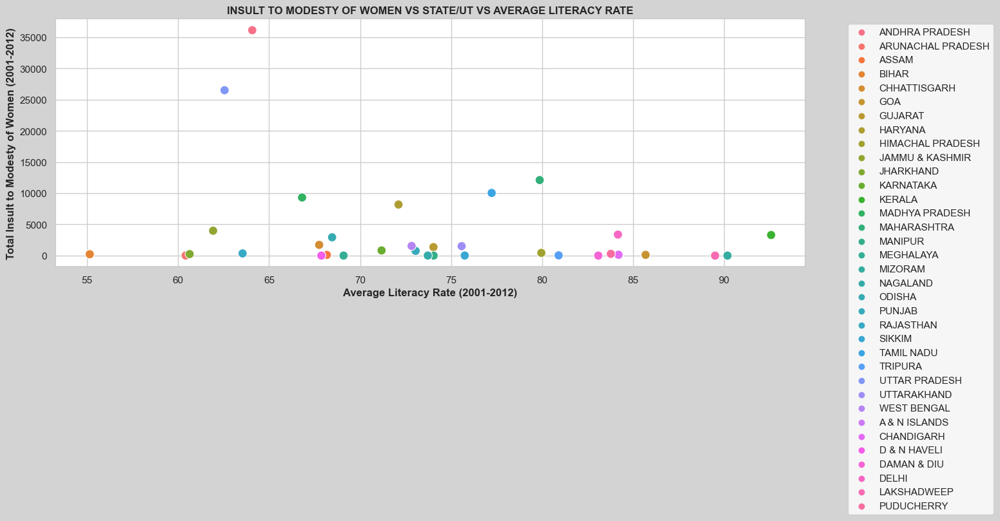

In [140]:
# Scatterplot: INSULT TO MODESTY OF WOMEN VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='INSULT TO MODESTY OF WOMEN (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('INSULT TO MODESTY OF WOMEN VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Insult to Modesty of Women (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates variations in average literacy rates and reported cases of insult to the modesty of women across Indian states and Union Territories from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 226 cases of insult to the modesty of women. Arunachal Pradesh, with a literacy rate of 60.41%, records 18 cases. Delhi, boasting an 84.17% literacy rate, reports 3,374 cases. Kerala, with the highest literacy rate at 92.59%, records 3,304 cases. These findings underscore diverse patterns in incidents of insult to the modesty of women across regions, emphasizing the need for targeted strategies to address the complex relationship between literacy levels and crimes against women.**

#### CRIME TYPE - CRUELTY BY HUSBAND OR HIS RELATIVES

In [141]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'CRUELTY BY HUSBAND OR HIS RELATIVES (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),CRUELTY BY HUSBAND OR HIS RELATIVES (2001-2012)
3,BIHAR,55.14,25680
1,ARUNACHAL PRADESH,60.41,167
10,JHARKHAND,60.63,8409
9,JAMMU & KASHMIR,61.92,1800
25,UTTAR PRADESH,62.55,77617
21,RAJASTHAN,63.54,100101
0,ANDHRA PRADESH,64.07,119007
13,MADHYA PRADESH,66.81,39969
4,CHHATTISGARH,67.75,9573
30,D & N HAVELI,67.87,38


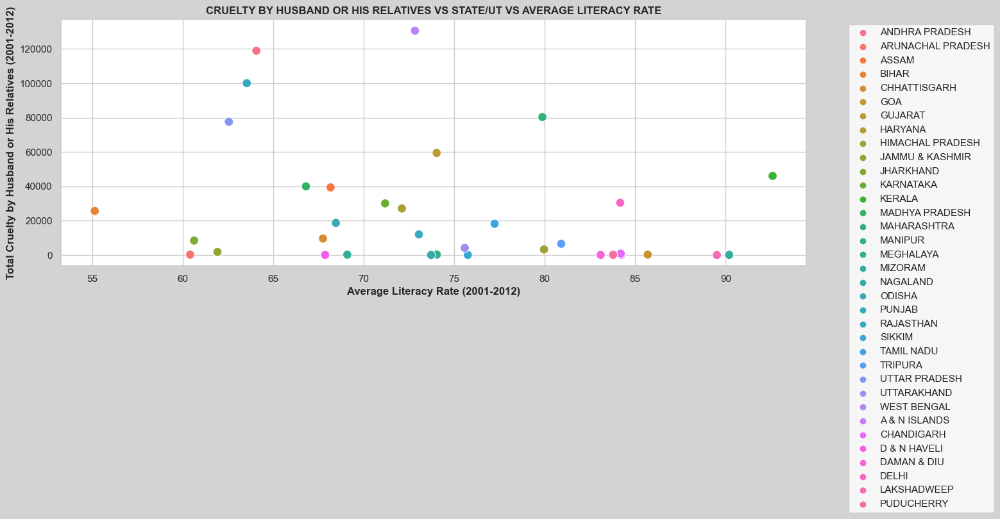

In [142]:
# Scatterplot: CRUELTY BY HUSBAND OR HIS RELATIVES VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='CRUELTY BY HUSBAND OR HIS RELATIVES (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('CRUELTY BY HUSBAND OR HIS RELATIVES VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Cruelty by Husband or His Relatives (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot demonstrates the relationship between average literacy rates and reported cases of cruelty by husbands or their relatives in different states and Union Territories of India from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 25,680 cases of cruelty. Arunachal Pradesh, with a literacy rate of 60.41%, records 167 cases. Delhi, boasting an 84.17% literacy rate, reports 30,422 cases. Kerala, with the highest literacy rate at 92.59%, records 46,074 cases. These findings underscore the intricate connection between literacy levels and cases of cruelty, suggesting the need for targeted interventions to address social issues related to family dynamics and gender-based violence.**

#### CRIME TYPE - IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES

In [143]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES (2001-2012)
3,BIHAR,55.14,440
1,ARUNACHAL PRADESH,60.41,0
10,JHARKHAND,60.63,145
9,JAMMU & KASHMIR,61.92,0
25,UTTAR PRADESH,62.55,3
21,RAJASTHAN,63.54,6
0,ANDHRA PRADESH,64.07,17
13,MADHYA PRADESH,66.81,60
4,CHHATTISGARH,67.75,5
30,D & N HAVELI,67.87,0


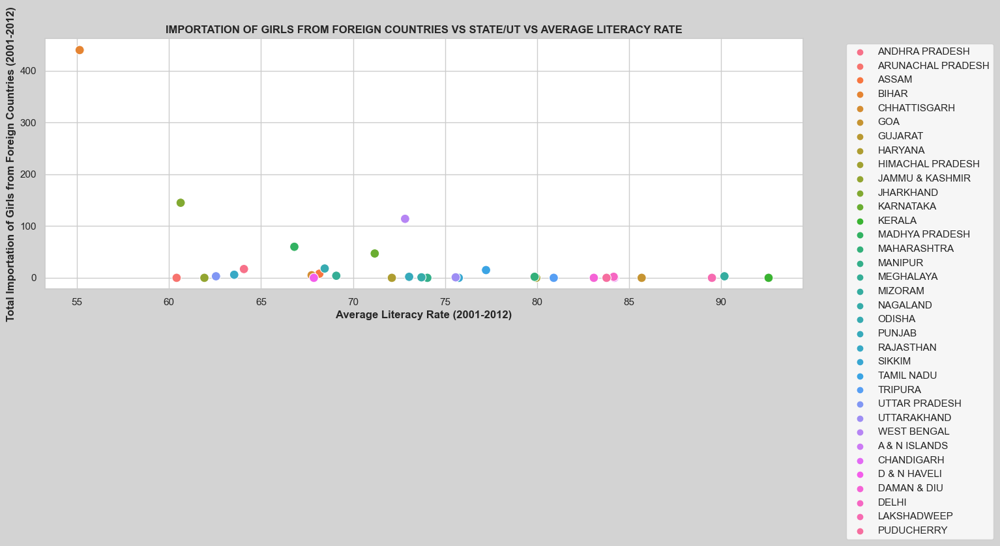

In [144]:
# Scatterplot: IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Importation of Girls from Foreign Countries (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot illustrates the correlation between average literacy rates and reported cases of the importation of girls from foreign countries in different states and Union Territories of India from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports 440 cases of importation. Arunachal Pradesh, with a literacy rate of 60.41%, records no reported cases. Delhi, boasting an 84.17% literacy rate, reports 2 cases. Kerala, with the highest literacy rate at 92.59%, records no reported cases. These findings highlight the need for further investigation into the factors influencing such cases and the importance of education in addressing and preventing such issues.**

#### CRIME TYPE - CAUSING DEATH BY NEGLIGENCE

In [145]:
df[['STATE/UT', 'AVERAGE LITERACY RATE (2001-2012)', 'CAUSING DEATH BY NEGLIGENCE (2001-2012)']].sort_values(by = 'AVERAGE LITERACY RATE (2001-2012)')

,STATE/UT,AVERAGE LITERACY RATE (2001-2012),CAUSING DEATH BY NEGLIGENCE (2001-2012)
3,BIHAR,55.14,44442
1,ARUNACHAL PRADESH,60.41,745
10,JHARKHAND,60.63,13612
9,JAMMU & KASHMIR,61.92,4524
25,UTTAR PRADESH,62.55,113821
21,RAJASTHAN,63.54,78350
0,ANDHRA PRADESH,64.07,138435
13,MADHYA PRADESH,66.81,64969
4,CHHATTISGARH,67.75,25432
30,D & N HAVELI,67.87,148


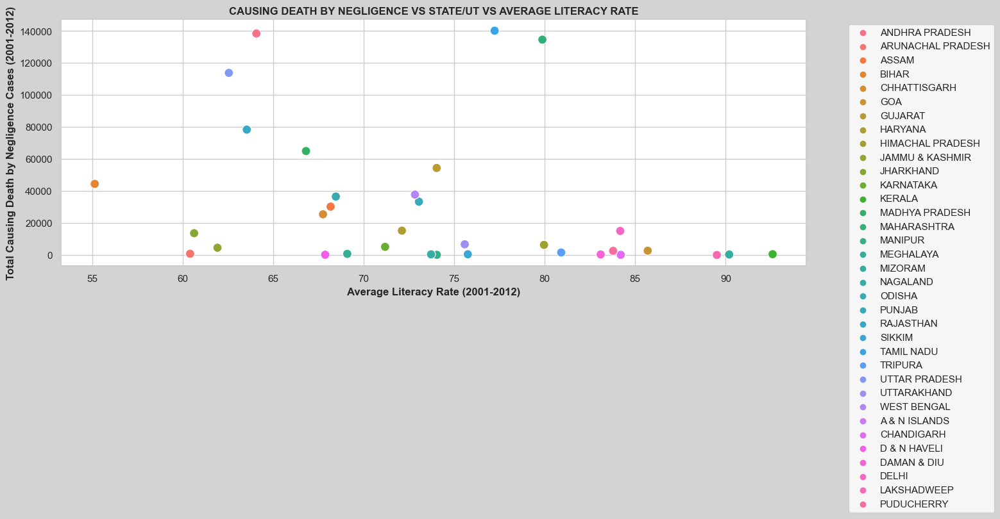

In [146]:
# Scatterplot: CAUSING DEATH BY NEGLIGENCE VS STATE/UT VS AVERAGE LITERACY RATE
plt.figure(figsize=(15, 5), facecolor='lightgrey')

# Create a scatter plot with hue='STATE/UT'
sns.scatterplot(x='AVERAGE LITERACY RATE (2001-2012)', y='CAUSING DEATH BY NEGLIGENCE (2001-2012)',
                hue='STATE/UT', data=df, palette='husl', s=100)

# Set plot title and labels with boldweight
plt.title('CAUSING DEATH BY NEGLIGENCE VS STATE/UT VS AVERAGE LITERACY RATE', fontweight='bold')
plt.xlabel('Average Literacy Rate (2001-2012)', fontweight='bold')
plt.ylabel('Total Causing Death by Negligence Cases (2001-2012)', fontweight='bold')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


#### Observations:

**The scatterplot above illustrates the relationship between the average literacy rates and reported cases of causing death by negligence in different states and Union Territories of India from 2001 to 2012. Bihar, with a literacy rate of 55.14%, reports the highest number of cases, reaching 44,442. Arunachal Pradesh, with a literacy rate of 60.41%, records 745 cases. Kerala, with the highest literacy rate at 92.59%, reports the lowest number of cases, numbering 489. Overall, there is a trend of higher reported cases in states with lower literacy rates, emphasizing the potential correlation between education and the occurrence of such incidents.**

### 2.3	Analysis of year-on-year total crime rate.

In [151]:
# Analysis of year-on-year total crime rate
df[['STATE/UT', 'CRIME RATE (2001)', 'CRIME RATE (2002)', 'CRIME RATE (2003)', 'CRIME RATE (2004)', 'CRIME RATE (2005)', 
    'CRIME RATE (2006)', 'CRIME RATE (2007)', 'CRIME RATE (2008)', 'CRIME RATE (2009)', 'CRIME RATE (2010)', 'CRIME RATE (2011)',
    'CRIME RATE (2012)']]

,STATE/UT,CRIME RATE (2001),CRIME RATE (2002),CRIME RATE (2003),CRIME RATE (2004),CRIME RATE (2005),CRIME RATE (2006),CRIME RATE (2007),CRIME RATE (2008),CRIME RATE (2009),CRIME RATE (2010),CRIME RATE (2011),CRIME RATE (2012)
0,ANDHRA PRADESH,151.26,168.03,185.19,189.28,183.78,195.49,196.15,199.96,193.29,203.22,216.44,215.27
1,ARUNACHAL PRADESH,207.86,180.50,168.34,171.80,195.14,184.69,185.89,181.03,169.22,175.33,159.93,162.36
2,ASSAM,132.24,132.48,135.11,141.36,140.82,152.64,150.77,159.09,163.01,170.56,176.37,207.22
3,BIHAR,77.84,80.54,78.44,89.50,79.39,81.77,84.21,88.03,88.47,89.43,97.96,127.10
4,CHHATTISGARH,137.50,121.31,111.96,125.78,129.90,139.85,139.26,156.24,153.98,155.74,152.05,146.23
5,GOA,166.14,160.10,146.94,147.23,144.35,145.16,146.44,177.04,213.03,239.21,248.33,237.44
6,GUJARAT,137.99,141.71,147.30,141.21,132.05,133.59,132.21,140.47,129.86,120.02,118.71,118.26
7,HARYANA,141.42,139.43,128.49,135.00,158.73,184.71,187.45,197.43,196.87,225.46,230.30,231.47
8,HIMACHAL PRADESH,103.61,100.09,95.30,98.71,96.02,98.78,117.76,114.74,103.21,106.53,111.31,98.12
9,JAMMU & KASHMIR,130.61,130.48,129.48,123.97,116.84,113.86,112.83,110.04,121.60,121.98,121.57,109.57


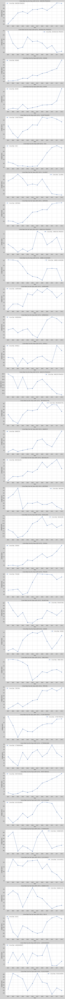

In [153]:
# Lit of states and UTs
state_ut = ['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR', 'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 
            'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA', 'MADHYA PRADESH', 'MAHARASHTRA', 
            'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU', 
            'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND', 'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
            'DAMAN & DIU', 'DELHI', 'LAKSHADWEEP', 'PUDUCHERRY']

rows = 35
columns = 1

plt.figure(figsize = (10, 150),facecolor='lightgray')

for i in range(0, len(state_ut)):
    plt.subplot(rows, columns, i + 1)
    selected_state_data = df[df['STATE/UT'] == state_ut[i]]  # Access the state name directly
    
    start_column = 'CRIME RATE (2001)'
    end_column = 'CRIME RATE (2012)'
    
    years = range(2001, 2013)
    y_values = selected_state_data.loc[:, start_column:end_column].values.flatten()
    
    # Plotting the line
    plt.plot(years, y_values, marker = 'o', linestyle = '-', label = f'Crime Rate - {state_ut[i]}')

    # Adding labels and title
    plt.xlabel('Year')
    plt.ylabel('CRIME RATE')
    plt.xticks(range(2001, 2013))
    plt.title(f'Crime Rate Over the Years (2001-2012) - {state_ut[i]}')
    plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

**Observations:**

Andhra Pradesh:
The crime rate shows an increasing trend over the years, with a peak in 2010 and a slight decrease in 2012.

Arunachal Pradesh:
The crime rate fluctuates but generally shows a decreasing trend from 2001 to .

Assam:
The crime rate has an increasing trend over the years, reaching a peak in 2012.

Bihar:
The crime rate shows some fluctuations but experiences an overall increasing trend

Chhattisgarh:
The crime rate fluctuates but remains relatively stable over the years

Goa:
The crime rate increases steadily, with a notable spike in 2010 and a subsequent decrease in 2012

Gujarat:
The crime rate shows a fluctuating pattern but generally decreases over the years.

Haryana:
The crime rate exhibits an increasing trend, with significant peaks in 2006, 2010, and 2011.

Himachal Pradesh:
The crime rate fluctuates but shows a decreasing trend over the years.

Jammu & Kashmir:
The crime rate fluctuates, with a notable decrease from 2010 to 2012.

Jharkhand:
The crime rate shows some fluctuations but remains relatively stable over the years.

Karnataka:
The crime rate fluctuates but shows an overall increasing trend

Kerala:
The crime rate exhibits fluctuations, with a significant peak in 2010 and a subsequent decrease in 2012.

Madhya Pradesh:
The crime rate shows fluctuations but remains relatively stable over the years.

Maharashtra:
The crime rate shows some fluctuations but remains relatively stable over the years.

Manipur:
The crime rate exhibits fluctuations, with a peak in 2012

Meghalaya:
The crime rate fluctuates but remains relatively stable over the years.

Mizoram:
The crime rate shows significant fluctuations, with a peak in 2003 and a subsequent decrease.

Nagaland:
The crime rate shows fluctuations but remains relatively stable over the years.

Odisha:
The crime rate exhibits an increasing trend, with a peak in 2012.

Punjab:
The crime rate shows fluctuations but remains relatively stable over the years.

Rajasthan:
The crime rate fluctuates but shows an overall increasing trend.

Sikkim:
The crime rate shows fluctuations but remains relatively stable over the years.

Tamil Nadu:
The crime rate exhibits fluctuations, with a peak in 2001 and a subsequent decrease.

Tripura:
The crime rate shows fluctuations but remains relatively stable over the years.

Uttar Pradesh:
The crime rate shows fluctuations but remains relatively stable over the years.

Uttarakhand:
The crime rate exhibits fluctuations, with a peak in 2006 and a subsequent decrease.

West Bengal:
The crime rate shows fluctuations but remains relatively stable over the years.

Andaman & Nicobar Islands:
The crime rate exhibits fluctuations, with a peak in 2007 and a subsequent decrease.

Chandigarh:
The crime rate shows fluctuations but remains relatively stable over the years.

Dadra & Nagar Haveli:
The crime rate fluctuates but remains relatively stable over the years.

Daman & Diu:
The crime rate shows fluctuations but remains relatively stable over the years.

Delhi:
The crime rate shows fluctuations but remains relatively stable over the years.

Lakshadweep:
The crime rate exhibits fluctuations, with a notable increase in 2012.

Puducherry:
The crime rate shows fluctuations but remains relatively stable over the years.

### 2.4	 Analysis of area vs overall crime.

In [154]:
# Analysis of area vs overall crime
df[['STATE/UT', 'AREA (sq. km.)', 'TOTAL IPC CRIMES (2001-2012)']].sort_values(by = 'AREA (sq. km.)')

,STATE/UT,AREA (sq. km.),TOTAL IPC CRIMES (2001-2012)
33,LAKSHADWEEP,30,537
31,DAMAN & DIU,111,2902
29,CHANDIGARH,114,48597
34,PUDUCHERRY,490,34238
30,D & N HAVELI,491,3762
32,DELHI,1483,1317540
5,GOA,3702,30734
22,SIKKIM,7096,6253
28,A & N ISLANDS,8249,5986
24,TRIPURA,10486,46814


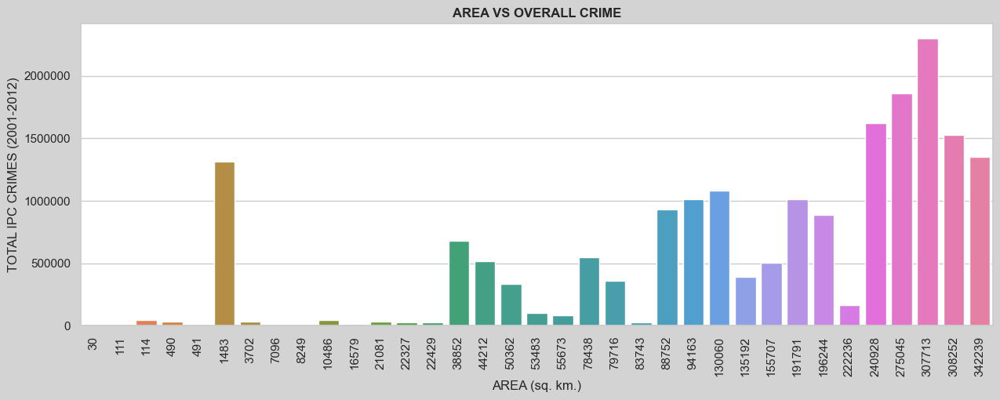

In [158]:
# Bar graph: AREA VS OVERALL CRIME
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Use the 'husl' color palette for multiple colors
sns.barplot(x=df['AREA (sq. km.)'], y=df['TOTAL IPC CRIMES (2001-2012)'], palette='husl')  

plt.title('AREA VS OVERALL CRIME', fontweight='bold')  # Set font weight for the title
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=90)

# Display the plot
plt.show()


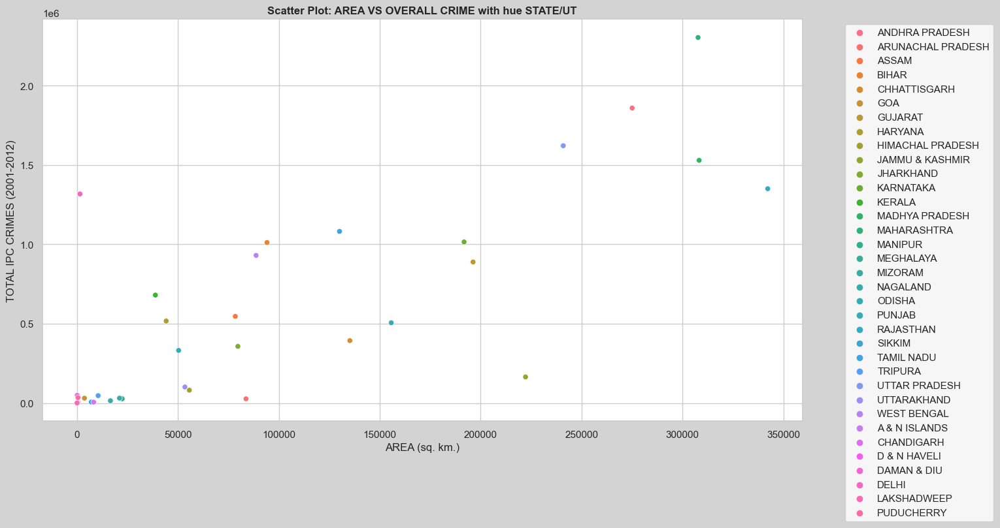

In [295]:
# Scatter plot: AREA VS OVERALL CRIME with hue 'STATE/UT'
plt.figure(figsize=(15, 8), facecolor='lightgray')  # Set facecolor for the entire figure

# Use the 'husl' color palette for multiple colors
sns.scatterplot(x=df['AREA (sq. km.)'], y=df['TOTAL IPC CRIMES (2001-2012)'], hue=df['STATE/UT'], palette='husl')

plt.title('Scatter Plot: AREA VS OVERALL CRIME with hue STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xlabel('AREA (sq. km.)')
plt.ylabel('TOTAL IPC CRIMES (2001-2012)')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()


#### Observations: 

**States with smaller areas and higher population density, such as Delhi, Chandigarh, and Puducherry, tend to have higher total IPC crime numbers. This could be attributed to factors like urbanization, higher population density, and increased opportunities for criminal activities.**

**Larger states like Maharashtra, Madhya Pradesh, and Uttar Pradesh have varying crime rates. This suggests that the impact of area on overall crimes is influenced by factors beyond size alone, such as population, socio-economic conditions, and law enforcement.**

**Despite being small in area, Lakshadweep and Daman & Diu have relatively lower total IPC crime numbers. This could be due to factors such as lower population density, geographic isolation, and possibly effective law enforcement.**

**States like Nagaland, Mizoram, Manipur, and Meghalaya have relatively lower crime rates despite their smaller areas. This might be influenced by their unique geographic and cultural contexts.**

**While Uttar Pradesh and Maharashtra are large states, they also have higher total IPC crime numbers. This could be attributed to their large populations and diverse socio-economic conditions.**

**Kerala, Karnataka, Tamil Nadu, and Goa, despite having relatively smaller areas, exhibit varying crime rates. This highlights the importance of considering regional variations and local factors.**

### 2.5	 Analysis of population vs overall Crime.

In [159]:
# Analysis of Population vs overall Crime
df[['STATE/UT', 'AVERAGE POPULATION (2001-2012)', 'TOTAL IPC CRIMES (2001-2012)']].sort_values(by = 'AVERAGE POPULATION (2001-2012)')

,STATE/UT,AVERAGE POPULATION (2001-2012),TOTAL IPC CRIMES (2001-2012)
33,LAKSHADWEEP,63021.0,537
31,DAMAN & DIU,204737.0,2902
30,D & N HAVELI,288002.0,3762
28,A & N ISLANDS,369462.0,5986
22,SIKKIM,578084.0,6253
29,CHANDIGARH,985563.0,48597
17,MIZORAM,1000418.0,30959
34,PUDUCHERRY,1123124.0,34238
1,ARUNACHAL PRADESH,1255298.0,26791
5,GOA,1408753.0,30734


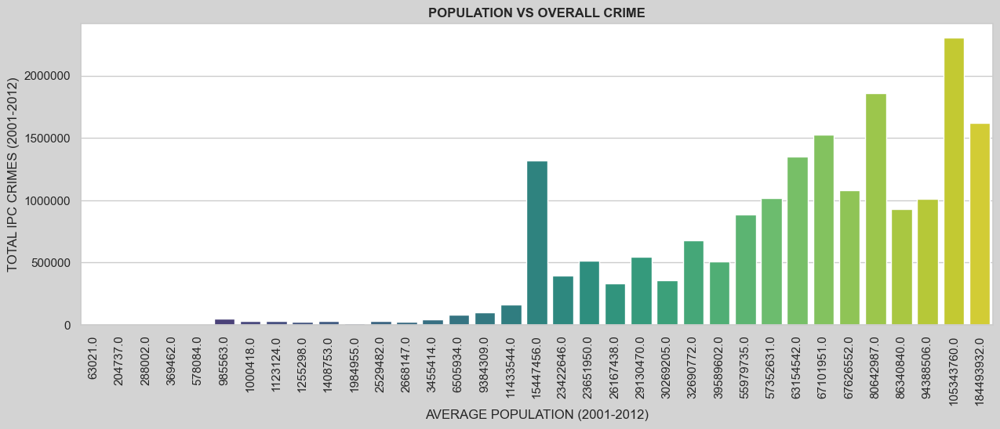

In [160]:
# Bar graph: POPULATION VS OVERALL CRIME
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Use a different color palette (e.g., 'viridis') for the bars
sns.barplot(x=df['AVERAGE POPULATION (2001-2012)'], y=df['TOTAL IPC CRIMES (2001-2012)'], palette='viridis')

plt.title('POPULATION VS OVERALL CRIME', fontweight='bold')  # Set font weight for the title
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=90)

# Display the plot
plt.show()


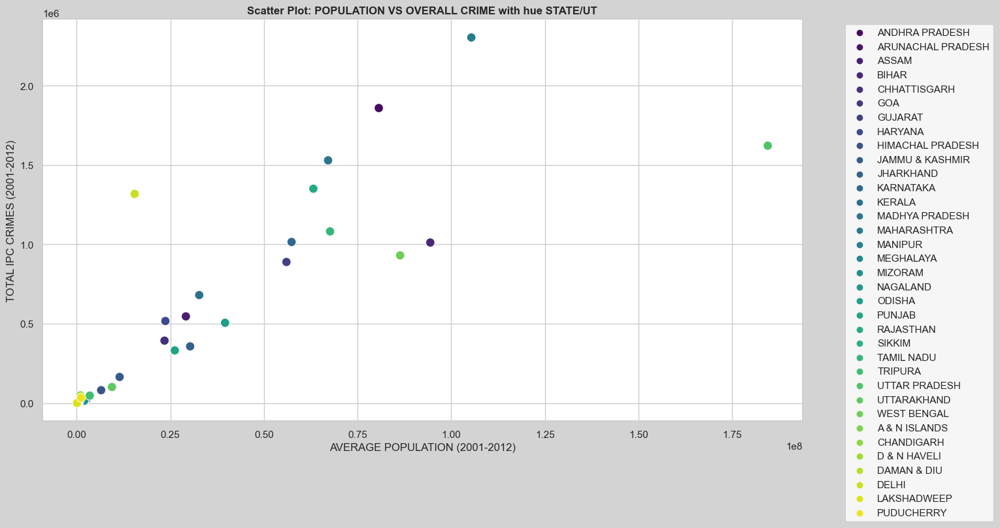

In [298]:
# Scatter plot: POPULATION VS OVERALL CRIME with hue 'STATE/UT'
plt.figure(figsize=(15, 8), facecolor='lightgray')  # Set facecolor for the entire figure

# Use a different color palette (e.g., 'viridis') for the scatter points
sns.scatterplot(x=df['AVERAGE POPULATION (2001-2012)'], y=df['TOTAL IPC CRIMES (2001-2012)'],
                hue=df['STATE/UT'], palette='viridis', s=100)  # 's' controls the marker size

plt.title('Scatter Plot: POPULATION VS OVERALL CRIME with hue STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xlabel('AVERAGE POPULATION (2001-2012)')
plt.ylabel('TOTAL IPC CRIMES (2001-2012)')

# Display legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show()



#### Observations:

**Lakshadweep, Daman & Diu, Dadra and Nagar Haveli, Andaman and Nicobar Islands, and Sikkim have relatively lower average populations. These states/UTs also have lower total IPC crimes, suggesting a potential correlation between lower population and lower crime rates.**

**States like Nagaland and Meghalaya have moderate average populations. The total IPC crimes in these states are also moderate, indicating a somewhat proportional relationship between population and crime rates.**

**States like Jharkhand, Chhattisgarh, Odisha, Haryana, and Assam, with moderate to large populations, show correspondingly moderate to high total IPC crimes.**

**States like Gujarat, Karnataka, Tamil Nadu, Rajasthan, Madhya Pradesh, and Kerala are astates with higher average populations. These states, as expected, exhibit higher total IPC crimes, aligning with the trend observed in larger population states.**

**States like Maharashtra, Uttar Pradesh, Andhra Pradesh, and West Bengal have significantly higher average populations.
Correspondingly, these states exhibit higher total IPC crimes, which might be expected due to the larger population size.**

**Chandigarh is an interesting case with a relatively high total IPC crime count compared to its average population. It is a Union Territory with a smaller population but a higher crime rate.**

**Delhi is also an interesting case as it has a relatively high total IPC crime count compared to its average population.** 

In [120]:
# Analysis of year-on-year total crimes
df[['STATE/UT', 'TOTAL IPC CRIMES (2001)', 'TOTAL IPC CRIMES (2002)', 'TOTAL IPC CRIMES (2003)', 'TOTAL IPC CRIMES (2004)', 
    'TOTAL IPC CRIMES (2005)', 'TOTAL IPC CRIMES (2006)', 'TOTAL IPC CRIMES (2007)', 'TOTAL IPC CRIMES (2008)', 
    'TOTAL IPC CRIMES (2009)', 'TOTAL IPC CRIMES (2010)', 'TOTAL IPC CRIMES (2011)', 'TOTAL IPC CRIMES (2012)']]

,STATE/UT,TOTAL IPC CRIMES (2001),TOTAL IPC CRIMES (2002),TOTAL IPC CRIMES (2003),TOTAL IPC CRIMES (2004),TOTAL IPC CRIMES (2005),TOTAL IPC CRIMES (2006),TOTAL IPC CRIMES (2007),TOTAL IPC CRIMES (2008),TOTAL IPC CRIMES (2009),TOTAL IPC CRIMES (2010),TOTAL IPC CRIMES (2011),TOTAL IPC CRIMES (2012)
0,ANDHRA PRADESH,114549,128751,143548,148416,145741,156776,159059,163935,160192,170236,183251,184183
1,ARUNACHAL PRADESH,2283,2034,1945,2034,2366,2292,2360,2350,2245,2376,2213,2293
2,ASSAM,35226,35891,37216,39578,40065,44118,44261,47424,49333,52389,54974,65527
3,BIHAR,64513,68441,68296,79798,72445,76327,80369,85854,88138,90958,101685,134594
4,CHHATTISGARH,28648,25846,24379,27981,29510,32427,32947,37698,37878,39043,38835,38036
5,GOA,2241,2177,2014,2034,2010,2037,2071,2523,3059,3461,3620,3487
6,GUJARAT,69818,73087,77414,75595,71984,74127,74655,80695,75875,71300,71679,72564
7,HARYANA,29817,30048,28290,30354,36432,43256,44774,48078,48861,57009,59309,60691
8,HIMACHAL PRADESH,6297,6161,5940,6230,6135,6388,7707,7599,6916,7221,7632,6804
9,JAMMU & KASHMIR,13153,13463,13681,13406,12925,12877,13040,12991,14657,15005,15256,14022


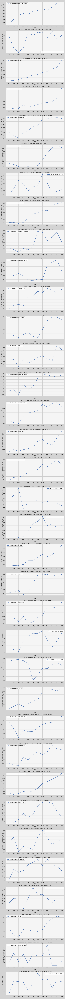

In [161]:
# List of states and UTs
state_ut = ['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR', 'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 
            'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA', 'MADHYA PRADESH', 'MAHARASHTRA', 
            'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU', 
            'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND', 'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
            'DAMAN & DIU', 'DELHI', 'LAKSHADWEEP', 'PUDUCHERRY']

rows = 35
columns = 1

plt.figure(figsize = (10, 150),facecolor='lightgray')

for i in range(0, len(state_ut)):
    plt.subplot(rows, columns, i + 1, facecolor='whitesmoke')
    selected_state_data = df[df['STATE/UT'] == state_ut[i]]  # Access the state name directly
    
    start_column = 'TOTAL IPC CRIMES (2001)'
    end_column = 'TOTAL IPC CRIMES (2012)'
    
    years = range(2001, 2013)
    y_values = selected_state_data.loc[:, start_column:end_column].values.flatten()
    
    # Plotting the line
    plt.plot(years, y_values, marker = 'o', linestyle = '-', label = f'Total IPC Crimes - {state_ut[i]}')

    # Adding labels and title
    plt.xlabel('Year')
    plt.ylabel('TOTAL IPC CRIMES (2001-2012)')
    plt.xticks(range(2001, 2013))
    plt.title(f'TOTAL CRIMES OVER THE YEARS (2001-2012) - {state_ut[i]}')
    plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

#### Observations: 
Andhra Pradesh: The state witnessed a consistent increase in IPC crimes from 2001 to 2012, with a peak in 2011.

Arunachal Pradesh: Although the total IPC crimes in Arunachal Pradesh remained relatively low compared to larger states, there was a noticeable fluctuation during the years.

Assam: Assam showed a general upward trend in crime rates, reaching its highest point in 2012.

Bihar: Bihar experienced a significant increase in IPC crimes over the years, with a substantial spike in 2012.

Chhattisgarh: The state witnessed a fluctuating pattern, with a slight increase in crimes in the latter years.

Goa: Goa had a relatively low incidence of crimes compared to larger states, with a fluctuating trend.

Gujarat: Gujarat showed a fluctuating pattern, with a notable increase in 2012.

Haryana: The state had a general upward trend, peaking in 2011.

Himachal Pradesh: Himachal Pradesh exhibited a fluctuating pattern, with a peak in 2006.

Jammu & Kashmir: The state showed a relatively stable pattern, with a decline in crimes in the later years.

Jharkhand: Jharkhand experienced an increase in crimes, with a notable spike in 2011.

Karnataka: The state had a fluctuating pattern, reaching its peak in 2010.

Kerala: Kerala showed a fluctuating trend, with a notable increase in 2011.

Madhya Pradesh: Madhya Pradesh witnessed a gradual increase in crimes, reaching its peak in 2012.

Maharashtra: Maharashtra had a fluctuating pattern, with a substantial increase in 2012.

Manipur: Manipur showed a fluctuating trend, with a significant spike in 2012.

Meghalaya: Meghalaya had a fluctuating pattern, with a decline in crimes in the later years.

Mizoram: Mizoram exhibited a fluctuating trend, with a notable increase in 2003.

Nagaland: Nagaland showed a fluctuating pattern, with a decline in crimes in the later years.

Odisha: Odisha witnessed a gradual increase in crimes, reaching its peak in 2012.

Punjab: Punjab had a fluctuating pattern, with a decline in crimes in the later years.

Rajasthan: Rajasthan experienced a gradual increase in crimes, reaching its peak in 2012.

Sikkim: Sikkim showed a fluctuating trend, with a peak in 2005.

Tamil Nadu: Tamil Nadu had a fluctuating pattern, with a decline in crimes in the later years.

Tripura: Tripura witnessed a gradual increase in crimes, reaching its peak in 2012.

Uttar Pradesh: Uttar Pradesh showed a fluctuating pattern, with a substantial increase in 2012.

Uttarakhand: Uttarakhand exhibited a fluctuating trend, with a peak in 2009.

West Bengal: West Bengal had a fluctuating pattern, with a substantial increase in 2012.

A & N Islands: The Andaman and Nicobar Islands showed a fluctuating trend, with a peak in 2007.

Chandigarh: Chandigarh had a fluctuating pattern, with a peak in 2007.

D & N Haveli: Daman and Diu showed a fluctuating trend, with a peak in 2010.

Daman & Diu: Daman & Diu exhibited a fluctuating pattern, with a peak in 2006.

Delhi: Delhi experienced a fluctuating pattern, with a substantial increase in 2012.

Lakshadweep: Lakshadweep had a fluctuating trend, with a peak in 2010.

Puducherry: Puducherry exhibited a fluctuating pattern, with a peak in 2012.

In [162]:
# Analysis of total crimes from 2001 to 2012 by state/UT
df[['STATE/UT', 'TOTAL IPC CRIMES (2001-2012)']].sort_values(by = 'TOTAL IPC CRIMES (2001-2012)')

,STATE/UT,TOTAL IPC CRIMES (2001-2012)
33,LAKSHADWEEP,537
31,DAMAN & DIU,2902
30,D & N HAVELI,3762
28,A & N ISLANDS,5986
22,SIKKIM,6253
18,NAGALAND,14497
16,MEGHALAYA,26738
1,ARUNACHAL PRADESH,26791
15,MANIPUR,29367
5,GOA,30734


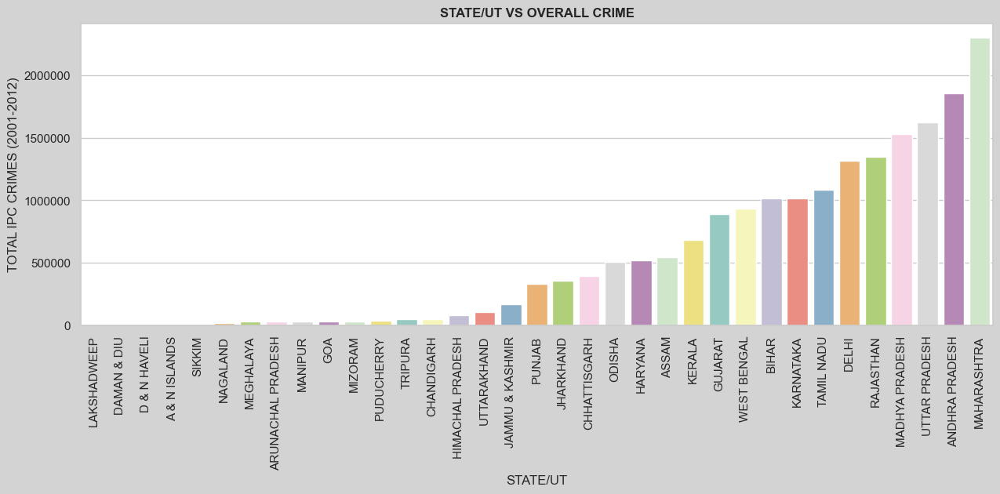

In [163]:
# Bar graph: STATE/UT VS OVERALL CRIME
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL IPC CRIMES (2001-2012)'
state_ut_sorted = df.sort_values(by='TOTAL IPC CRIMES (2001-2012)')

# Use a different color palette (e.g., 'Set3') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL IPC CRIMES (2001-2012)'], palette='Set3')

plt.title('STATE/UT VS OVERALL CRIME', fontweight='bold')  # Set font weight for the title
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=90)

# Display the plot
plt.show()


#### Observations: 

**During the period from 2001 to 2012, the states and Union Territories in India with the lowest total IPC crimes were Lakshadweep, Daman & Diu, D & N Haveli, A & N Islands, Sikkim, Nagaland, Arunachal Pradesh, Mizoram, Chandigarh, and Himachal Pradesh.**

**On the other hand, those with the highest total IPC crimes during the same period were Maharashtra,  Andhra Pradesh, Uttar Pradesh, Madhya Pradesh, Rajasthan, Delhi, Tamil Nadu, Karnataka, Bihar, West Bengal.**

### Crimes against children

In [164]:
children_crimes_data =  pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\03_District_wise_crimes_committed_against_children_2001_2012.csv')

In [165]:
children_crimes_data

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,Selling of girls for prostitution,Prohibition of child marriage act,Other Crimes,Total
0,ANDHRA PRADESH,ADILABAD,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,ANDHRA PRADESH,ANANTAPUR,2001,19.0,12.0,29.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,66
2,ANDHRA PRADESH,CHITTOOR,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9010,LAKSHADWEEP,LAKSHADWEEP,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9011,LAKSHADWEEP,TOTAL,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9012,PUDUCHERRY,KARAIKAL,2012,0.0,3.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,7
9013,PUDUCHERRY,PUDUCHERRY,2012,0.0,4.0,16.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0,25


In [166]:
# Display the names of the columns
children_crimes_data.columns

Index(['STATE/UT', 'DISTRICT', 'Year', 'Murder', 'Rape',
       'Kidnapping and Abduction', 'Foeticide', 'Abetment of suicide',
       'Exposure and abandonment', 'Procuration of minor girls',
       'Buying of girls for prostitution', 'Selling of girls for prostitution',
       'Prohibition of child marriage act', 'Other Crimes', 'Total'],
      dtype='object')

In [167]:
# Display the datatypes of all the columns
children_crimes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9015 entries, 0 to 9014
Data columns (total 15 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   STATE/UT                           9015 non-null   object 
 1   DISTRICT                           9015 non-null   object 
 2   Year                               9015 non-null   int64  
 3   Murder                             9004 non-null   float64
 4   Rape                               9004 non-null   float64
 5   Kidnapping and Abduction           9004 non-null   float64
 6   Foeticide                          9004 non-null   float64
 7   Abetment of suicide                9004 non-null   float64
 8   Exposure and abandonment           9004 non-null   float64
 9   Procuration of minor girls         9004 non-null   float64
 10  Buying of girls for prostitution   9004 non-null   float64
 11  Selling of girls for prostitution  9004 non-null   float

In [168]:
# Checking for the null values in the dataset
children_crimes_data.isnull().sum()

STATE/UT                              0
DISTRICT                              0
Year                                  0
Murder                               11
Rape                                 11
Kidnapping and Abduction             11
Foeticide                            11
Abetment of suicide                  11
Exposure and abandonment             11
Procuration of minor girls           11
Buying of girls for prostitution     11
Selling of girls for prostitution    11
Prohibition of child marriage act    11
Other Crimes                         11
Total                                 0
dtype: int64

In [169]:
# Imputing the null values with 0
children_crimes_data.fillna(0, inplace = True)

In [170]:
# Dropping rows which have TOTAL as value in DISTRICT column
children_crimes_data = children_crimes_data[children_crimes_data['DISTRICT'] != 'TOTAL'].reset_index(drop = True)

In [171]:
# Checking for the duplicated rows in the dataset
children_crimes_data.duplicated().sum()

0

In [172]:
# Storing state/UT values
state_ut = children_crimes_data['STATE/UT'].unique()

# Creating a new DataFrame
children_crimes_df = pd.DataFrame({'STATE/UT': state_ut})

In [173]:
# Adding up total crimes against children for each year
children_crimes_data['TOTAL CRIMES AGAINST CHILDREN'] = children_crimes_data.iloc[:, 3:-1].sum(axis = 1)

In [174]:
# Adding up total crimes against children for all the years
children_crimes_df['TOTAL CRIMES AGAINST CHILDREN (2001-2012)'] = children_crimes_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES AGAINST CHILDREN'].sum().to_list()

In [175]:
children_crimes_df.sort_values(by = 'TOTAL CRIMES AGAINST CHILDREN (2001-2012)')

,STATE/UT,TOTAL CRIMES AGAINST CHILDREN (2001-2012)
33,LAKSHADWEEP,2.0
31,DAMAN & DIU,38.0
18,NAGALAND,68.0
30,D & N HAVELI,103.0
34,PUDUCHERRY,205.0
28,A & N ISLANDS,245.0
1,ARUNACHAL PRADESH,250.0
22,SIKKIM,277.0
17,MIZORAM,423.0
9,JAMMU & KASHMIR,432.0


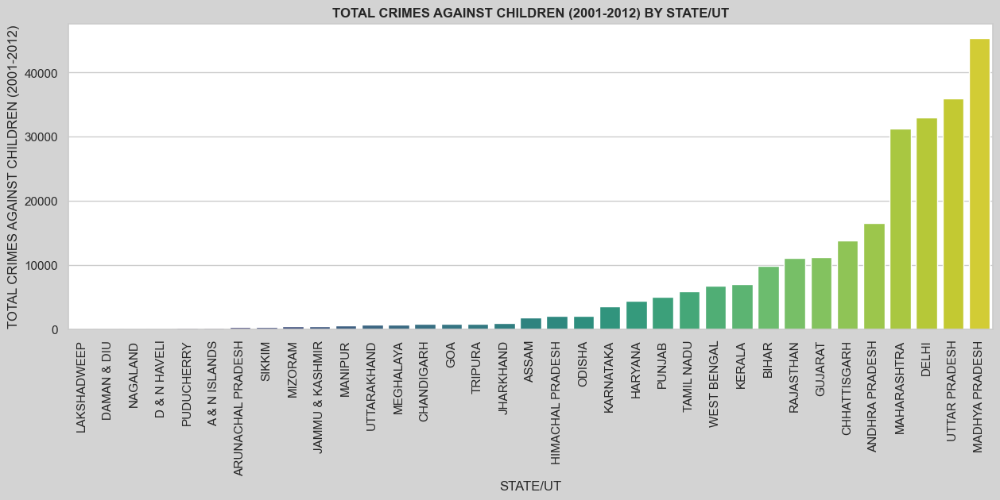

In [177]:
# Bar graph: TOTAL CRIMES AGAINST CHILDREN (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES AGAINST CHILDREN (2001-2012)'
state_ut_sorted = children_crimes_df.sort_values(by='TOTAL CRIMES AGAINST CHILDREN (2001-2012)')

# Use a different color palette (e.g., 'viridis') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES AGAINST CHILDREN (2001-2012)'], palette='viridis')

plt.title('TOTAL CRIMES AGAINST CHILDREN (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=90)

# Display the plot
plt.show()


#### Observations:

**During the period from 2001 to 2012, the states and Union Territories in India with the lowest reported crimes against children were Lakshadweep, Daman & Diu, Nagaland, D & N Haveli, Puducherry, A & N Islands, Arunachal Pradesh, Sikkim, Mizoram, and Jammu & Kashmir.**

**On the other hand, those with the highest reported crimes against children during the same period were Madhya Pradesh, Uttar Pradesh, Delhi, Maharashtra, Andhra Pradesh.**

### Crimes against women

In [178]:
women_crimes_data = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\42_District_wise_crimes_committed_against_women_2001_2012.csv')

In [179]:
women_crimes_data

,STATE/UT,DISTRICT,Year,Rape,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0
...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,1,0,1,0
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,1,0,1,0
9014,PUDUCHERRY,KARAIKAL,2012,6,2,0,2,0,1,0
9015,PUDUCHERRY,PUDUCHERRY,2012,7,14,0,7,2,5,0


In [180]:
# Display the names of the columns
women_crimes_data.columns

Index(['STATE/UT', 'DISTRICT', 'Year', 'Rape', 'Kidnapping and Abduction',
       'Dowry Deaths', 'Assault on women with intent to outrage her modesty',
       'Insult to modesty of Women', 'Cruelty by Husband or his Relatives',
       'Importation of Girls'],
      dtype='object')

In [181]:
# Display the datatypes of all the columns
women_crimes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9017 entries, 0 to 9016
Data columns (total 10 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   STATE/UT                                             9017 non-null   object
 1   DISTRICT                                             9017 non-null   object
 2   Year                                                 9017 non-null   int64 
 3   Rape                                                 9017 non-null   int64 
 4   Kidnapping and Abduction                             9017 non-null   int64 
 5   Dowry Deaths                                         9017 non-null   int64 
 6   Assault on women with intent to outrage her modesty  9017 non-null   int64 
 7   Insult to modesty of Women                           9017 non-null   int64 
 8   Cruelty by Husband or his Relatives                  9017 non-null   int64 
 9

In [182]:
# Checking for the null values in the dataset
women_crimes_data.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
Year                                                   0
Rape                                                   0
Kidnapping and Abduction                               0
Dowry Deaths                                           0
Assault on women with intent to outrage her modesty    0
Insult to modesty of Women                             0
Cruelty by Husband or his Relatives                    0
Importation of Girls                                   0
dtype: int64

In [183]:
# Dropping rows which have TOTAL as value in DISTRICT column
women_crimes_data = women_crimes_data[women_crimes_data['DISTRICT'] != 'TOTAL'].reset_index(drop = True)

In [184]:
# Checking for the duplicated rows in the dataset
women_crimes_data.duplicated().sum()

0

In [185]:
# Storing state/UT values
state_ut = women_crimes_data['STATE/UT'].unique()

# Creating a new DataFrame
women_crimes_df = pd.DataFrame({'STATE/UT': state_ut})

In [186]:
# Adding up total crimes against women for each year
women_crimes_data['TOTAL CRIMES AGAINST WOMEN'] = women_crimes_data.iloc[:, 3:].sum(axis = 1)

In [187]:
# Adding up total crimes against women for all the years
women_crimes_df['TOTAL CRIMES AGAINST WOMEN (2001-2012)'] = women_crimes_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES AGAINST WOMEN'].sum().to_list()

In [188]:
women_crimes_df.sort_values(by = 'TOTAL CRIMES AGAINST WOMEN (2001-2012)')

,STATE/UT,TOTAL CRIMES AGAINST WOMEN (2001-2012)
33,LAKSHADWEEP,20
31,DAMAN & DIU,90
30,D & N HAVELI,243
18,NAGALAND,407
22,SIKKIM,547
28,A & N ISLANDS,570
5,GOA,1175
34,PUDUCHERRY,1226
17,MIZORAM,1719
16,MEGHALAYA,2008


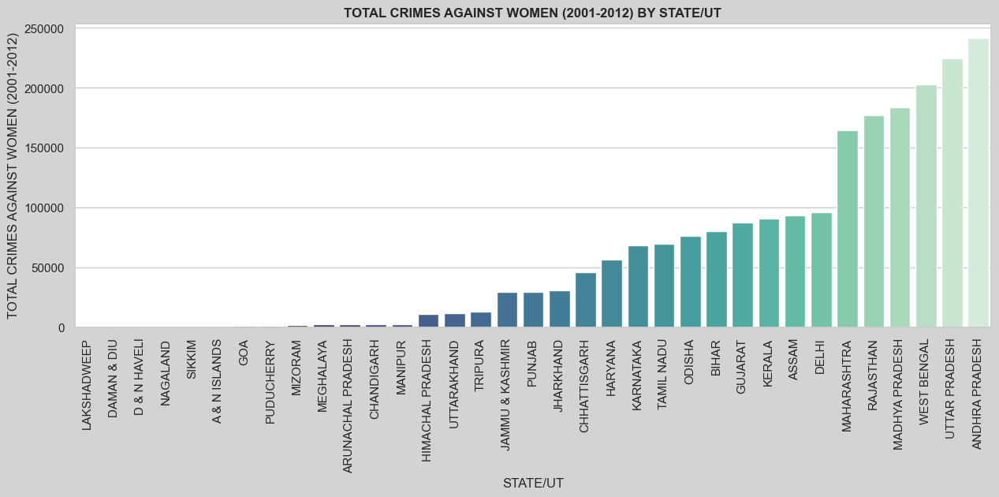

In [189]:
# Bar graph: TOTAL CRIMES AGAINST WOMEN (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES AGAINST WOMEN (2001-2012)'
state_ut_sorted = women_crimes_df.sort_values(by='TOTAL CRIMES AGAINST WOMEN (2001-2012)')

# Use a different color palette (e.g., 'mako') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES AGAINST WOMEN (2001-2012)'], palette='mako')

plt.title('TOTAL CRIMES AGAINST WOMEN (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=90)

# Display the plot
plt.show()


#### Observations:

**Between 2001 and 2012, the states and Union Territories in India with the lowest reported crimes against women were Lakshadweep, Daman & Diu, D & N Haveli, Nagaland, Sikkim, A & N Islands, Goa, Puducherry, Mizoram, and Meghalaya.**

**Contrastingly, the regions with the highest reported crimes against women during this period were Andhra Pradesh, Uttar Pradesh, West Bengal, Madhya Pradesh, Rajasthan, Maharashtra, Delhi.**

### Crimes against SCs

In [190]:
sc_crimes_data = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\02_01_District_wise_crimes_committed_against_SC_2001_2012.csv')

In [191]:
sc_crimes_data.shape

(9018, 13)

In [192]:
# Display the names of the columns
sc_crimes_data.columns

Index(['STATE/UT', 'DISTRICT', 'Year', 'Murder', 'Rape',
       'Kidnapping and Abduction', 'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Prevention of atrocities (POA) Act',
       'Protection of Civil Rights (PCR) Act', 'Other Crimes Against SCs'],
      dtype='object')

In [193]:
sc_crimes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9018 entries, 0 to 9017
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   STATE/UT                              9018 non-null   object
 1   DISTRICT                              9018 non-null   object
 2   Year                                  9018 non-null   int64 
 3   Murder                                9018 non-null   int64 
 4   Rape                                  9018 non-null   int64 
 5   Kidnapping and Abduction              9018 non-null   int64 
 6   Dacoity                               9018 non-null   int64 
 7   Robbery                               9018 non-null   int64 
 8   Arson                                 9018 non-null   int64 
 9   Hurt                                  9018 non-null   int64 
 10  Prevention of atrocities (POA) Act    9018 non-null   int64 
 11  Protection of Civil Rights (PC

In [194]:
# Checking for the null values in the dataset
sc_crimes_data.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping and Abduction                0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Prevention of atrocities (POA) Act      0
Protection of Civil Rights (PCR) Act    0
Other Crimes Against SCs                0
dtype: int64

In [195]:
# Dropping rows which have TOTAL as value in DISTRICT column
sc_crimes_data = sc_crimes_data[sc_crimes_data['DISTRICT'] != 'TOTAL'].reset_index(drop = True)

In [196]:
# Checking for the duplicated rows in the dataset
sc_crimes_data.duplicated().sum()

1

In [197]:
# Dropping the duplicated rows from the dataset
sc_crimes_data.drop_duplicates(keep = 'first', inplace = True)

In [198]:
# Storing state/UT values
state_ut = sc_crimes_data['STATE/UT'].unique()

# Creating a new DataFrame
sc_crimes_df = pd.DataFrame({'STATE/UT': state_ut})

In [199]:
# Adding up total crimes against SCs for each year
sc_crimes_data['TOTAL CRIMES AGAINST SCs'] = sc_crimes_data.iloc[:, 3:].sum(axis = 1)

In [200]:
# Adding up total crimes against SCs for all the years
sc_crimes_df['TOTAL CRIMES AGAINST SCs (2001-2012)'] = sc_crimes_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES AGAINST SCs'].sum().to_list()

In [201]:
sc_crimes_df.sort_values(by = 'TOTAL CRIMES AGAINST SCs (2001-2012)')

,STATE/UT,TOTAL CRIMES AGAINST SCs (2001-2012)
28,A & N ISLANDS,0
16,MEGHALAYA,0
15,MANIPUR,0
17,MIZORAM,1
33,LAKSHADWEEP,1
1,ARUNACHAL PRADESH,2
31,DAMAN & DIU,5
30,D & N HAVELI,7
29,CHANDIGARH,11
5,GOA,33


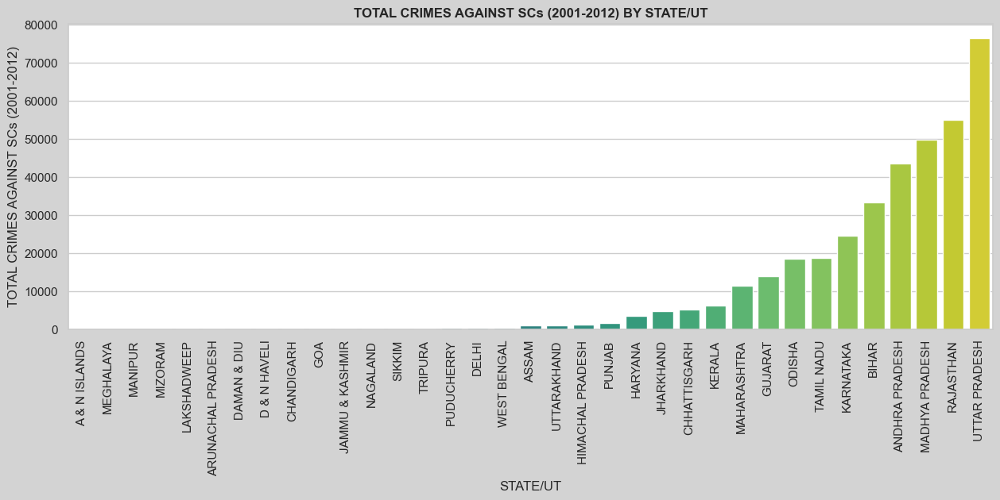

In [202]:
# Bar graph: TOTAL CRIMES AGAINST SCs (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES AGAINST SCs (2001-2012)'
state_ut_sorted = sc_crimes_df.sort_values(by='TOTAL CRIMES AGAINST SCs (2001-2012)')

# Use a different color palette (e.g., 'viridis') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES AGAINST SCs (2001-2012)'], palette='viridis')

plt.title('TOTAL CRIMES AGAINST SCs (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**Between 2001 and 2012, several states and Union Territories in India reported minimal crimes against Scheduled Castes (SCs). A & N Islands, Meghalaya, Manipur, Mizoram, and Lakshadweep recorded almost negligible incidents, with the numbers ranging from 0 to 1. Arunachal Pradesh, Daman & Diu, and D & N Haveli reported slightly higher figures, with 2, 5, and 7 cases, respectively.**

**In contrast, some regions faced more significant challenges, with higher reported crimes against SCs. Uttar Pradesh, Rajasthan, Madhya Pradesh, Andhra Pradesh, and Bihar witnessed comparatively higher numbers, indicating disparities in the treatment of Scheduled Castes across different parts of the country during this period.**

### Crime against STs

In [203]:
st_crimes_data = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\02_District_wise_crimes_committed_against_ST_2001_2012.csv')

In [204]:
st_crimes_data.shape

(9018, 13)

In [205]:
st_crimes_data.columns

Index(['STATE/UT', 'DISTRICT', 'Year', 'Murder', 'Rape',
       'Kidnapping Abduction', 'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Protection of Civil Rights (PCR) Act',
       'Prevention of atrocities (POA) Act', 'Other Crimes Against STs'],
      dtype='object')

In [206]:
st_crimes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9018 entries, 0 to 9017
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   STATE/UT                              9018 non-null   object
 1   DISTRICT                              9018 non-null   object
 2   Year                                  9018 non-null   int64 
 3   Murder                                9018 non-null   int64 
 4   Rape                                  9018 non-null   int64 
 5   Kidnapping Abduction                  9018 non-null   int64 
 6   Dacoity                               9018 non-null   int64 
 7   Robbery                               9018 non-null   int64 
 8   Arson                                 9018 non-null   int64 
 9   Hurt                                  9018 non-null   int64 
 10  Protection of Civil Rights (PCR) Act  9018 non-null   int64 
 11  Prevention of atrocities (POA)

In [207]:
# Checking for the null values in the dataset
st_crimes_data.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping Abduction                    0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Protection of Civil Rights (PCR) Act    0
Prevention of atrocities (POA) Act      0
Other Crimes Against STs                0
dtype: int64

In [208]:
# Dropping rows which have TOTAL as value in DISTRICT column
st_crimes_data = st_crimes_data[st_crimes_data['DISTRICT'] != 'TOTAL'].reset_index(drop = True)

In [209]:
# Checking for the duplicated rows in the dataset
st_crimes_data.duplicated().sum()

1

In [210]:
# Dropping the duplicated rows from the dataset
st_crimes_data.drop_duplicates(keep = 'first', inplace = True)

In [211]:
# Storing state/UT values
state_ut = st_crimes_data['STATE/UT'].unique()

# Creating a new DataFrame
st_crimes_df = pd.DataFrame({'STATE/UT': state_ut})

In [212]:
# Adding up total crimes against SCs for each year
st_crimes_data['TOTAL CRIMES AGAINST STs'] = st_crimes_data.iloc[:, 3:].sum(axis = 1)

In [213]:
# Adding up total crimes against SCs for all the years
st_crimes_df['TOTAL CRIMES AGAINST STs (2001-2012)'] = st_crimes_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES AGAINST STs'].sum().to_list()

In [214]:
st_crimes_df.sort_values(by = 'TOTAL CRIMES AGAINST STs (2001-2012)')

,STATE/UT,TOTAL CRIMES AGAINST STs (2001-2012)
34,PUDUCHERRY,0
29,CHANDIGARH,0
20,PUNJAB,0
32,DELHI,1
33,LAKSHADWEEP,1
16,MEGHALAYA,2
5,GOA,4
31,DAMAN & DIU,5
7,HARYANA,5
9,JAMMU & KASHMIR,8


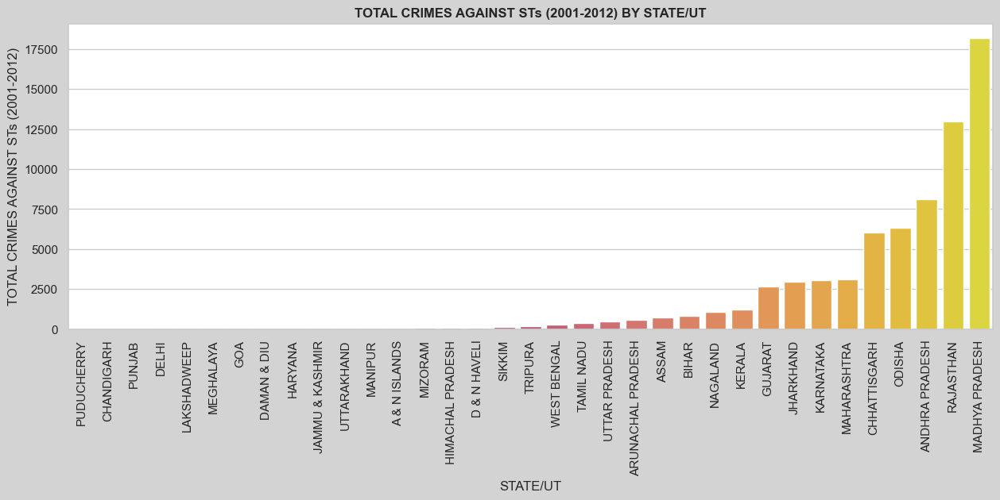

In [215]:
# Bar graph: TOTAL CRIMES AGAINST STs (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES AGAINST STs (2001-2012)'
state_ut_sorted = st_crimes_df.sort_values(by='TOTAL CRIMES AGAINST STs (2001-2012)')

# Use a different color palette (e.g., 'plasma') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES AGAINST STs (2001-2012)'], palette='plasma')

plt.title('TOTAL CRIMES AGAINST STs (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2012, crimes against Scheduled Tribes (STs) varied across states and Union Territories in India. Puducherry, Chandigarh, and Punjab reported no crimes against STs during this period. Delhi and Lakshadweep recorded minimal incidents, with 1 case each.**

**Meghalaya, Goa, Daman & Diu, Haryana, and Jammu & Kashmir reported a small number of cases, ranging from 2 to 8.**

**Madhya Pradesh, Rajasthan, and Andhra Pradesh had higher numbers, reflecting a greater challenge in ensuring the safety of Scheduled Tribes.** 

**States like Gujarat, Jharkhand, Maharashtra, and Chhattisgarh faced more substantial issues, with reported crimes against STs exceeding a few thousand.This indicates variations in the treatment and safety of Scheduled Tribes across different regions during the specified time frame.**

### Crime by place of occurence 

In [216]:
crime_by_place_of_occurrence_data =  pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\17_Crime_by_place_of_occurrence_2001_2012.csv')

In [217]:
crime_by_place_of_occurrence_data.shape

(456, 34)

In [218]:
# Display the names of the columns
crime_by_place_of_occurrence_data.columns

Index(['STATE/UT', 'YEAR', 'RESIDENTIAL PREMISES - Dacoity',
       'RESIDENTIAL PREMISES - Robbery', 'RESIDENTIAL PREMISES - Burglary',
       'RESIDENTIAL PREMISES - Theft', 'HIGHWAYS - Dacoity',
       'HIGHWAYS - Robbery', 'HIGHWAYS - Burglary', 'HIGHWAYS - Theft',
       'RIVER and SEA - Dacoity', 'RIVER and SEA - Robbery',
       'RIVER and SEA - Burglary', 'RIVER and SEA - Theft',
       'RAILWAYS - Dacoity', 'RAILWAYS - Robbery', 'RAILWAYS - Burglary',
       'RAILWAYS - Theft', 'BANKS - Dacoity', 'BANKS - Robbery',
       'BANKS - Burglary', 'BANKS - Theft',
       'COMMERCIAL ESTABLISHMENTS - Dacoity',
       'COMMERCIAL ESTABLISHMENTS - Robbery',
       'COMMERCIAL ESTABLISHMENTS - Burglary',
       'COMMERCIAL ESTABLISHMENTS - Theft', 'OTHER PLACES - Dacoity',
       'OTHER PLACES - Robbery', 'OTHER PLACES - Burglary',
       'OTHER PLACES - Theft', 'TOTAL - Dacoity', 'TOTAL - Robbery',
       'TOTAL - Burglary', 'TOTAL - Theft'],
      dtype='object')

In [178]:
# Display the datatypes of all the columns
crime_by_place_of_occurrence_data.dtypes

STATE/UT                                object
YEAR                                     int64
RESIDENTIAL PREMISES - Dacoity           int64
RESIDENTIAL PREMISES - Robbery           int64
RESIDENTIAL PREMISES - Burglary          int64
RESIDENTIAL PREMISES - Theft             int64
HIGHWAYS - Dacoity                       int64
HIGHWAYS - Robbery                       int64
HIGHWAYS - Burglary                      int64
HIGHWAYS - Theft                         int64
RIVER and SEA - Dacoity                  int64
RIVER and SEA - Robbery                  int64
RIVER and SEA - Burglary                 int64
RIVER and SEA - Theft                    int64
RAILWAYS - Dacoity                       int64
RAILWAYS - Robbery                       int64
RAILWAYS - Burglary                      int64
RAILWAYS - Theft                         int64
BANKS - Dacoity                          int64
BANKS - Robbery                          int64
BANKS - Burglary                         int64
BANKS - Theft

In [219]:
# Checking for the null values in the dataset
crime_by_place_of_occurrence_data.isnull().sum()

STATE/UT                                0
YEAR                                    0
RESIDENTIAL PREMISES - Dacoity          0
RESIDENTIAL PREMISES - Robbery          0
RESIDENTIAL PREMISES - Burglary         0
RESIDENTIAL PREMISES - Theft            0
HIGHWAYS - Dacoity                      0
HIGHWAYS - Robbery                      0
HIGHWAYS - Burglary                     0
HIGHWAYS - Theft                        0
RIVER and SEA - Dacoity                 0
RIVER and SEA - Robbery                 0
RIVER and SEA - Burglary                0
RIVER and SEA - Theft                   0
RAILWAYS - Dacoity                      0
RAILWAYS - Robbery                      0
RAILWAYS - Burglary                     0
RAILWAYS - Theft                        0
BANKS - Dacoity                         0
BANKS - Robbery                         0
BANKS - Burglary                        0
BANKS - Theft                           0
COMMERCIAL ESTABLISHMENTS - Dacoity     0
COMMERCIAL ESTABLISHMENTS - Robber

In [220]:
# Dropping rows which have TOTAL (STATES), TOTAL (UTs), and TOTAL (ALL-INDIA) as values in STATE/UT column
crime_by_place_of_occurrence_data = crime_by_place_of_occurrence_data[~crime_by_place_of_occurrence_data['STATE/UT'].isin(['TOTAL (STATES)', 'TOTAL (UTs)', 'TOTAL (ALL-INDIA)'])].reset_index(drop = True)

In [221]:
crime_by_place_of_occurrence_data.duplicated().sum()

0

In [222]:
# Storing state/UT values
state_ut = crime_by_place_of_occurrence_data['STATE/UT'].unique()

# Creating a new DataFrame
crime_by_place_of_occurrence_df = pd.DataFrame({'STATE/UT': state_ut})

In [223]:
crime_by_place_of_occurrence_data.columns

Index(['STATE/UT', 'YEAR', 'RESIDENTIAL PREMISES - Dacoity',
       'RESIDENTIAL PREMISES - Robbery', 'RESIDENTIAL PREMISES - Burglary',
       'RESIDENTIAL PREMISES - Theft', 'HIGHWAYS - Dacoity',
       'HIGHWAYS - Robbery', 'HIGHWAYS - Burglary', 'HIGHWAYS - Theft',
       'RIVER and SEA - Dacoity', 'RIVER and SEA - Robbery',
       'RIVER and SEA - Burglary', 'RIVER and SEA - Theft',
       'RAILWAYS - Dacoity', 'RAILWAYS - Robbery', 'RAILWAYS - Burglary',
       'RAILWAYS - Theft', 'BANKS - Dacoity', 'BANKS - Robbery',
       'BANKS - Burglary', 'BANKS - Theft',
       'COMMERCIAL ESTABLISHMENTS - Dacoity',
       'COMMERCIAL ESTABLISHMENTS - Robbery',
       'COMMERCIAL ESTABLISHMENTS - Burglary',
       'COMMERCIAL ESTABLISHMENTS - Theft', 'OTHER PLACES - Dacoity',
       'OTHER PLACES - Robbery', 'OTHER PLACES - Burglary',
       'OTHER PLACES - Theft', 'TOTAL - Dacoity', 'TOTAL - Robbery',
       'TOTAL - Burglary', 'TOTAL - Theft'],
      dtype='object')

In [224]:
# Adding up total crimes by place of occurence for each year
crime_by_place_of_occurrence_data['TOTAL CRIMES - RESIDENTIAL PREMISES'] = crime_by_place_of_occurrence_data.iloc[:, 2:6].sum(axis = 1)
crime_by_place_of_occurrence_data['TOTAL CRIMES - HIGHWAYS'] = crime_by_place_of_occurrence_data.iloc[:, 6:10].sum(axis = 1)
crime_by_place_of_occurrence_data['TOTAL CRIMES - RIVER & SEA'] = crime_by_place_of_occurrence_data.iloc[:, 10:14].sum(axis = 1)
crime_by_place_of_occurrence_data['TOTAL CRIMES - RAILWAYS'] = crime_by_place_of_occurrence_data.iloc[:, 14:18].sum(axis = 1)
crime_by_place_of_occurrence_data['TOTAL CRIMES - BANKS'] = crime_by_place_of_occurrence_data.iloc[:, 18:22].sum(axis = 1)
crime_by_place_of_occurrence_data['TOTAL CRIMES - COMMERCIAL ESTABLISHMENT'] = crime_by_place_of_occurrence_data.iloc[:, 22:26].sum(axis = 1)
crime_by_place_of_occurrence_data['TOTAL CRIMES - OTHER PLACES'] = crime_by_place_of_occurrence_data.iloc[:, 26:30].sum(axis = 1)

In [225]:
# Adding up total crimes by place of occurence for all the years
crime_by_place_of_occurrence_df['TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - RESIDENTIAL PREMISES'].sum().to_list()
crime_by_place_of_occurrence_df['TOTAL CRIMES - HIGHWAYS (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - HIGHWAYS'].sum().to_list()
crime_by_place_of_occurrence_df['TOTAL CRIMES - RIVER & SEA (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - RIVER & SEA'].sum().to_list()
crime_by_place_of_occurrence_df['TOTAL CRIMES - RAILWAYS (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - RAILWAYS'].sum().to_list()
crime_by_place_of_occurrence_df['TOTAL CRIMES - BANKS (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - BANKS'].sum().to_list()
crime_by_place_of_occurrence_df['TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - COMMERCIAL ESTABLISHMENT'].sum().to_list()
crime_by_place_of_occurrence_df['TOTAL CRIMES - OTHER PLACES (2001-2012)'] = crime_by_place_of_occurrence_data.groupby('STATE/UT', sort = False)['TOTAL CRIMES - OTHER PLACES'].sum().to_list()

In [228]:
crime_by_place_of_occurrence_df[['STATE/UT', 'TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)']].sort_values(by = 'TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)').reset_index(drop=True)

,STATE/UT,TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)
0,LAKSHADWEEP,70
1,DAMAN & DIU,280
2,D & N HAVELI,490
3,A & N ISLANDS,852
4,SIKKIM,1133
5,MANIPUR,1293
6,PUDUCHERRY,1622
7,NAGALAND,2410
8,GOA,3251
9,MEGHALAYA,3458


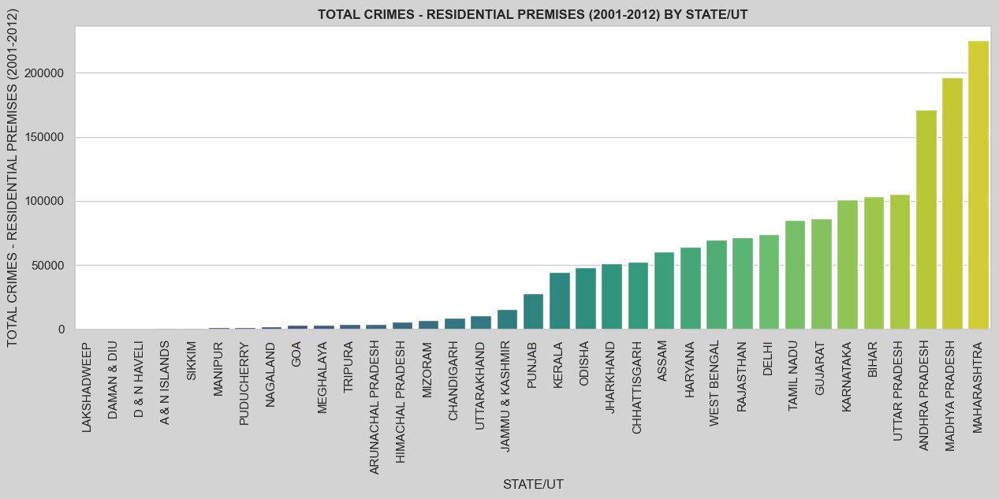

In [229]:
# Bar graph: TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)'
state_ut_sorted = crime_by_place_of_occurrence_df.sort_values(by='TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)')

# Use a different color palette (e.g., 'viridis') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012)'], palette='viridis')

plt.title('TOTAL CRIMES - RESIDENTIAL PREMISES (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2012, crimes within residential premises varied across Indian states and Union Territories. Lakshadweep reported the lowest incidence at 70 cases, followed by Daman & Diu (280) and D & N Haveli (490). States like Arunachal Pradesh, Himachal Pradesh, and Sikkim faced moderate challenges, while Puducherry, Nagaland, and Goa reported higher incidents. Meghalaya, Tripura, and Arunachal Pradesh had substantial cases exceeding 3,000. Larger states such as Uttar Pradesh, Punjab, and Kerala reported tens of thousands of cases, with Punjab facing 28,190 and Kerala 44,685. Bihar, Maharashtra, and Madhya Pradesh faced even higher challenges, with cases ranging from 103,926 to 225,618, showcasing significant variations in residential safety.**

In [230]:
crime_by_place_of_occurrence_df[['STATE/UT', 'TOTAL CRIMES - HIGHWAYS (2001-2012)']].sort_values(by = 'TOTAL CRIMES - HIGHWAYS (2001-2012)')

,STATE/UT,TOTAL CRIMES - HIGHWAYS (2001-2012)
34,PUDUCHERRY,0
29,CHANDIGARH,0
28,A & N ISLANDS,0
33,LAKSHADWEEP,0
31,DAMAN & DIU,1
30,D & N HAVELI,18
22,SIKKIM,37
24,TRIPURA,47
5,GOA,135
1,ARUNACHAL PRADESH,225


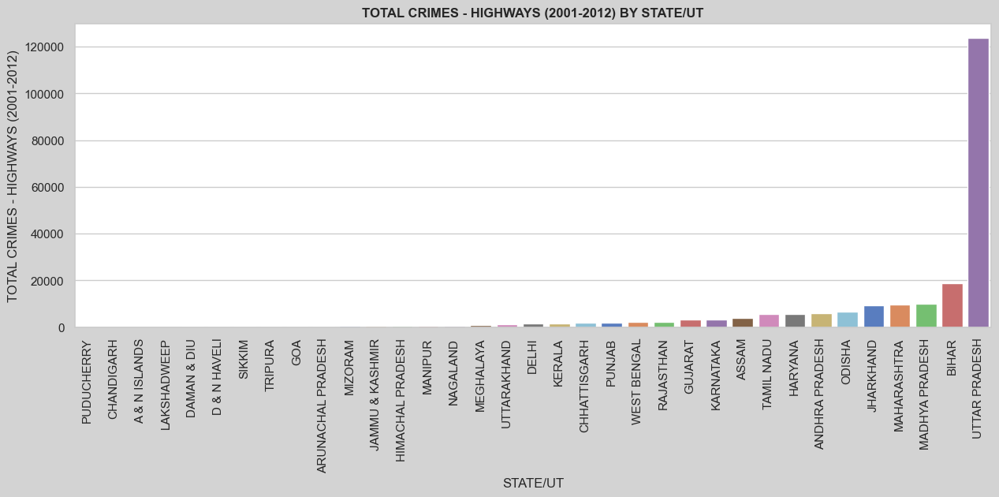

In [233]:
# Bar graph: TOTAL CRIMES - HIGHWAYS (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES - HIGHWAYS (2001-2012)'
state_ut_sorted = crime_by_place_of_occurrence_df.sort_values(by='TOTAL CRIMES - HIGHWAYS (2001-2012)')

# Use a different color palette (e.g., 'muted') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES - HIGHWAYS (2001-2012)'], palette='muted')

plt.title('TOTAL CRIMES - HIGHWAYS (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2012, the incidence of crimes on highways varied significantly across Indian states and Union Territories. Several regions, including Puducherry, Chandigarh, Andaman & Nicobar Islands, and Lakshadweep, reported minimal or no crimes on highways during this period. Daman & Diu, D & N Haveli, and Sikkim faced relatively low challenges, each reporting less than 50 cases. However, larger states such as Uttar Pradesh and Bihar encountered substantial challenges, with Uttar Pradesh reporting a staggering 123,819 cases, highlighting the need for enhanced highway safety measures. Other states with notable cases include Maharashtra, Madhya Pradesh, and Tamil Nadu, with numbers ranging from 9,731 to 10,025.** 

In [234]:
crime_by_place_of_occurrence_df[['STATE/UT', 'TOTAL CRIMES - RIVER & SEA (2001-2012)']].sort_values(by = 'TOTAL CRIMES - RIVER & SEA (2001-2012)')

,STATE/UT,TOTAL CRIMES - RIVER & SEA (2001-2012)
32,DELHI,0
18,NAGALAND,0
29,CHANDIGARH,0
22,SIKKIM,0
26,UTTARAKHAND,0
24,TRIPURA,0
34,PUDUCHERRY,1
33,LAKSHADWEEP,1
8,HIMACHAL PRADESH,1
16,MEGHALAYA,2


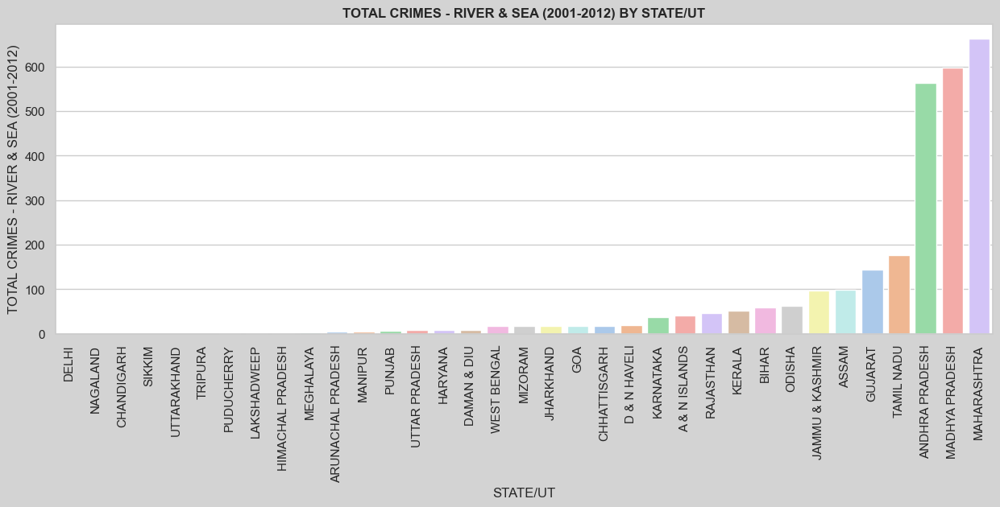

In [235]:
# Bar graph: TOTAL CRIMES - RIVER & SEA (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES - RIVER & SEA (2001-2012)'
state_ut_sorted = crime_by_place_of_occurrence_df.sort_values(by='TOTAL CRIMES - RIVER & SEA (2001-2012)')

# Use a different color palette (e.g., 'pastel') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES - RIVER & SEA (2001-2012)'], palette='pastel')

plt.title('TOTAL CRIMES - RIVER & SEA (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations: 

**From 2001 to 2012, crimes near rivers and seas were reported across various states and Union Territories in India. Delhi, Nagaland, Chandigarh, Sikkim, Uttarakhand, and Tripura reported no incidents during this period. Conversely, Puducherry, Lakshadweep, Himachal Pradesh, and Meghalaya reported a minimal number of cases, ranging from 1 to 2. Larger states like Uttar Pradesh, Haryana, and West Bengal reported moderate numbers of incidents, with 8 to 17 cases each. Daman & Diu, Mizoram, Jharkhand, Goa, and Chhattisgarh reported 9 to 19 cases. States with relatively higher incidents include Karnataka (37 cases), Andaman & Nicobar Islands (41 cases), Rajasthan (46 cases), and Kerala (51 cases). Bihar, Odisha, and Jammu & Kashmir reported 59 to 96 cases. Assam, Gujarat, Tamil Nadu, Andhra Pradesh, Madhya Pradesh, and Maharashtra faced a comparatively higher number of incidents, ranging from 99 to 663 cases.**

In [236]:
crime_by_place_of_occurrence_df[['STATE/UT', 'TOTAL CRIMES - RAILWAYS (2001-2012)']].sort_values(by = 'TOTAL CRIMES - RAILWAYS (2001-2012)')

,STATE/UT,TOTAL CRIMES - RAILWAYS (2001-2012)
34,PUDUCHERRY,0
1,ARUNACHAL PRADESH,0
31,DAMAN & DIU,0
30,D & N HAVELI,0
29,CHANDIGARH,0
28,A & N ISLANDS,0
33,LAKSHADWEEP,0
16,MEGHALAYA,0
15,MANIPUR,0
22,SIKKIM,2


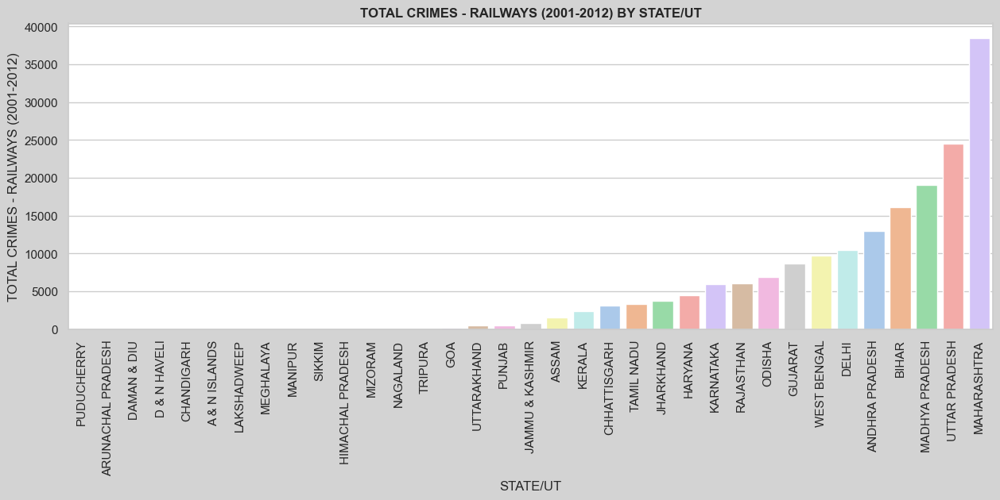

In [237]:
# Bar graph: TOTAL CRIMES - RAILWAYS (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES - RAILWAYS (2001-2012)'
state_ut_sorted = crime_by_place_of_occurrence_df.sort_values(by='TOTAL CRIMES - RAILWAYS (2001-2012)')

# Use a different color palette (e.g., 'pastel') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES - RAILWAYS (2001-2012)'], palette='pastel')

plt.title('TOTAL CRIMES - RAILWAYS (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2012, crimes related to railways were reported in various states and Union Territories in India. Several regions, including Puducherry, Arunachal Pradesh, Daman & Diu, D & N Haveli, Chandigarh, Andaman & Nicobar Islands, Lakshadweep, Meghalaya, Manipur, and Sikkim, reported no incidents during this period. However, Himachal Pradesh, Mizoram, and Nagaland reported a small number of cases, ranging from 2 to 28. States like Tripura, Goa, and Uttarakhand reported moderate incidents, with 53 to 468 cases each. Larger states such as Punjab, Jammu & Kashmir, Assam, Kerala, Chhattisgarh, Tamil Nadu, Jharkhand, Haryana, Karnataka, Rajasthan, and Odisha reported higher numbers, ranging from 518 to 9661 cases. Gujarat, West Bengal, Delhi, Andhra Pradesh, Bihar, Madhya Pradesh, Uttar Pradesh, and Maharashtra faced a significant number of incidents, ranging from 8708 to 38482 cases.**

In [254]:
crime_by_place_of_occurrence_df[['STATE/UT', 'TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)']].sort_values(by = 'TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)')

,STATE/UT,TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)
33,LAKSHADWEEP,37
22,SIKKIM,191
28,A & N ISLANDS,255
31,DAMAN & DIU,334
30,D & N HAVELI,359
34,PUDUCHERRY,741
16,MEGHALAYA,997
18,NAGALAND,1065
15,MANIPUR,1155
24,TRIPURA,1252


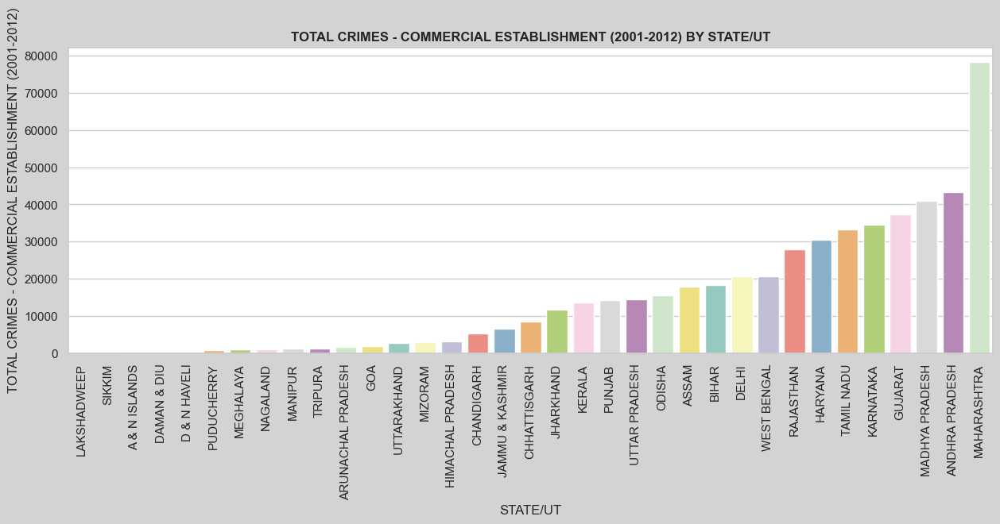

In [242]:
# Bar graph: TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)'
state_ut_sorted = crime_by_place_of_occurrence_df.sort_values(by='TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)')

# Use a different color palette (e.g., 'Set3') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012)'], palette='Set3')

plt.title('TOTAL CRIMES - COMMERCIAL ESTABLISHMENT (2001-2012) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2012, crimes related to commercial establishments varied across Indian states and Union Territories. Maharashtra reported the highest number of cases with 78,355, followed by Andhra Pradesh with 43,298 and Madhya Pradesh with 40,973. Gujarat, Karnataka, and Tamil Nadu also reported substantial numbers. Lakshadweep had the lowest incidence with 37 cases, while several northeastern states and union territories reported relatively lower numbers. The data highlights regional variations in crimes related to commercial establishments during this period.**

### Human rights violation by police

In [243]:
human_rights_violation_by_police_data  = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\35_Human_rights_violation_by_police_2001_2010.csv')

In [244]:
human_rights_violation_by_police_data

,Area_Name,Year,Group_Name,Sub_Group_Name,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted
0,Andhra Pradesh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0
1,Arunachal Pradesh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0
2,Assam,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0
3,Bihar,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0
4,Chandigarh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0
...,...,...,...,...,...,...,...
2262,Meghalaya,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),0.0,0.0,0.0
2263,Nagaland,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),0.0,0.0,0.0
2264,Odisha,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),5.0,1.0,0.0
2265,Uttar Pradesh,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),6.0,5.0,0.0


In [245]:
# Display the names of the columns
human_rights_violation_by_police_data.columns

Index(['Area_Name', 'Year', 'Group_Name', 'Sub_Group_Name',
       'Cases_Registered_under_Human_Rights_Violations',
       'Policemen_Chargesheeted', 'Policemen_Convicted'],
      dtype='object')

In [246]:
# Display the datatypes of all the columns
human_rights_violation_by_police_data.dtypes

Area_Name                                          object
Year                                                int64
Group_Name                                         object
Sub_Group_Name                                     object
Cases_Registered_under_Human_Rights_Violations    float64
Policemen_Chargesheeted                           float64
Policemen_Convicted                               float64
dtype: object

In [247]:
# Checking for the null values in the dataset
human_rights_violation_by_police_data.isnull().sum()

Area_Name                                           0
Year                                                0
Group_Name                                          0
Sub_Group_Name                                      0
Cases_Registered_under_Human_Rights_Violations      2
Policemen_Chargesheeted                            54
Policemen_Convicted                               104
dtype: int64

In [248]:
# Imputing null values with 0
human_rights_violation_by_police_data.fillna(0, inplace = True)

In [249]:
# Checking for the duplicated rows in the dataset
human_rights_violation_by_police_data.duplicated().sum()

0

In [250]:
# Storing state/UT values
state_ut = human_rights_violation_by_police_data['Area_Name'].unique()

# Creating a new DataFrame
HR_violation_by_police_df = pd.DataFrame({'STATE/UT': state_ut})

In [251]:
# Adding up total cases registered, total policemen chargesheeted, and total policmen convicted for all the years
HR_violation_by_police_df['TOTAL CASES RESIGTERED (2001-2010)'] = human_rights_violation_by_police_data .groupby('Area_Name', sort = False)['Cases_Registered_under_Human_Rights_Violations'].sum().to_list()
HR_violation_by_police_df['TOTAL POLICEMEN CHARGESHEETED (2001-2010)'] = human_rights_violation_by_police_data .groupby('Area_Name', sort = False)['Policemen_Chargesheeted'].sum().to_list()
HR_violation_by_police_df['TOTAL POLICEMEN CONVICTED (2001-2010)'] = human_rights_violation_by_police_data .groupby('Area_Name', sort = False)['Policemen_Convicted'].sum().to_list()

In [257]:
HR_violation_by_police_df[['STATE/UT', 'TOTAL CASES RESIGTERED (2001-2010)']].sort_values(by = 'TOTAL CASES RESIGTERED (2001-2010)')


,STATE/UT,TOTAL CASES RESIGTERED (2001-2010)
15,Nagaland,0.0
26,Tripura,0.0
24,Mizoram,0.0
19,Daman & Diu,0.0
14,Meghalaya,0.0
8,Himachal Pradesh,0.0
29,Uttarakhand,2.0
30,Puducherry,2.0
4,Chandigarh,2.0
10,Jharkhand,6.0


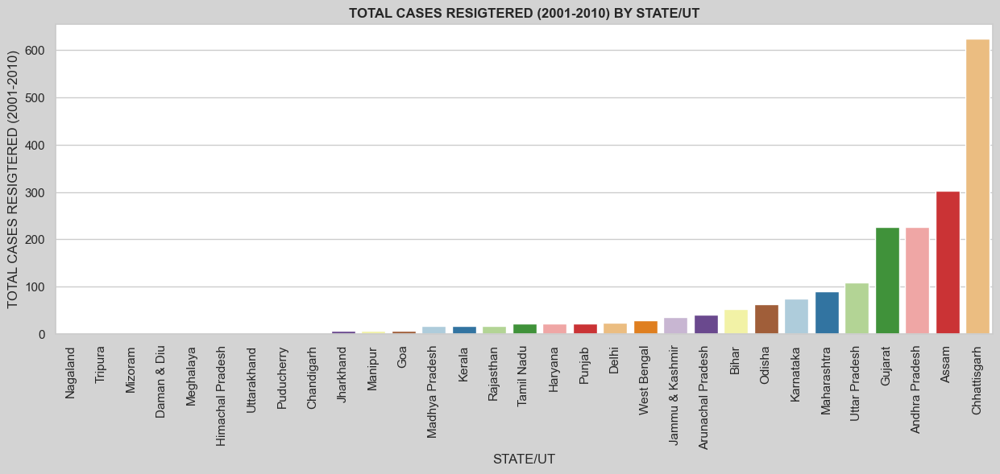

In [258]:
# Bar graph: TOTAL CASES RESIGTERED (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CASES RESIGTERED (2001-2010)'
state_ut_sorted = HR_violation_by_police_df.sort_values(by='TOTAL CASES RESIGTERED (2001-2010)')

# Use a different color palette (e.g., 'Paired') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CASES RESIGTERED (2001-2010)'], palette='Paired')

plt.title('TOTAL CASES RESIGTERED (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2010, varying degrees of human rights violations by the police were reported across different states and Union Territories in India. Some regions, such as Nagaland, Tripura, Mizoram, Daman & Diu, Meghalaya, and Himachal Pradesh, reported zero cases. On the other hand, Andhra Pradesh and Gujarat had the highest numbers, each recording 226 cases, while Assam reported 302 cases. Chhattisgarh stood out with a significant number of cases, registering 624 incidents.**

In [259]:
HR_violation_by_police_df[['STATE/UT', 'TOTAL POLICEMEN CHARGESHEETED (2001-2010)']].sort_values(by = 'TOTAL POLICEMEN CHARGESHEETED (2001-2010)')

,STATE/UT,TOTAL POLICEMEN CHARGESHEETED (2001-2010)
15,Nagaland,0.0
26,Tripura,0.0
24,Mizoram,0.0
23,Manipur,0.0
19,Daman & Diu,0.0
29,Uttarakhand,0.0
14,Meghalaya,0.0
8,Himachal Pradesh,0.0
30,Puducherry,0.0
4,Chandigarh,0.0


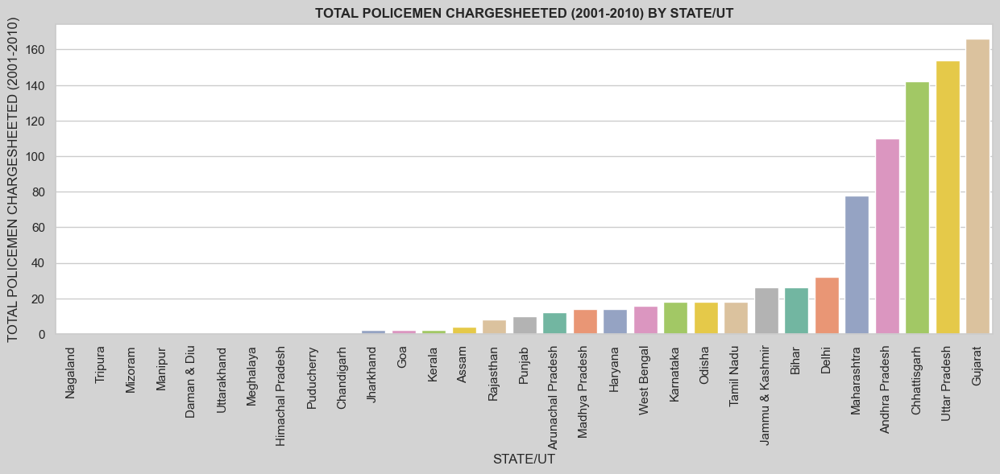

In [260]:
# Bar graph: TOTAL POLICEMEN CHARGESHEETED (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL POLICEMEN CHARGESHEETED (2001-2010)'
state_ut_sorted = HR_violation_by_police_df.sort_values(by='TOTAL POLICEMEN CHARGESHEETED (2001-2010)')

# Use a different color palette (e.g., 'Set2') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL POLICEMEN CHARGESHEETED (2001-2010)'], palette='Set2')

plt.title('TOTAL POLICEMEN CHARGESHEETED (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2010, the data on total policemen chargesheeted indicates variations across different states and Union Territories in India. Several regions, including Nagaland, Tripura, Mizoram, Manipur, Daman & Diu, Uttarakhand, Meghalaya, Himachal Pradesh, Puducherry, and Chandigarh, reported zero cases. Jharkhand, Goa, and Kerala had minimal cases, with 2 each. Assam reported 4 cases, while Rajasthan, Punjab, and Arunachal Pradesh had 8, 10, and 12 cases, respectively. The numbers increased in Madhya Pradesh, Haryana, West Bengal, Karnataka, Odisha, and Tamil Nadu, ranging from 14 to 26 cases. Delhi had 32 cases, and Maharashtra had a relatively higher count with 78 cases. Andhra Pradesh recorded 110 cases, while Chhattisgarh, Uttar Pradesh, and Gujarat reported 142, 154, and 166 cases, respectively.**

In [261]:
HR_violation_by_police_df[['STATE/UT', 'TOTAL POLICEMEN CONVICTED (2001-2010)']].sort_values(by = 'TOTAL POLICEMEN CONVICTED (2001-2010)')

,STATE/UT,TOTAL POLICEMEN CONVICTED (2001-2010)
15,Nagaland,0.0
28,Goa,0.0
27,Delhi,0.0
26,Tripura,0.0
25,Kerala,0.0
24,Mizoram,0.0
23,Manipur,0.0
22,Tamil Nadu,0.0
21,Rajasthan,0.0
20,Punjab,0.0


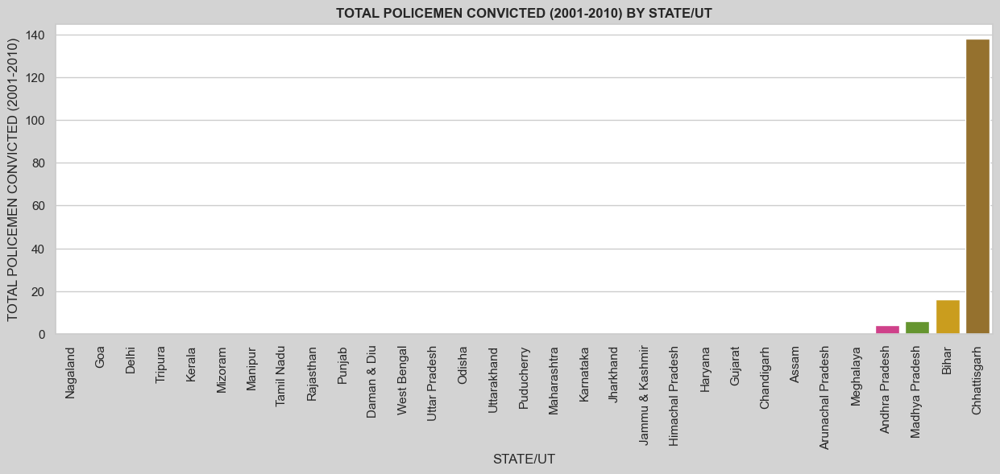

In [262]:
# Bar graph: TOTAL POLICEMEN CONVICTED (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL POLICEMEN CONVICTED (2001-2010)'
state_ut_sorted = HR_violation_by_police_df.sort_values(by='TOTAL POLICEMEN CONVICTED (2001-2010)')

# Use a different color palette (e.g., 'Dark2') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL POLICEMEN CONVICTED (2001-2010)'], palette='Dark2')

plt.title('TOTAL POLICEMEN CONVICTED (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**The data on total policemen convicted from 2001 to 2010 reveals varied patterns across different states and Union Territories in India. Numerous regions, including Nagaland, Goa, Delhi, Tripura, Kerala, Mizoram, Manipur, Tamil Nadu, Rajasthan, Punjab, Daman & Diu, West Bengal, Uttar Pradesh, Odisha, Uttarakhand, Puducherry, and Maharashtra, reported zero convictions during this period. Conversely, Andhra Pradesh had 4 convictions, and Madhya Pradesh had 6. Bihar reported 16 convictions, while Chhattisgarh had a notably higher count with 138 convictions.**

### Juvenile apprehended state

In [263]:
juvenile_apprehended_state_data = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\08_01_Juvenile_apprehended_state_IPC_2001_2010.csv')

In [264]:
juvenile_apprehended_state_data

,STATE/UT,Year,CRIME,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Total for boys all Age Groups,Total for girls all Age Groups,Grand total
0,Andhra Pradesh,2001,Murder,3,0,7,0,5,0,15,0,15
1,Andhra Pradesh,2001,Attempt to Commit Murder,2,0,0,0,11,0,13,0,13
2,Andhra Pradesh,2001,C H Not amounting to Murder,0,0,0,0,0,0,0,0,0
3,Andhra Pradesh,2001,Rape,2,0,15,0,2,1,19,1,20
4,Andhra Pradesh,2001,Custodial Rape,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
10495,Puducherry,2010,Cruelty by Husband or Relatives,0,0,0,0,0,0,0,0,0
10496,Puducherry,2010,Importation of girls from Foreign Countr,0,0,0,0,0,0,0,0,0
10497,Puducherry,2010,Causing death by negligence,0,0,0,0,0,0,0,0,0
10498,Puducherry,2010,Other IPC Crimes,0,0,1,0,2,3,3,3,6


In [265]:
# Display the names of the columns
juvenile_apprehended_state_data.columns

Index(['STATE/UT', 'Year', 'CRIME', 'Boys 7-12 Years', 'Girls 7-12 Years',
       'Boys 12-16 Years', 'Girls 12-16 Years', 'Boys 16-18 Years',
       'Girls 16-18 Years', 'Total for boys all Age Groups',
       'Total for girls all Age Groups', 'Grand total'],
      dtype='object')

In [266]:
# Display the datatypes of all the columns
juvenile_apprehended_state_data.dtypes

STATE/UT                          object
Year                               int64
CRIME                             object
Boys 7-12 Years                    int64
Girls 7-12 Years                   int64
Boys 12-16 Years                   int64
Girls 12-16 Years                  int64
Boys 16-18 Years                   int64
Girls 16-18 Years                  int64
Total for boys all Age Groups      int64
Total for girls all Age Groups     int64
Grand total                        int64
dtype: object

In [267]:
# Checking for the null values in the dataset
juvenile_apprehended_state_data.isnull().sum()

STATE/UT                          0
Year                              0
CRIME                             0
Boys 7-12 Years                   0
Girls 7-12 Years                  0
Boys 12-16 Years                  0
Girls 12-16 Years                 0
Boys 16-18 Years                  0
Girls 16-18 Years                 0
Total for boys all Age Groups     0
Total for girls all Age Groups    0
Grand total                       0
dtype: int64

In [268]:
# Checking the unique values in CRIME column
juvenile_apprehended_state_data['CRIME'].unique()

array(['Murder', 'Attempt to Commit Murder',
       'C H Not amounting to Murder', 'Rape', 'Custodial Rape',
       'Other Rape', 'Kidnapping & Abduction', 'K & A of Women and Girls',
       'K & A of others', 'Dacoity', 'Preparation & Assembly for Dacoity',
       'Robbery', 'Burglary', 'Theft', 'Auto Theft', 'Other Theft',
       'Riots', 'Criminal Breach of Trust', 'Cheating', 'Counterfeiting',
       'Arson', 'Hurt/Grevious Hurt', 'Dowry Deaths',
       'Assault on Women wih intent to outrage h',
       'Insult to Modesty of Women', 'Cruelty by Husband or Relatives',
       'Importation of girls from Foreign Countr',
       'Causing death by negligence', 'Other IPC Crimes',
       'Total IPC Crimes'], dtype=object)

In [269]:
# Dropping rows which have Total IPC crimes as value in CRIME column
juvenile_apprehended_state_data = juvenile_apprehended_state_data[juvenile_apprehended_state_data['CRIME'] != 'Total IPC Crimes'].reset_index(drop = True)

In [270]:
# Checking for the duplicated rows in the dataset
juvenile_apprehended_state_data.duplicated().sum()

0

In [271]:
# Storing state/UT values
state_ut = juvenile_apprehended_state_data['STATE/UT'].unique()

# Creating a new DataFrame
juvenile_apprehended_state_df = pd.DataFrame({'STATE/UT': state_ut})

In [272]:
# Adding up juvenile apprehended state for the different age groups boys and girls for all the years
juvenile_apprehended_state_df['TOTAL CRIMES BOYS AGE: 7-12 YEARS (2001-2010)'] = juvenile_apprehended_state_data.groupby('STATE/UT', sort = False)['Boys 7-12 Years'].sum().to_list()
juvenile_apprehended_state_df['TOTAL CRIMES BOYS AGE: 12-16 YEARS (2001-2010)'] = juvenile_apprehended_state_data.groupby('STATE/UT', sort = False)['Boys 12-16 Years'].sum().to_list()
juvenile_apprehended_state_df['TOTAL CRIMES BOYS AGE: 16-18 YEARS (2001-2010)'] = juvenile_apprehended_state_data.groupby('STATE/UT', sort = False)['Boys 16-18 Years'].sum().to_list()
juvenile_apprehended_state_df['TOTAL CRIMES GIRLS AGE: 7-12 YEARS (2001-2010)'] = juvenile_apprehended_state_data.groupby('STATE/UT', sort = False)['Girls 7-12 Years'].sum().to_list()
juvenile_apprehended_state_df['TOTAL CRIMES GIRLS AGE: 12-16 YEARS (2001-2010)'] = juvenile_apprehended_state_data.groupby('STATE/UT', sort = False)['Girls 12-16 Years'].sum().to_list()
juvenile_apprehended_state_df['TOTAL CRIMES GIRLS AGE: 16-18 YEARS (2001-2010)'] = juvenile_apprehended_state_data.groupby('STATE/UT', sort = False)['Girls 16-18 Years'].sum().to_list()

# Adding up juvenile apprehended state for boys and girls for all the age groups for all the years
juvenile_apprehended_state_df['TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)'] = juvenile_apprehended_state_df[['TOTAL CRIMES BOYS AGE: 7-12 YEARS (2001-2010)', 'TOTAL CRIMES BOYS AGE: 12-16 YEARS (2001-2010)', 'TOTAL CRIMES BOYS AGE: 16-18 YEARS (2001-2010)']].sum(axis=1)
juvenile_apprehended_state_df['TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)'] = juvenile_apprehended_state_df[['TOTAL CRIMES GIRLS AGE: 7-12 YEARS (2001-2010)', 'TOTAL CRIMES GIRLS AGE: 12-16 YEARS (2001-2010)', 'TOTAL CRIMES GIRLS AGE: 16-18 YEARS (2001-2010)']].sum(axis=1)
juvenile_apprehended_state_df['TOTAL CRIMES BY JUVENILES (2001-2010)'] = juvenile_apprehended_state_df[['TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)', 'TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)']].sum(axis=1)

In [273]:
juvenile_apprehended_state_df[['STATE/UT', 'TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)']].sort_values(by = 'TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)')

,STATE/UT,TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)
15,Manipur,0
33,Lakshadweep,1
31,Daman & Diu,53
9,Jammu & Kashmir,104
18,Nagaland,145
30,D&N Haveli,165
24,Tripura,213
28,A&N Islands,239
22,Sikkim,462
34,Puducherry,566


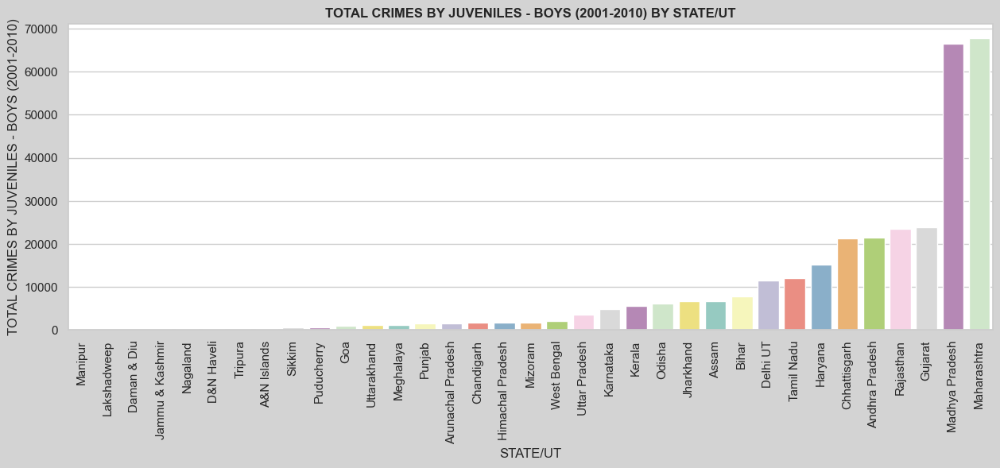

In [275]:
# Bar graph: TOTAL CRIMES BY JUVENILES - BOYS (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)'
state_ut_sorted = juvenile_apprehended_state_df.sort_values(by='TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)')

# Use a different color palette (e.g., 'Set3') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES BY JUVENILES - BOYS (2001-2010)'], palette='Set3')

plt.title('TOTAL CRIMES BY JUVENILES - BOYS (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()



#### Observations:

**From 2001 to 2010, the data on crimes committed by juvenile boys in India reveals significant variation across states and Union Territories. Manipur reported no cases, while states like Maharashtra, Madhya Pradesh, and Delhi registered higher figures, indicating a diverse landscape of juvenile crimes in the country.**

In [276]:
juvenile_apprehended_state_df[['STATE/UT', 'TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)']].sort_values(by = 'TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)')

,STATE/UT,TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)
31,Daman & Diu,0
15,Manipur,0
33,Lakshadweep,1
30,D&N Haveli,2
18,Nagaland,3
26,Uttarakhand,5
1,Arunachal Pradesh,9
9,Jammu & Kashmir,18
22,Sikkim,19
34,Puducherry,26


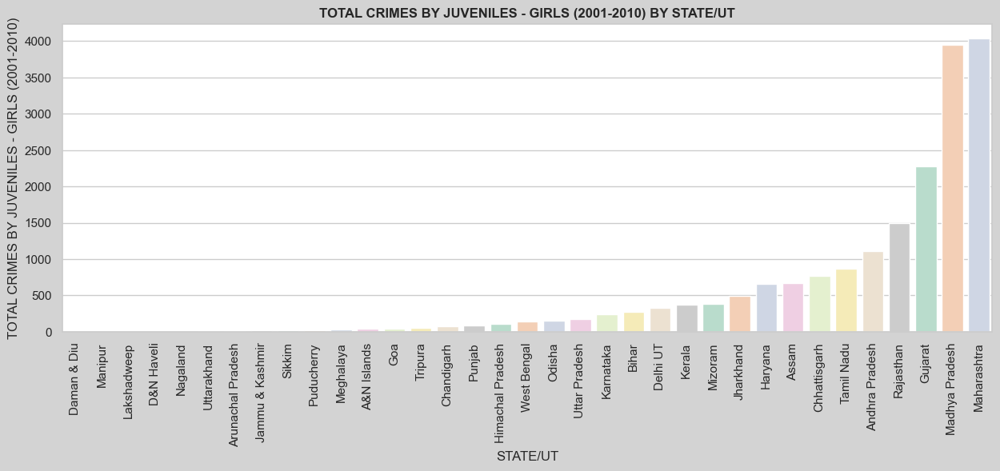

In [277]:
# Bar graph: TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)'
state_ut_sorted = juvenile_apprehended_state_df.sort_values(by='TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)')

# Use a different color palette (e.g., 'Pastel2') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010)'], palette='Pastel2')

plt.title('TOTAL CRIMES BY JUVENILES - GIRLS (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2010, data on crimes committed by juvenile girls in India presents varied trends across states and Union Territories. Some regions reported minimal or no cases, such as Daman & Diu and Manipur, while others like Maharashtra and Madhya Pradesh documented higher instances. The numbers indicate a diverse pattern of juvenile delinquency among girls in different parts of the country.**

In [278]:
juvenile_apprehended_state_df[['STATE/UT', 'TOTAL CRIMES BY JUVENILES (2001-2010)']].sort_values(by = 'TOTAL CRIMES BY JUVENILES (2001-2010)')

,STATE/UT,TOTAL CRIMES BY JUVENILES (2001-2010)
15,Manipur,0
33,Lakshadweep,2
31,Daman & Diu,53
9,Jammu & Kashmir,122
18,Nagaland,148
30,D&N Haveli,167
24,Tripura,264
28,A&N Islands,278
22,Sikkim,481
34,Puducherry,592


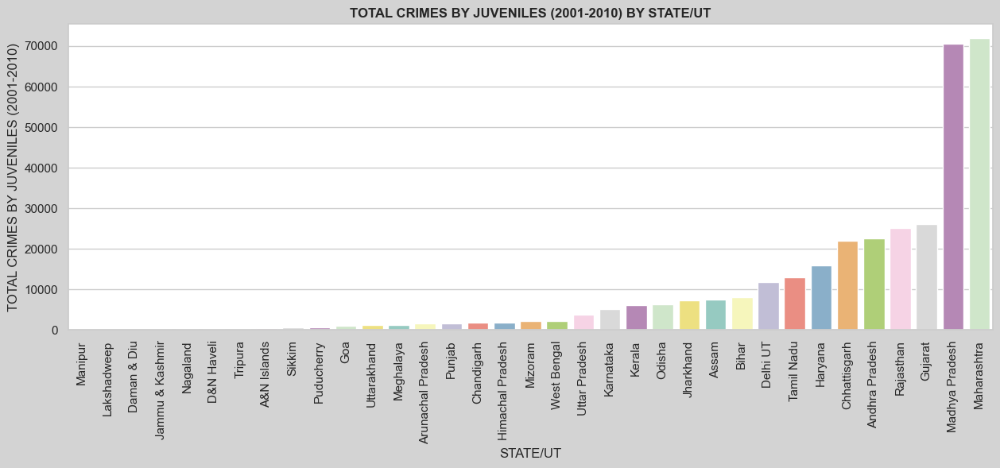

In [279]:
# Bar graph: TOTAL CRIMES BY JUVENILES (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL CRIMES BY JUVENILES (2001-2010)'
state_ut_sorted = juvenile_apprehended_state_df.sort_values(by='TOTAL CRIMES BY JUVENILES (2001-2010)')

# Use a different color palette (e.g., 'Set3') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL CRIMES BY JUVENILES (2001-2010)'], palette='Set3')

plt.title('TOTAL CRIMES BY JUVENILES (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2010, the data on crimes committed by juvenile offenders in India reveals significant variations across states and Union Territories. Manipur reported no cases during this period, while Maharashtra and Madhya Pradesh recorded higher instances of juvenile crimes. The numbers reflect diverse patterns of juvenile delinquency, emphasizing the need for targeted interventions and preventive measures to address this issue at the regional level.**

### Police killed and injured on duty

In [280]:
police_killed_injured_on_duty_data = pd.read_csv(r'C:\Users\hites\Downloads\India_Crime\India_Crime\13_Police_killed_or_injured_on_duty2001_2010.csv')

In [281]:
police_killed_injured_on_duty_data

,Area_Name,Year,Group_Name,Sub_Group_Name,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,Police_Injured_Total_Policemen,Police_Killed_By_Criminals,Police_Killed_By_Riotous_Mobs,Police_Killed_In_Accidents,Police_Killed_In_Dacoity_OperationsOther_raids,Police_Killed_In_TerroristsExtremists_Operations,Police_Killed_On_Border_Duties,Police_Killed_Total_Policemen
0,Andaman & Nicobar Islands,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Andhra Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,3,4,1,3,0,11,0,0,2,0,3,0,5
2,Arunachal Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Assam,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,1,0,1,0,0,1,0,0,0,1
4,Bihar,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,1,0,0,0,2,0,3,0,0,0,0,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,Tamil Nadu,2010,Police - Total,7. Total Police Killed or Injured,10,26,142,4,0,0,182,2,0,65,0,0,0,67
2446,Tripura,2010,Police - Total,7. Total Police Killed or Injured,0,0,0,0,2,0,2,0,0,0,0,0,2,2
2447,Uttar Pradesh,2010,Police - Total,7. Total Police Killed or Injured,6,10,9,10,0,8,43,2,1,101,0,0,1,105
2448,Uttarakhand,2010,Police - Total,7. Total Police Killed or Injured,0,0,5,0,0,0,5,0,0,15,0,0,0,15


In [282]:
# Display the names of the columns
police_killed_injured_on_duty_data.columns

Index(['Area_Name', 'Year', 'Group_Name', 'Sub_Group_Name',
       'Police_Injured_By_Criminals', 'Police_Injured_By_Riotous_Mobs',
       'Police_Injured_In_Accidents',
       'Police_Injured_In_Dacoity_OperationsOther_raids',
       'Police_Injured_In_TerroristsExtremists_Operations',
       'Police_Injured_On_Border_Duties', 'Police_Injured_Total_Policemen',
       'Police_Killed_By_Criminals', 'Police_Killed_By_Riotous_Mobs',
       'Police_Killed_In_Accidents',
       'Police_Killed_In_Dacoity_OperationsOther_raids',
       'Police_Killed_In_TerroristsExtremists_Operations',
       'Police_Killed_On_Border_Duties', 'Police_Killed_Total_Policemen'],
      dtype='object')

In [283]:
police_killed_injured_on_duty_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2450 entries, 0 to 2449
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype 
---  ------                                             --------------  ----- 
 0   Area_Name                                          2450 non-null   object
 1   Year                                               2450 non-null   int64 
 2   Group_Name                                         2450 non-null   object
 3   Sub_Group_Name                                     2450 non-null   object
 4   Police_Injured_By_Criminals                        2450 non-null   int64 
 5   Police_Injured_By_Riotous_Mobs                     2450 non-null   int64 
 6   Police_Injured_In_Accidents                        2450 non-null   int64 
 7   Police_Injured_In_Dacoity_OperationsOther_raids    2450 non-null   int64 
 8   Police_Injured_In_TerroristsExtremists_Operations  2450 non-null   int64 
 9   Police_Injured_On_B

In [286]:
# Checking for the null values in the dataset
police_killed_injured_on_duty_data.isnull().sum().any()

False

In [287]:
# Checking for the duplicated rows in the dataset
police_killed_injured_on_duty_data.duplicated().sum()

0

In [288]:
# Storing state/UT values
state_ut = police_killed_injured_on_duty_data['Area_Name'].unique()

# Creating a new DataFrame
police_killed_injured_on_duty_df = pd.DataFrame({'STATE/UT': state_ut})

In [289]:
# Adding up all the cases of police injured by criminals, rioutous mobs etc. for all the years
police_killed_injured_on_duty_df['POLICE INJURED BY CRIMINALS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Injured_By_Criminals'].sum().to_list()
police_killed_injured_on_duty_df['POLICE INJURED BY RIOTOUS MOBS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Injured_By_Riotous_Mobs'].sum().to_list()
police_killed_injured_on_duty_df['POLICE INJURED IN ACCIDENTS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Injured_In_Accidents'].sum().to_list()
police_killed_injured_on_duty_df['POLICE INJURED IN DACOITY OPERATIONS OTHER RAIDS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Injured_In_Dacoity_OperationsOther_raids'].sum().to_list()
police_killed_injured_on_duty_df['POLICE INJURED IN TERRORISTS EXTREMISTS OPERATIONS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Injured_In_TerroristsExtremists_Operations'].sum().to_list()
police_killed_injured_on_duty_df['POLICE INJURED ON BORDER DUTIES (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Injured_On_Border_Duties'].sum().to_list()

# Adding up all the cases of police killed by criminals, rioutous mobs etc. for all the years
police_killed_injured_on_duty_df['POLICE KILLED BY CRIMINALS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Killed_By_Criminals'].sum().to_list()
police_killed_injured_on_duty_df['POLICE KILLED BY RIOTOUS MOBS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Killed_By_Riotous_Mobs'].sum().to_list()
police_killed_injured_on_duty_df['POLICE KILLED IN ACCIDENTS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Killed_In_Accidents'].sum().to_list()
police_killed_injured_on_duty_df['POLICE KILLED IN DACOITY OPERATIONS OTHER RAIDS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Killed_In_Dacoity_OperationsOther_raids'].sum().to_list()
police_killed_injured_on_duty_df['POLICE KILLED IN TERRORISTS EXTREMISTS OPERATIONS (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Killed_In_TerroristsExtremists_Operations'].sum().to_list()
police_killed_injured_on_duty_df['POLICE KILLED ON BORDER DUTIES (2001-2010)'] = police_killed_injured_on_duty_data.groupby('Area_Name', sort = False)['Police_Killed_On_Border_Duties'].sum().to_list()

# Adding up all the cases of police injured and police killed for all the years
police_killed_injured_on_duty_df['TOTAL POLICEMENT INJURED (2001-2010)'] = police_killed_injured_on_duty_df[['POLICE INJURED BY CRIMINALS (2001-2010)', 'POLICE INJURED BY RIOTOUS MOBS (2001-2010)', 'POLICE INJURED IN ACCIDENTS (2001-2010)', 'POLICE INJURED IN DACOITY OPERATIONS OTHER RAIDS (2001-2010)', 'POLICE INJURED IN TERRORISTS EXTREMISTS OPERATIONS (2001-2010)', 'POLICE INJURED ON BORDER DUTIES (2001-2010)']].sum(axis = 1)
police_killed_injured_on_duty_df['TOTAL POLICEMENT KILLED (2001-2010)'] = police_killed_injured_on_duty_df[['POLICE KILLED BY CRIMINALS (2001-2010)', 'POLICE KILLED BY RIOTOUS MOBS (2001-2010)', 'POLICE KILLED IN ACCIDENTS (2001-2010)', 'POLICE KILLED IN DACOITY OPERATIONS OTHER RAIDS (2001-2010)', 'POLICE KILLED IN TERRORISTS EXTREMISTS OPERATIONS (2001-2010)', 'POLICE KILLED ON BORDER DUTIES (2001-2010)']].sum(axis = 1)

In [290]:
police_killed_injured_on_duty_df[['STATE/UT', 'TOTAL POLICEMENT INJURED (2001-2010)']].sort_values(by = 'TOTAL POLICEMENT INJURED (2001-2010)')

,STATE/UT,TOTAL POLICEMENT INJURED (2001-2010)
7,Dadra & Nagar Haveli,0
8,Daman & Diu,0
18,Lakshadweep,0
29,Sikkim,6
24,Nagaland,10
23,Mizoram,10
0,Andaman & Nicobar Islands,22
2,Arunachal Pradesh,80
21,Manipur,86
33,Uttarakhand,182


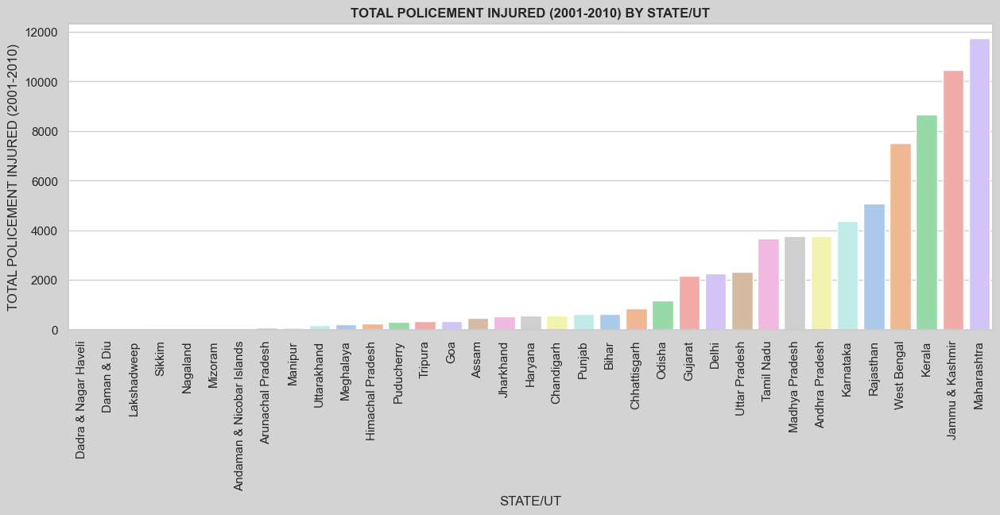

In [291]:
# Bar graph: TOTAL POLICEMENT INJURED (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL POLICEMENT INJURED (2001-2010)'
state_ut_sorted = police_killed_injured_on_duty_df.sort_values(by='TOTAL POLICEMENT INJURED (2001-2010)')

# Use a different color palette (e.g., 'pastel') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL POLICEMENT INJURED (2001-2010)'], palette='pastel')

plt.title('TOTAL POLICEMENT INJURED (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2010, the data on police injuries across states and Union Territories in India indicates variations in the number of incidents. Dadra & Nagar Haveli, Daman & Diu, and Lakshadweep reported no cases of police injuries during this period. However, states like Maharashtra, Jammu & Kashmir, Kerela, and West Bengal recorded higher instances of injuries sustained by police personnel. These numbers reflect the challenging nature of law enforcement duties in different regions, emphasizing the importance of ensuring the safety and well-being of police officers through appropriate measures and training.**

In [292]:
police_killed_injured_on_duty_df[['STATE/UT', 'TOTAL POLICEMENT KILLED (2001-2010)']].sort_values(by = 'TOTAL POLICEMENT KILLED (2001-2010)')

,STATE/UT,TOTAL POLICEMENT KILLED (2001-2010)
7,Dadra & Nagar Haveli,0
8,Daman & Diu,0
18,Lakshadweep,0
2,Arunachal Pradesh,2
26,Puducherry,2
10,Goa,4
0,Andaman & Nicobar Islands,10
24,Nagaland,10
29,Sikkim,26
23,Mizoram,38


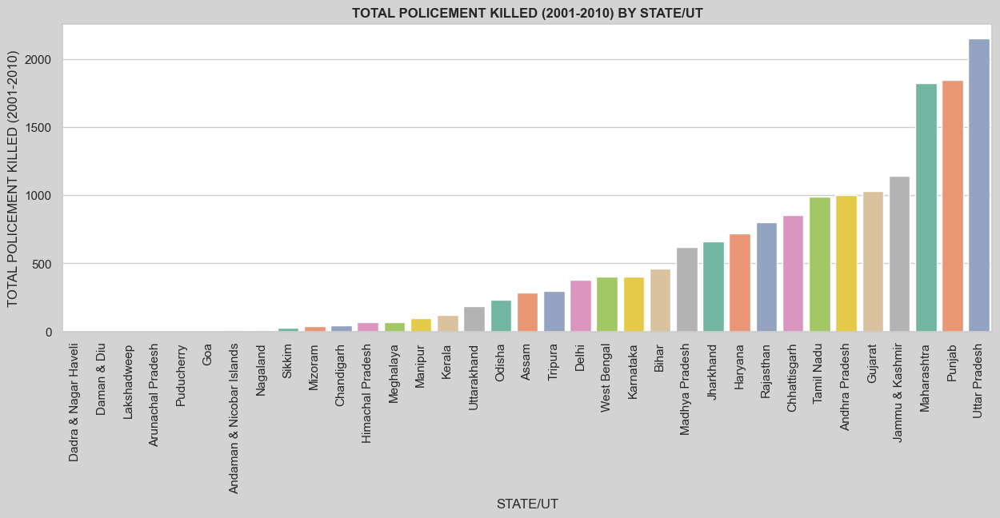

In [293]:
# Bar graph: TOTAL POLICEMENT KILLED (2001-2010) BY STATE/UT
plt.figure(figsize=(15, 5), facecolor='lightgray')  # Set facecolor for the entire figure

# Sort the DataFrame by 'TOTAL POLICEMENT KILLED (2001-2010)'
state_ut_sorted = police_killed_injured_on_duty_df.sort_values(by='TOTAL POLICEMENT KILLED (2001-2010)')

# Use a different color palette (e.g., 'Set2') for the bars
sns.barplot(x=state_ut_sorted['STATE/UT'], y=state_ut_sorted['TOTAL POLICEMENT KILLED (2001-2010)'], palette='Set2')

plt.title('TOTAL POLICEMENT KILLED (2001-2010) BY STATE/UT', fontweight='bold')  # Set font weight for the title
plt.xticks(rotation=90)
plt.show()


#### Observations:

**From 2001 to 2010, the data on police personnel killed in various states and Union Territories in India reflects the risks and challenges faced by law enforcement officers. Dadra & Nagar Haveli, Daman & Diu, and Lakshadweep reported no cases of police personnel being killed during this period. However, states like Uttar Pradesh, Punjab, and Maharashtra recorded higher instances of police casualties, emphasizing the need for measures to enhance the safety and security of law enforcement personnel while performing their duties. The data underscores the importance of addressing the factors contributing to such incidents and implementing strategies to minimize risks in the line of duty.**

## 2.6	Each state and UT crime report.

### Crime reports of states

### Andhra Pradesh
Area: 275,045 sq. km.

Average Literacy Rate: 64.07%

Average Population (2001-2012): 80,642,987

Reported a total of 1,858,637 IPC crimes during the specified period.

Andhra Pradesh witnessed higher crime rates across various categories. Notable figures include cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes during this period were substantial.

### Arunachal Pradesh
Area: 83,743 sq. km.

Average Literacy Rate: 60.41%

Average Population (2001-2012): 1,255,298

Recorded 26,791 IPC crimes.

Arunachal Pradesh reported moderate crime rates, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Arunachal Pradesh during this period were comparatively lower.

### Assam
Area: 78,438 sq. km.

Average Literacy Rate: 68.17%

Average Population (2001-2012): 29,130,470

Witnessed 546,002 IPC crimes.

Assam experienced a significant number of crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Assam during this period were notable.

### Bihar
Area: 94,163 sq. km.

Average Literacy Rate: 55.14%

Average Population (2001-2012): 94,388,506

Reported a total of 1,011,418 IPC crimes.

Bihar faced high crime rates, reporting cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Bihar during this period were substantial.


### Chhattisgarh
Area: 135,192 sq. km.

Average Literacy Rate: 67.75%

Average Population (2001-2012): 23,422,646

Recorded 393,228 IPC crimes.

Chhattisgarh exhibited high crime rates, reporting cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Chhattisgarh during this period were noteworthy.

### Goa
Area: 3,702 sq. km.

Average Literacy Rate: 85.69%

Average Population (2001-2012): 1,408,753

Reported 30,734 IPC crimes.

Goa reported cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Goa during this period were comparatively lower.

### Gujarat
Area: 196,244 sq. km.

Average Literacy Rate: 74.03%

Average Population (2001-2012): 55,979,735

Witnessed 888,793 IPC crimes.

Gujarat faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Gujarat during this period were substantial.


### Haryana
Area: 44,212 sq. km.

Average Literacy Rate: 72.11%

Average Population (2001-2012): 23,651,950

Recorded a total of 516,919 IPC crimes.

Haryana faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Haryana during this period were significant.

### Himachal Pradesh
Area: 55,673 sq. km.

Average Literacy Rate: 79.96%

Average Population (2001-2012): 6,505,934

Reported 81,030 IPC crimes.

Himachal Pradesh reported various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Himachal Pradesh during this period were notable.

### Jammu & Kashmir
Area: 222,236 sq. km.

Average Literacy Rate: 61.92%

Average Population (2001-2012): 11,433,544

Witnessed 164,476 IPC crimes.

Jammu & Kashmir faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Jammu & Kashmir during this period were substantial.


### Jharkhand
Area: 79,716 sq. km.

Average Literacy Rate: 60.63%

Average Population (2001-2012): 30,269,205

Recorded 357,069 IPC crimes.

Jharkhand faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Jharkhand during this period were significant.

### Karnataka
Area: 191,791 sq. km.

Average Literacy Rate: 71.18%

Average Population (2001-2012): 57,352,631

Reported a total of 1,014,890 IPC crimes.

Karnataka faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Karnataka during this period were substantial.

### Kerala
Area: 38,852 sq. km.

Average Literacy Rate: 92.59%

Average Population (2001-2012): 32,690,772

Witnessed 680,267 IPC crimes.

Kerala faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Kerala during this period were noteworthy.


### Madhya Pradesh
Area: 308,252 sq. km.

Average Literacy Rate: 66.81%

Average Population (2001-2012): 67,101,951

Recorded a substantial figure of 1,529,093 IPC crimes.

Madhya Pradesh faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Madhya Pradesh during this period were significant.


### Maharashtra
Area: 307,713 sq. km.

Average Literacy Rate: 79.87%

Average Population (2001-2012): 105,343,760

Reported the highest number with 2,303,270 IPC crimes.

Maharashtra faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Maharashtra during this period were substantial.


### Manipur
Area: 22,327 sq. km.

Average Literacy Rate: 74.04%

Average Population (2001-2012): 2,529,482

Recorded 29,367 IPC crimes.

Manipur faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Manipur during this period were notable.

### Meghalaya
Area: 22,429 sq. km.

Average Literacy Rate: 69.09%

Average Population (2001-2012): 2,668,147

Witnessed 26,738 IPC crimes.

Meghalaya faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Meghalaya during this period were substantial.

### Mizoram
Area: 21,081 sq. km.

Average Literacy Rate: 90.19%

Average Population (2001-2012): 1,000,418

Reported 30,959 IPC crimes.

Mizoram faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Mizoram during this period were noteworthy.

### Nagaland
Area: 16,579 sq. km.

Average Literacy Rate: 73.72%

Average Population (2001-2012): 1,984,955

Recorded 14,497 IPC crimes.

Nagaland faced various crimes, including cases of murder, rape, kidnapping, theft, riots, crimes against children, and crimes against women. The total IPC crimes in Nagaland during this period were notable.

### Odisha
Area: 155,707 sq. km.

Average Literacy Rate: 68.46%

Average Population (2001-2012): 39,589,602

Reported 505,736 IPC crimes.

Odisha faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Odisha during this period were significant.

### Punjab
Area: 50,362 sq. km.

Average Literacy Rate: 73.05%

Average Population (2001-2012): 26,167,438

Witnessed 331,685 IPC crimes.

Punjab faced various crimes, including cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Punjab during this period were substantial.

### Rajasthan
Area: 342,239 sq. km.

Average Literacy Rate: 63.54%

Average Population (2001-2012): 63,154,542

Recorded a total of 1,350,424 IPC crimes.

Rajasthan experienced notable crime rates during the period from 2001 to 2012. The state reported cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Rajasthan during this period were substantial.

### Sikkim
Area: 7,096 sq. km.

Average Literacy Rate: 75.75%

Average Population (2001-2012): 578,084

Reported 6,253 IPC crimes.

Sikkim reported relatively lower crime rates, with cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Sikkim during this period were comparatively lower.

### Tamil Nadu
Area: 130,060 sq. km.

Average Literacy Rate: 77.23%

Average Population (2001-2012): 67,626,552

Witnessed 1,081,476 IPC crimes.

Tamil Nadu, a populous state, reported cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Tamil Nadu during this period were substantial.

### Tripura
Area: 10,486 sq. km.

Average Literacy Rate: 80.91%

Average Population (2001-2012): 3,455,414

Recorded 46,814 IPC crimes.

Tripura reported cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Tripura during this period were noteworthy.

### Uttar Pradesh
Area: 240,928 sq. km.

Average Literacy Rate: 62.55%

Average Population (2001-2012): 184,493,932

Reported a substantial figure of 1,621,496 IPC crimes.

Uttar Pradesh, being one of the most populous states, reported significantly high crime rates. The state recorded cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Uttar Pradesh during this period were substantial.

### Uttarakhand
Area: 53,483 sq. km.

Average Literacy Rate: 75.58%

Average Population (2001-2012): 9,384,309

Witnessed 101,131 IPC crimes.

Uttarakhand reported cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in Uttarakhand during this period were notable.

### West Bengal
Area: 88,752 sq. km.

Average Literacy Rate: 72.83%

Average Population (2001-2012): 86,340,840

Recorded 930,364 IPC crimes.

West Bengal reported cases of murder, rape, kidnapping, theft, riots, dowry deaths, crimes against children, and crimes against women. The total IPC crimes in West Bengal during this period were substantial.

### Crime reports of UTs

### Andaman & Nicobar Islands
Area: 8,249 sq. km.

Average Literacy Rate: 84.23%

Average Population (2001-2012): 369,462

Reported 5,986 IPC crimes.

Examining the crime data for the period from 2001 to 2012 in the Andaman & Nicobar Islands reveals a relatively secure environment with lower crime rates. The recorded figures include 160 cases of murder, 109 cases of rape, 94 incidents of kidnapping and abduction, and 1124 thefts. Other notable statistics include 140 cases of riots, 6 dowry deaths, and a total of 245 crimes against children. Crimes against women totaled 570, while there were no reported crimes against Scheduled Castes (SCs) and 41 against Scheduled Tribes (STs). The overall incidence of IPC crimes in the Andaman & Nicobar Islands during this period amounted to 10,429.

### Chandigarh
Area: 114 sq. km.

Average Literacy Rate: 84.20%

Average Population (2001-2012): 985,563

Witnessed 48,597 IPC crimes.

Chandigarh reported moderate crime rates, with cases of murder, rape, and kidnapping and abduction. Theft incidents, riots, dowry deaths, crimes against children, crimes against women, and total IPC crimes in Chandigarh during this period were specific values.

### Dadra & Nagar Haveli
Area: 491 sq. km.

Average Literacy Rate: 67.87%

Average Population (2001-2012): 288,002

Recorded 3,762 IPC crimes.

Dadra & Nagar Haveli reported relatively low crime rates, with cases of murder, rape, and kidnapping and abduction. Theft incidents, riots, dowry deaths, crimes against children, crimes against women, and total IPC crimes in Dadra & Nagar Haveli during this period were specific values.

### Daman & Diu
Area: 111 sq. km.

Average Literacy Rate: 83.09%

Average Population (2001-2012): 204,737

Reported 2,902 IPC crimes.

Daman & Diu reported cases of murder, rape, and kidnapping and abduction. Theft incidents, riots, dowry deaths, crimes against children, crimes against women, and total IPC crimes in Daman & Diu during this period were specific values.

### Delhi
Area: 1,483 sq. km.

Average Literacy Rate: 84.17%

Average Population (2001-2012): 15,447,456

Witnessed a high number of 1,317,540 IPC crimes.

Delhi faced various crimes, including cases of murder, rape, and kidnapping and abduction. Theft incidents, riots, dowry deaths, crimes against children, crimes against women, and total IPC crimes in Delhi during this period were specific values.

### Lakshadweep
Area: 30 sq. km.

Average Literacy Rate: 89.51%

Average Population (2001-2012): 63,021

Reported a minimal figure of 537 IPC crimes.

Lakshadweep reported low crime rates, with cases of murder, rape, and kidnapping and abduction. Theft incidents, riots, dowry deaths, crimes against children, crimes against women, and total IPC crimes in Lakshadweep during this period were specific values.

### Puducherry
Area: 490 sq. km.

Average Literacy Rate: 83.78%

Average Population (2001-2012): 1,123,124

Recorded 34,238 IPC crimes.

Puducherry faced various crimes, including cases of murder, rape, and kidnapping and abduction. Theft incidents, riots, dowry deaths, crimes against children, crimes against women, and total IPC crimes in Puducherry during this period were specific values.

# End Of The Phase-2 